In [ ]:
#comparison of small (POC) and large (GOC) particulate organic carbon from UVP5 measurements and PlankTOM12

In [208]:
import pandas as pd
import numpy as np
from datetime import date
import matplotlib.pyplot as plt
import random
import scipy.io
from scipy import stats
from scipy.signal import *
from mpl_toolkits.basemap import Basemap
import dataframe_image as dfi

In [209]:
#rescale variable
def convert(x,names):
    for col_name in names:
        x[col_name] = x[col_name] * 1000000.
    return x

In [210]:
#convert biovolume to biomass
def biovol_to_biomass(x):
    for i in np.arange(0,x.columns.size,1):
        name_biovol = x.columns[i]  
        if name_biovol[:6] == 'biovol' and len(name_biovol) == 8:
            x[name_biovol+'_wvL'] = 0.99 * (x[name_biovol]*x['watervolume'])**0.52
        
    return x

In [244]:
#convert biovolume to biomass
def biovol_to_biomass2(x):
    for i in np.arange(0,x.columns.size,1):
        name_biovol = x.columns[i]  
        if name_biovol[:9] == 'biovolume':
            x[name_biovol+'_wvL'] = 0.99 * (x[name_biovol]*x['watervolume'])**0.52
        
    return x

In [211]:
#summ columns of dataframe
def sum_columns(x):
    name = ['POC_wvL','GOC_wvL','POC_wvL_low','GOC_wvL_low','POC_wvL_high','GOC_wvL_high','POC_wvL_all','GOC_wvL_all',\
           'POC_wvL_low2','GOC_wvL_low2','POC_wvL_high2','GOC_wvL_high2','POC_wvL_low2_all','GOC_wvL_low2_all',\
           'POC_wvL_high2_all','GOC_wvL_high2_all']
    column_left = ["biovol21_wvL","biovol25_wvL","biovol21_wvL","biovol24_wvL","biovol21_wvL","biovol26_wvL",\
                  "biovol21_wvL","biovol25_wvL","biovol21_wvL","biovol21_wvL","biovol21_wvL","biovol27_wvL",\
                  "biovol21_wvL","biovol21_wvL","biovol21_wvL","biovol27_wvL"]
    column_right = ["biovol24_wvL","biovol37_wvL","biovol23_wvL","biovol37_wvL","biovol25_wvL","biovol37_wvL",\
                   "biovol24_wvL","biovol45_wvL","biovol20_wvL","biovol37_wvL","biovol26_wvL","biovol37_wvL",\
                   "biovol20_wvL","biovol45_wvL","biovol26_wvL","biovol45_wvL"]
    for i in np.arange(0,len(name),1):
        x[name[i]] = x.loc[: , column_left[i]:column_right[i]].sum(axis=1)

    return x

In [212]:
#conbirt biomass to umol/L
def biomass_umolL(x):
    name = ['POC_wvL','GOC_wvL','POC_wvL_low','GOC_wvL_low','POC_wvL_high','GOC_wvL_high','POC_wvL_all','GOC_wvL_all',\
           'POC_wvL_low2','GOC_wvL_low2','POC_wvL_high2','GOC_wvL_high2','POC_wvL_low2_all','GOC_wvL_low2_all',\
           'POC_wvL_high2_all','GOC_wvL_high2_all']
    name_biomass = ['POC_Mmol_wvL','GOC_Mmol_wvL','POC_Mmol_wvL_low','GOC_Mmol_wvL_low','POC_Mmol_wvL_high',\
                    'GOC_Mmol_wvL_high','POC_Mmol_wvL_all','GOC_Mmol_wvL_all','POC_Mmol_wvL_low2',\
                    'GOC_Mmol_wvL_low2','POC_Mmol_wvL_high2','GOC_Mmol_wvL_high2','POC_Mmol_wvL_low2_all',\
                    'GOC_Mmol_wvL_low2_all','POC_Mmol_wvL_high2_all','GOC_Mmol_wvL_high2_all']
    for i in np.arange(0,len(name),1):
        x[name_biomass[i]] = (x[name[i]] / x['watervolume']) / 12.0107

    return x

In [213]:
#plot a scatter plot of two dataframes
def plot_fun(df,var_name1,var_name2,y_ax_name,xlim_l,xlim_r,filenamesave):
    plt.figure(figsize=[20. , 15.],facecolor='w') 
    plt.scatter(df[var_name1].values,-df.depth.values,label = 'Obs, UVP5G')
    plt.scatter(df[var_name2].values,-df.depth.values,label = 'PlankTOM')
    plt.plot(df.groupby('depth').mean().reset_index()[var_name1],-df.groupby('depth').mean().reset_index()['depth'].values,'y', linewidth = 4,label = 'Obs mean, UVP5G') 
    plt.plot(df.groupby('depth').mean().reset_index()[var_name2],-df.groupby('depth').mean().reset_index()['depth'].values,'k', linewidth = 4,label = 'PlankTOM mean')
    locsX,labelsx = plt.xticks(size=30)
    plt.xlabel(y_ax_name+', \u03BCmol/L',fontsize=30)
    plt.ylabel('depth,m',fontsize=30)
    locsY,labelsy = plt.yticks(size=30)   
    plt.legend(fontsize = 'x-large')
    plt.xlim([xlim_l,xlim_r])
    plt.savefig('/Figures_Article/'+filenamesave)


In [214]:
#estimation of root-mean-square error
def RMSE(x,y):
    rmse = np.sqrt(np.mean((x - y)**2))
    
    return rmse

In [215]:
#plot global distribution of available data
def plot_glob_distr(x,lat_name,lon_name,file_name):
    plt.figure(figsize=[20. , 15.],facecolor='w')
    m = Basemap(projection='cyl',llcrnrlat=-90,urcrnrlat=90,\
                llcrnrlon=-180,urcrnrlon=180)
    m.fillcontinents(color='grey',lake_color='white',zorder = 0)
    parallels = np.arange(-80.,81,20.)
    m.drawparallels(parallels,dashes=[1,10],labels=[1,0,0,0],fontsize=15) #[False,True,True,False])
    meridians = np.arange(10.,351.,20.)
    m.drawmeridians(meridians,dashes=[1,10],labels=[True,False,False,True],fontsize=15)
    m.scatter(x[lon_name].values,x[lat_name].values, latlon = True, \
              c=np.ones(len(x[lon_name].values)),s=70,\
              cmap='jet',alpha = None, edgecolors = 'k')
    cbar = plt.colorbar(orientation='horizontal')
    cbar.set_label(label=r'Data',size=20, weight='bold')
    cbar.ax.tick_params(labelsize=20)
    plt.savefig('/Figures_Article/'+file_name)

In [216]:
#plot of data distribution from two dataframes
def plot_scatter_two_df(x,y,var_name,var_name1_plot,var_name2_plot,legend_name1,legend_name2,xlim_l,xlim_r,file_name,\
                        legend_sw,ylim_sw):
    plt.figure(figsize=[20. , 15.],facecolor='w')
    plt.scatter(x[var_name1_plot].values,-x.depth.values,label = legend_name1)
    plt.scatter(y[var_name2_plot].values,-y.depth.values,label = legend_name2)
    plt.plot(x.groupby('depth').mean().reset_index()[var_name1_plot],-x.groupby('depth').mean().reset_index()['depth'].values,'y', linewidth = 4,label = legend_name1+', mean')
    plt.plot(y.groupby('depth').mean().reset_index()[var_name2_plot],-y.groupby('depth').mean().reset_index()['depth'].values,'k', linewidth = 4,label = legend_name2+', mean')
    locsX,labelsx = plt.xticks(size=30)
    plt.xlabel(var_name+',\u03BCmol/L',fontsize=30)
    plt.ylabel('depth,m',fontsize=30)
    locsY,labelsy = plt.yticks(size=30)
    if legend_sw == 'on':
        plt.legend(fontsize = 30)
    plt.xlim([xlim_l,xlim_r])
    if ylim_sw == 'on':
        plt.ylim([-1685,85])
    plt.savefig('/Figures_Article/'+file_name)


In [217]:
#plot several profiles
def plot_mean_profiles(x1,x2,x3,x4,var_name,var_name1_plot,var_name2_plot,var_name3_plot,var_name4_plot,\
                      legend_name1,legend_name2,legend_name3,legend_name4,file_name):
    plt.figure(figsize=[20. , 15.],facecolor='w')
    plt.plot(x1[var_name1_plot].values,-x1.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name1)
    plt.plot(x2[var_name2_plot].values,-x2.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name2)
    plt.plot(x3[var_name3_plot].values,-x3.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name3)
    plt.plot(x4[var_name4_plot].values,-x4.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = legend_name4) 
    locsX,labelsx = plt.xticks(size=30)
    plt.xlabel(var_name+',\u03BCmol/L',fontsize=30)
    plt.ylabel('depth,m',fontsize=30)
    locsY,labelsy = plt.yticks(size=30)   
    plt.legend(fontsize = 30)
    plt.savefig('/Figures_Article/'+file_name)

In [424]:
#read data
r_filenameTSV = 'Ecopart_data_2008_to_2010_subm_20201113.tsv'
data_20082010 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV = 'Ecopart_data_2011_to_2013 _subm_20210120.tsv'
data_20112013 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV = 'Ecopart_data_2014_to_2016_subm_20210120.tsv'
data_20142016 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV = 'Ecopart_data_2017_to_2019_subm_20210120.tsv'
data_20172019 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV = 'Ecopart_data_2020_to_2022_subm_20210120.tsv'
data_20202022 = pd.read_csv(r_filenameTSV,sep='\t' )

In [425]:
Data_concat_20082013 = pd.concat([data_20082010, data_20112013],ignore_index=True, sort=False).sort_values(['Date_Time', 'Latitude','Longitude','Pressure [dbar]']).reset_index()
All_Data_concat = pd.concat([data_20082010, data_20112013, data_20142016, data_20172019, data_20202022],ignore_index=True, sort=False).sort_values(['Date_Time', 'Latitude','Longitude','Pressure [dbar]']).reset_index()


In [426]:
#rename columns
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.032-0.0403 mm)": "biovol16"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0403-0.0508 mm)": "biovol17"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0508-0.064 mm)": "biovol18"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.064-0.0806 mm)": "biovol19"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0806-0.102 mm)": "biovol20"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.102-0.128 mm)": "biovol21"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.128-0.161 mm)": "biovol22"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.161-0.203 mm)": "biovol23"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.203-0.256 mm)": "biovol24"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.256-0.323 mm)": "biovol25"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.323-0.406 mm)": "biovol26"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.406-0.512 mm)": "biovol27"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.512-0.645 mm)": "biovol28"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.645-0.813 mm)": "biovol29"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.813-1.02 mm)": "biovol30"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.02-1.29 mm)": "biovol31"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.29-1.63 mm)": "biovol32"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.63-2.05 mm)": "biovol33"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 2.05-2.58 mm)": "biovol34"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 2.58-3.25 mm)": "biovol35"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 3.25-4.1 mm)": "biovol36"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 4.1-5.16 mm)": "biovol37"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 5.16-6.5 mm)": "biovol38"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 6.5-8.19 mm)": "biovol39"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 8.19-10.3 mm)": "biovol40"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 10.3-13 mm)": "biovol41"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 13-16.4 mm)": "biovol42"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 16.4-20.6 mm)": "biovol43"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 20.6-26 mm)": "biovol44"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: >26 mm)": "biovol45"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.032-0.0403 mm)": "nb16"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.0403-0.0508 mm)": "nb17"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.0508-0.064 mm)": "nb18"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.064-0.0806 mm)": "nb19"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.0806-0.102 mm)": "nb20"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.102-0.128 mm)": "nb21"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.128-0.161 mm)": "nb22"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.161-0.203 mm)": "nb23"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.203-0.256 mm)": "nb24"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.256-0.323 mm)": "nb25"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.323-0.406 mm)": "nb26"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.406-0.512 mm)": "nb27"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.512-0.645 mm)": "nb28"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.645-0.813 mm)": "nb29"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 0.813-1.02 mm)": "nb30"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 1.02-1.29 mm)": "nb31"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 1.29-1.63 mm)": "nb32"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 1.63-2.05 mm)": "nb33"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 2.05-2.58 mm)": "nb34"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 2.58-3.25 mm)": "nb35"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 3.25-4.1 mm)": "nb36"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 4.1-5.16 mm)": "nb37"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 5.16-6.5 mm)": "nb38"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 6.5-8.19 mm)": "nb39"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 8.19-10.3 mm)": "nb40"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 10.3-13 mm)": "nb41"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 13-16.4 mm)": "nb42"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 16.4-20.6 mm)": "nb43"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: 20.6-26 mm)": "nb44"}, inplace=True)
All_Data_concat.rename(columns={"Part conc frac [#/l] (ESD: >26 mm)": "nb45"}, inplace=True)
All_Data_concat.rename(columns={"Latitude": "lat"}, inplace=True)
All_Data_concat.rename(columns={"Longitude": "lon"}, inplace=True)
All_Data_concat.rename(columns={"Vol [L] (sampled for this depth bin)": "watervolume"}, inplace=True)
All_Data_concat.rename(columns={"Pressure [dbar]": "depth"}, inplace=True)


In [427]:
#read data
r_filenameTSV = 'Extrapolation_UVP5_20082013_15072022.csv'
data_small_20082013 = pd.read_csv(r_filenameTSV )

r_filenameTSV = 'Extrapolation_UVP5_20142016_15072022.csv'
data_small_20142016 = pd.read_csv(r_filenameTSV)

r_filenameTSV = 'Extrapolation_UVP5_20172019_15072022.csv'
data_small_20172019 = pd.read_csv(r_filenameTSV)

r_filenameTSV = 'Extrapolation_UVP5_20202022_15072022.csv'
data_small_20202022 = pd.read_csv(r_filenameTSV)

In [428]:
data_small_20202022

,Unnamed: 0,lat,lon,Date_Time,depth,nb00,nb0,nb1,nb2,nb3,...,nb6,nb7,nb8,nb9,nb10,nb11,nb12,nb13,nb14,nb15
0,0,7.24960,-50.8332,2020-01-28T16:03:50,57.5,17.176487,16.318918,15.755333,15.191749,14.628164,...,12.937411,12.373826,11.810242,11.246657,10.683073,10.119489,9.555904,8.992320,8.428735,7.865151
1,1,7.24960,-50.8332,2020-01-28T16:03:50,62.5,14.495572,13.765200,13.285208,12.805215,12.325223,...,10.885246,10.405254,9.925262,9.445269,8.965277,8.485285,8.005292,7.525300,7.045308,6.565315
2,2,7.24960,-50.8332,2020-01-28T16:03:50,67.5,17.493111,16.615459,16.038677,15.461894,14.885112,...,13.154765,12.577982,12.001200,11.424417,10.847635,10.270852,9.694070,9.117287,8.540505,7.963722
3,3,7.24960,-50.8332,2020-01-28T16:03:50,72.5,15.383165,14.611947,14.105111,13.598276,13.091440,...,11.570933,11.064098,10.557262,10.050426,9.543591,9.036755,8.529919,8.023084,7.516248,7.009413
4,4,7.24960,-50.8332,2020-01-28T16:03:50,77.5,12.646023,12.003721,11.581608,11.159494,10.737381,...,9.471041,9.048928,8.626814,8.204701,7.782588,7.360474,6.938361,6.516248,6.094134,5.672021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17251,17251,42.94298,9.9141,2020-03-13T05:17:55,112.5,27.221591,25.993318,25.186112,24.378906,23.571700,...,21.150081,20.342875,19.535669,18.728463,17.921257,17.114050,16.306844,15.499638,14.692432,13.885226
17252,17252,42.94298,9.9141,2020-03-13T05:17:55,117.5,23.768032,22.706034,22.008101,21.310168,20.612235,...,18.518437,17.820504,17.122571,16.424639,15.726706,15.028773,14.330840,13.632907,12.934975,12.237042
17253,17253,42.94298,9.9141,2020-03-13T05:17:55,122.5,24.796561,23.691360,22.965035,22.238710,21.512385,...,19.333410,18.607085,17.880760,17.154435,16.428110,15.701785,14.975460,14.249135,13.522810,12.796485
17254,17254,42.94298,9.9141,2020-03-13T05:17:55,127.5,24.512294,23.423637,22.708185,21.992732,21.277279,...,19.130921,18.415468,17.700016,16.984563,16.269110,15.553658,14.838205,14.122752,13.407300,12.691847


In [429]:
All_Data_small_concat

,index,Unnamed: 0,lat,lon,Date_Time,depth,nb00,nb0,nb1,nb2,...,nb6,nb7,nb8,nb9,nb10,nb11,nb12,nb13,nb14,nb15
0,335573,335573,38.96217,14.32367,2008-06-19T08:13:37,2.5,11.392513,10.900993,10.577973,10.254952,...,8.962869,8.639849,8.316828,7.993807,7.670787,7.347766,7.024745,6.701725,6.378704,6.055684
1,335574,335574,38.96217,14.32367,2008-06-19T08:13:37,7.5,23.070908,21.980393,21.263719,20.547046,...,17.680351,16.963677,16.247003,15.530330,14.813656,14.096982,13.380309,12.663635,11.946961,11.230288
2,335575,335575,38.96217,14.32367,2008-06-19T08:13:37,12.5,27.139580,25.868787,25.033637,24.198487,...,20.857887,20.022737,19.187587,18.352437,17.517287,16.682137,15.846987,15.011837,14.176686,13.341536
3,335576,335576,38.96217,14.32367,2008-06-19T08:13:37,17.5,23.173414,22.130118,21.444477,20.758835,...,18.016268,17.330626,16.644985,15.959343,15.273701,14.588060,13.902418,13.216776,12.531135,11.845493
4,335577,335577,38.96217,14.32367,2008-06-19T08:13:37,22.5,19.679451,18.819915,18.255039,17.690162,...,15.430655,14.865778,14.300901,13.736024,13.171148,12.606271,12.041394,11.476517,10.911640,10.346764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2061107,2056872,13016,39.26782,11.42673,2020-03-16T19:10:27,2597.5,28.745571,27.324673,26.390876,25.457079,...,21.721890,20.788092,19.854295,18.920498,17.986700,17.052903,16.119106,15.185308,14.251511,13.317714
2061108,2056873,13017,39.26782,11.42673,2020-03-16T19:10:27,2602.5,18.059194,17.154018,16.559147,15.964276,...,13.584793,12.989922,12.395051,11.800180,11.205309,10.610439,10.015568,9.420697,8.825826,8.230955
2061109,2056874,13018,39.26782,11.42673,2020-03-16T19:10:27,2607.5,24.871639,23.642368,22.834505,22.026642,...,18.795190,17.987327,17.179464,16.371601,15.563738,14.755875,13.948012,13.140149,12.332286,11.524423
2061110,2056875,13019,39.26782,11.42673,2020-03-16T19:10:27,2612.5,23.993740,22.805001,22.023775,21.242550,...,18.117649,17.336423,16.555198,15.773973,14.992747,14.211522,13.430297,12.649071,11.867846,11.086621


In [430]:
All_Data_concat

,index,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,Sample_id,...,biovol39,biovol40,biovol41,biovol42,biovol43,biovol44,biovol45,NBSS slope,NBSS intercept,NBSS slope stde
0,30104,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.615,-0.489,0.0632
1,30105,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.340,-3.720,0.0912
2,30106,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.640,-4.360,0.0676
3,30107,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.340,-2.590,0.0835
4,30108,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.140,-1.560,0.0409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084156,2073769,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.660,-6.220,0.1350
2084157,2073770,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.150,-4.240,0.1250
2084158,2073771,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.470,-5.440,0.1620
2084159,2073772,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.450,-5.330,0.0865


In [508]:
All_Data_concat.loc[0][50:100]

biovol24                    0
biovol25              0.13334
biovol26             0.064881
biovol27             0.093479
biovol28              0.17783
biovol29              0.27926
biovol30              0.31886
biovol31              0.33451
biovol32              0.40032
biovol33              0.85218
biovol34              0.95741
biovol35                    0
biovol36              0.84887
biovol37                    0
biovol38                    0
biovol39                    0
biovol40                    0
biovol41                    0
biovol42                    0
biovol43                    0
biovol44                    0
biovol45                    0
NBSS slope             -0.615
NBSS intercept         -0.489
NBSS slope stde        0.0632
date               2008-06-19
time                 08:13:37
year                     2008
month                       6
day                        19
Name: 0, dtype: object

In [431]:
All_Data_small_concat = pd.concat([data_small_20082013, data_small_20142016, data_small_20172019, data_small_20202022],ignore_index=True, sort=False).sort_values(['Date_Time', 'lat','lon','depth']).reset_index()


In [476]:
Small_Merge = All_Data_concat.merge(All_Data_small_concat, how='left', on=['lat','lon','Date_Time','depth'])

In [477]:
Small_Merge

,index_x,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,Sample_id,...,nb6,nb7,nb8,nb9,nb10,nb11,nb12,nb13,nb14,nb15
0,30104,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,8.962869,8.639849,8.316828,7.993807,7.670787,7.347766,7.024745,6.701725,6.378704,6.055684
1,30105,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,17.680351,16.963677,16.247003,15.530330,14.813656,14.096982,13.380309,12.663635,11.946961,11.230288
2,30106,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,20.857887,20.022737,19.187587,18.352437,17.517287,16.682137,15.846987,15.011837,14.176686,13.341536
3,30107,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,18.016268,17.330626,16.644985,15.959343,15.273701,14.588060,13.902418,13.216776,12.531135,11.845493
4,30108,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,15.430655,14.865778,14.300901,13.736024,13.171148,12.606271,12.041394,11.476517,10.911640,10.346764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084156,2073769,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084157,2073770,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084158,2073771,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084159,2073772,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [478]:
Small_Merge['nb30']

0          0.809060
1          0.050342
2          0.032362
3          0.128230
4          0.353050
             ...   
2084156    0.007379
2084157    0.014401
2084158    0.021956
2084159    0.015133
2084160    0.023704
Name: nb30, Length: 2084161, dtype: float64

In [479]:
All_Data_concat[['date','time']] = All_Data_concat.Date_Time.str.split("T",expand=True,)

All_Data_concat[['year','month','day']] = All_Data_concat.date.str.split("-",expand=True,)

All_Data_concat['year']  = All_Data_concat['year'].astype(int)
All_Data_concat['month'] = All_Data_concat['month'].astype(int)
All_Data_concat['day']   = All_Data_concat['day'].astype(int)

Data_concat_20082013[['date','time']] = Data_concat_20082013.Date_Time.str.split("T",expand=True,)

Data_concat_20082013[['year','month','day']] = Data_concat_20082013.date.str.split("-",expand=True,)

Data_concat_20082013['year']  = Data_concat_20082013['year'].astype(int)
Data_concat_20082013['month'] = Data_concat_20082013['month'].astype(int)
Data_concat_20082013['day']   = Data_concat_20082013['day'].astype(int)

In [480]:
Small_Merge[['date','time']] = Small_Merge.Date_Time.str.split("T",expand=True,)

Small_Merge[['year','month','day']] = Small_Merge.date.str.split("-",expand=True,)

Small_Merge['year']  = Small_Merge['year'].astype(int)
Small_Merge['month'] = Small_Merge['month'].astype(int)
Small_Merge['day']   = Small_Merge['day'].astype(int)

In [481]:
R16 = ((0.0403+0.032)/2.)/2.
R17 = ((0.0508+0.0403)/2.)/2.
R18 = ((0.064+0.0508)/2.)/2.
R19 = ((0.0806+0.064)/2.)/2.
R20 = ((0.102+0.0806)/2.)/2.
R21 = ((0.128+0.102)/2.)/2.
R22 = ((0.161+0.128)/2.)/2.
R23 = ((0.203+0.161)/2.)/2.
R24 = ((0.256+0.203)/2.)/2.
R25 = ((0.323+0.256)/2.)/2.
R26 = ((0.406+0.323)/2.)/2.
R27 = ((0.512+0.406)/2.)/2.
R28 = ((0.645+0.512)/2.)/2.
R29 = ((0.813+0.645)/2.)/2.
R30 = ((1.02+0.813)/2.)/2.
R31 = ((1.29+1.02)/2.)/2.
R32 = ((1.63+1.29)/2.)/2.
R33 = ((2.05+1.63)/2.)/2.
R34 = ((2.58+2.05)/2.)/2.
R35 = ((3.25+2.58)/2.)/2.
R36 = ((4.1+3.25)/2.)/2.
R37 = ((5.16+4.1)/2.)/2.
R38 = ((6.5+5.16)/2.)/2.
R39 = ((8.19+6.5)/2.)/2.
R40 = ((10.3+8.19)/2.)/2.
R41 = ((13.+10.3)/2.)/2.
R42 = ((16.4+13.)/2.)/2.
R43 = ((20.6+16.4)/2.)/2.
R44 = ((26.+20.6)/2.)/2.

R15  = ((nb15 + 0.032)/2.)/2.
R14  = ((nb14 + nb15)/2.)/2.
R13  = ((nb13 + nb14)/2.)/2.
R12  = ((nb12 + nb13)/2.)/2.
R11  = ((nb11 + nb12)/2.)/2.
R10  = ((nb10 + nb11)/2.)/2.
R9   = ((nb9 + nb10)/2.)/2.
R8   = ((nb8 + nb9)/2.)/2.
R7   = ((nb7 + nb8)/2.)/2.
R6   = ((nb6 + nb7)/2.)/2.
R5   = ((nb5 + nb6)/2.)/2.
R4   = ((nb4 + nb5)/2.)/2.
R3   = ((nb3 + nb4)/2.)/2.
R2   = ((nb2 + nb3)/2.)/2.
R1   = ((nb1 + nb2)/2.)/2.
R0   = ((nb0 + nb1)/2.)/2.
R00  = ((nb00 + nb00)/2.)/2.


In [588]:
nb10

0.011313708498984755

In [558]:
nb0

0.001999999999999999

In [482]:
biov44 = (4.* np.pi * R44**3)/3. 
biov43 = (4.* np.pi * R43**3)/3. 
biov42 = (4.* np.pi * R42**3)/3. 
biov41 = (4.* np.pi * R41**3)/3. 
biov40 = (4.* np.pi * R40**3)/3. 
biov39 = (4.* np.pi * R39**3)/3. 
biov38 = (4.* np.pi * R38**3)/3. 
biov37 = (4.* np.pi * R37**3)/3. 
biov36 = (4.* np.pi * R36**3)/3. 
biov35 = (4.* np.pi * R35**3)/3. 
biov34 = (4.* np.pi * R34**3)/3. 
biov33 = (4.* np.pi * R33**3)/3.
biov32 = (4.* np.pi * R32**3)/3. 
biov31 = (4.* np.pi * R31**3)/3. 
biov30 = (4.* np.pi * R30**3)/3. 
biov29 = (4.* np.pi * R29**3)/3. 
biov28 = (4.* np.pi * R28**3)/3. 
biov27 = (4.* np.pi * R27**3)/3. 
biov26 = (4.* np.pi * R26**3)/3. 
biov25 = (4.* np.pi * R25**3)/3. 
biov24 = (4.* np.pi * R24**3)/3. 
biov23 = (4.* np.pi * R23**3)/3. 
biov22 = (4.* np.pi * R22**3)/3. 
biov21 = (4.* np.pi * R21**3)/3. 
biov20 = (4.* np.pi * R20**3)/3. 
biov19 = (4.* np.pi * R19**3)/3. 
biov18 = (4.* np.pi * R18**3)/3. 
biov17 = (4.* np.pi * R17**3)/3. 
biov16 = (4.* np.pi * R16**3)/3. 

biov15 = (4.* np.pi * R15**3)/3. 
biov14 = (4.* np.pi * R14**3)/3. 
biov13 = (4.* np.pi * R13**3)/3. 
biov12 = (4.* np.pi * R12**3)/3. 
biov11 = (4.* np.pi * R11**3)/3. 
biov10 = (4.* np.pi * R10**3)/3. 
biov9  = (4.* np.pi * R9**3)/3. 
biov8  = (4.* np.pi * R8**3)/3. 
biov7  = (4.* np.pi * R7**3)/3. 
biov6  = (4.* np.pi * R6**3)/3. 
biov5  = (4.* np.pi * R5**3)/3. 
biov4  = (4.* np.pi * R4**3)/3. 
biov3  = (4.* np.pi * R3**3)/3. 
biov2  = (4.* np.pi * R2**3)/3. 
biov1  = (4.* np.pi * R1**3)/3. 
biov0  = (4.* np.pi * R0**3)/3. 
biov00 = (4.* np.pi * R00**3)/3. 

In [501]:
Small_Merge.loc[:,'nb0':'nb15']

,nb0,nb1,nb2,nb3,nb4,nb5,nb6,nb7,nb8,nb9,nb10,nb11,nb12,nb13,nb14,nb15
0,10.900993,10.577973,10.254952,9.931931,9.608911,9.285890,8.962869,8.639849,8.316828,7.993807,7.670787,7.347766,7.024745,6.701725,6.378704,6.055684
1,21.980393,21.263719,20.547046,19.830372,19.113698,18.397025,17.680351,16.963677,16.247003,15.530330,14.813656,14.096982,13.380309,12.663635,11.946961,11.230288
2,25.868787,25.033637,24.198487,23.363337,22.528187,21.693037,20.857887,20.022737,19.187587,18.352437,17.517287,16.682137,15.846987,15.011837,14.176686,13.341536
3,22.130118,21.444477,20.758835,20.073193,19.387552,18.701910,18.016268,17.330626,16.644985,15.959343,15.273701,14.588060,13.902418,13.216776,12.531135,11.845493
4,18.819915,18.255039,17.690162,17.125285,16.560408,15.995531,15.430655,14.865778,14.300901,13.736024,13.171148,12.606271,12.041394,11.476517,10.911640,10.346764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084156,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [502]:
Small_Merge.loc[:,'nb16':'nb37']

,nb16,nb17,nb18,nb19,nb20,nb21,nb22,nb23,nb24,nb25,...,nb28,nb29,nb30,nb31,nb32,nb33,nb34,nb35,nb36,nb37
0,0.0,0.0,0.0,0.0,0.000,0.0000,0.0000,0.0000,0.0000,10.4590,...,1.721100,1.323900,0.809060,0.485440,0.264780,0.235360,0.161810,0.0,0.02942,0.0
1,0.0,0.0,0.0,0.0,0.000,0.0000,0.0000,0.0000,0.0000,9.6656,...,0.280470,0.071917,0.050342,0.014383,0.014383,0.007192,0.000000,0.0,0.00000,0.0
2,0.0,0.0,0.0,0.0,0.000,0.0000,0.0000,0.0000,0.0000,11.7310,...,0.420710,0.145630,0.032362,0.000000,0.000000,0.000000,0.000000,0.0,0.00000,0.0
3,0.0,0.0,0.0,0.0,0.000,0.0000,0.0000,0.0000,0.0000,16.2850,...,1.575400,0.403000,0.128230,0.073273,0.000000,0.000000,0.000000,0.0,0.00000,0.0
4,0.0,0.0,0.0,0.0,0.000,0.0000,0.0000,0.0000,0.0000,24.1170,...,1.963800,0.728160,0.353050,0.176520,0.132390,0.000000,0.022065,0.0,0.00000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084156,0.0,0.0,0.0,0.0,21.569,9.5041,7.4306,9.0909,3.3058,2.1916,...,0.044274,0.014758,0.007379,0.000000,0.000000,0.000000,0.000000,0.0,0.00000,0.0
2084157,0.0,0.0,0.0,0.0,21.990,9.2742,7.6253,8.6982,3.5570,2.4266,...,0.079205,0.043203,0.014401,0.000000,0.014401,0.000000,0.000000,0.0,0.00000,0.0
2084158,0.0,0.0,0.0,0.0,21.912,9.1481,7.0624,9.0237,3.5641,2.3419,...,0.080504,0.014637,0.021956,0.000000,0.000000,0.000000,0.000000,0.0,0.00000,0.0
2084159,0.0,0.0,0.0,0.0,23.335,9.6852,7.2791,8.7167,3.9498,2.2246,...,0.052966,0.037833,0.015133,0.000000,0.000000,0.000000,0.000000,0.0,0.00000,0.0


In [483]:
for i in np.arange(0,Small_Merge.columns.size,1):
    name_abund = Small_Merge.columns[i]  
    if name_abund[:2] == 'nb' and (int(name_abund[2:]) < 16 or name_abund[2:] == '00'):
        Small_Merge['biovolume_'+name_abund[2:]] = np.exp(Small_Merge[name_abund]) * eval('biov'+name_abund[2:])
    if name_abund[:2] == 'nb' and (int(name_abund[2:]) > 15 and int(name_abund[2:]) < 45):
        Small_Merge['biovolume_'+name_abund[2:]] = Small_Merge[name_abund] * eval('biov'+name_abund[2:])


In [484]:
Small_Merge

,index_x,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,Sample_id,...,biovolume_6,biovolume_7,biovolume_8,biovolume_9,biovolume_10,biovolume_11,biovolume_12,biovolume_13,biovolume_14,biovolume_15
0,30104,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.000971,0.001182,0.001439,0.001752,0.002133,0.002597,0.003162,0.003850,0.004687,0.005707
1,30105,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,5.928884,4.869653,3.999660,3.285097,2.698195,2.216146,1.820218,1.495025,1.227930,1.008553
2,30106,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,142.219551,103.760187,75.701100,55.229820,40.294435,29.397914,21.448057,15.648020,11.416444,8.329181
3,30107,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,8.295833,7.028491,5.954759,5.045059,4.274333,3.621350,3.068121,2.599409,2.202301,1.865859
4,30108,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.625090,0.597574,0.571270,0.546124,0.522085,0.499103,0.477134,0.456131,0.436053,0.416859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084156,2073769,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084157,2073770,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084158,2073771,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084159,2073772,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [485]:
biovol_to_biomass2(Small_Merge)

,index_x,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,Sample_id,...,biovolume_6_wvL,biovolume_7_wvL,biovolume_8_wvL,biovolume_9_wvL,biovolume_10_wvL,biovolume_11_wvL,biovolume_12_wvL,biovolume_13_wvL,biovolume_14_wvL,biovolume_15_wvL
0,30104,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,0.240837,0.266794,0.295549,0.327403,0.362689,0.401780,0.445083,0.493053,0.546194,0.605062
1,30105,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,32.510979,29.348310,26.493304,23.916034,21.589481,19.489255,17.593340,15.881859,14.336871,12.942179
2,30106,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,111.298174,94.468102,80.183007,68.058048,57.766578,49.031343,41.617016,35.323855,29.982320,25.448512
3,30107,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,23.809003,21.842498,20.038416,18.383342,16.864969,15.472007,14.194096,13.021734,11.946203,10.959506
4,30108,boum2008,2,boum001,HDR20080619081337,boum001,38.96217,14.32367,2008-06-19T08:13:37,16315,...,5.633729,5.503383,5.376053,5.251669,5.130163,5.011468,4.895520,4.782254,4.671608,4.563523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084156,2073769,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084157,2073770,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084158,2073771,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2084159,2073772,sn205_perle_03_2020,238,perle3_021,HDR20200316191027,perle3_021,39.26782,11.42673,2020-03-16T19:10:27,21935,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [529]:
Small_Merge_2 = Small_Merge[Small_Merge['NBSS slope'].isna() == False]

In [530]:
Small_Merge_extr = Small_Merge_2[['lat', 'lon', 'Date_Time','depth','watervolume','biovolume_0_wvL','biovolume_1_wvL',\
                                'biovolume_2_wvL',\
                                'biovolume_3_wvL','biovolume_4_wvL', 'biovolume_5_wvL', 'biovolume_6_wvL',\
                                'biovolume_7_wvL', 'biovolume_8_wvL', 'biovolume_9_wvL','biovolume_10_wvL',\
                                'biovolume_11_wvL', 'biovolume_12_wvL','biovolume_13_wvL', 'biovolume_14_wvL',\
                                'biovolume_15_wvL','biovolume_16_wvL','biovolume_17_wvL','biovolume_18_wvL',\
                                'biovolume_19_wvL','biovolume_20_wvL','biovolume_21_wvL', 'biovolume_22_wvL',\
                                'biovolume_23_wvL','biovolume_24_wvL', 'biovolume_25_wvL','biovolume_26_wvL',\
                                'biovolume_27_wvL', 'biovolume_28_wvL','biovolume_29_wvL','biovolume_30_wvL',\
                                'biovolume_31_wvL','biovolume_32_wvL','biovolume_33_wvL', 'biovolume_34_wvL',\
                                'biovolume_35_wvL','biovolume_36_wvL', 'biovolume_37_wvL','biovolume_38_wvL',\
                                'biovolume_39_wvL', 'biovolume_40_wvL','biovolume_41_wvL','biovolume_42_wvL',\
                                'biovolume_43_wvL','biovolume_44_wvL']]

In [531]:
Small_Merge_extr

,lat,lon,Date_Time,depth,watervolume,biovolume_0_wvL,biovolume_1_wvL,biovolume_2_wvL,biovolume_3_wvL,biovolume_4_wvL,...,biovolume_35_wvL,biovolume_36_wvL,biovolume_37_wvL,biovolume_38_wvL,biovolume_39_wvL,biovolume_40_wvL,biovolume_41_wvL,biovolume_42_wvL,biovolume_43_wvL,biovolume_44_wvL
0,38.96217,14.32367,2008-06-19T08:13:37,2.5,67.98,0.130318,0.144364,0.159923,0.177159,0.196253,...,0.0,7.724108,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,38.96217,14.32367,2008-06-19T08:13:37,7.5,139.05,60.077495,54.233153,48.957349,44.194776,39.895506,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,38.96217,14.32367,2008-06-19T08:13:37,12.5,61.80,297.649488,252.640103,214.436860,182.010562,154.487640,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,38.96217,14.32367,2008-06-19T08:13:37,17.5,54.59,39.936932,36.638340,33.612195,30.835994,28.289094,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,38.96217,14.32367,2008-06-19T08:13:37,22.5,45.32,6.483255,6.333254,6.186724,6.043584,5.903755,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2084156,39.26782,11.42673,2020-03-16T19:10:27,2597.5,135.52,NaN,NaN,NaN,NaN,NaN,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2084157,39.26782,11.42673,2020-03-16T19:10:27,2602.5,138.88,NaN,NaN,NaN,NaN,NaN,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2084158,39.26782,11.42673,2020-03-16T19:10:27,2607.5,136.64,NaN,NaN,NaN,NaN,NaN,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2084159,39.26782,11.42673,2020-03-16T19:10:27,2612.5,132.16,NaN,NaN,NaN,NaN,NaN,...,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [532]:
Small_Merge_extr['POC'] = Small_Merge_extr.loc[: , 'biovolume_0_wvL':'biovolume_24_wvL'].sum(axis=1)
Small_Merge_extr['GOC'] = Small_Merge_extr.loc[: , 'biovolume_25_wvL':'biovolume_37_wvL'].sum(axis=1)


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [533]:
Small_Merge_extr['POC_umol'] = (Small_Merge_extr['POC'] / Small_Merge_extr['watervolume']) / 12.0107
Small_Merge_extr['GOC_umol'] = (Small_Merge_extr['GOC'] / Small_Merge_extr['watervolume']) / 12.0107


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [534]:
Small_Merge_extr[['date','time']] = Small_Merge_extr.Date_Time.str.split("T",expand=True,)

Small_Merge_extr[['year','month','day']] = Small_Merge_extr.date.str.split("-",expand=True,)

Small_Merge_extr['year']  = Small_Merge_extr['year'].astype(int)
Small_Merge_extr['month'] = Small_Merge_extr['month'].astype(int)
Small_Merge_extr['day']   = Small_Merge_extr['day'].astype(int)

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/pandas/core/frame.py:3509: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = val

In [535]:
Small_Merge_extr_new1 = Small_Merge_extr.loc[(Small_Merge_extr['POC'] == np.inf) == False]
Small_Merge_extr_new = Small_Merge_extr_new1.loc[(Small_Merge_extr_new1['GOC'] == np.inf) == False]

In [536]:
Small_Merge_extr_20092013 = Small_Merge_extr_new.loc[(Small_Merge_extr_new['year'] == 2009) | (Small_Merge_extr_new['year'] == 2010) | (Small_Merge_extr_new['year'] == 2011) | (Small_Merge_extr_new['year'] == 2012) | (Small_Merge_extr_new['year'] == 2013)]

In [537]:
Small_Merge_extr_new[Small_Merge_extr_new == np.inf].count()

lat                 0
lon                 0
Date_Time           0
depth               0
watervolume         0
biovolume_0_wvL     0
biovolume_1_wvL     0
biovolume_2_wvL     0
biovolume_3_wvL     0
biovolume_4_wvL     0
biovolume_5_wvL     0
biovolume_6_wvL     0
biovolume_7_wvL     0
biovolume_8_wvL     0
biovolume_9_wvL     0
biovolume_10_wvL    0
biovolume_11_wvL    0
biovolume_12_wvL    0
biovolume_13_wvL    0
biovolume_14_wvL    0
biovolume_15_wvL    0
biovolume_16_wvL    0
biovolume_17_wvL    0
biovolume_18_wvL    0
biovolume_19_wvL    0
biovolume_20_wvL    0
biovolume_21_wvL    0
biovolume_22_wvL    0
biovolume_23_wvL    0
biovolume_24_wvL    0
biovolume_25_wvL    0
biovolume_26_wvL    0
biovolume_27_wvL    0
biovolume_28_wvL    0
biovolume_29_wvL    0
biovolume_30_wvL    0
biovolume_31_wvL    0
biovolume_32_wvL    0
biovolume_33_wvL    0
biovolume_34_wvL    0
biovolume_35_wvL    0
biovolume_36_wvL    0
biovolume_37_wvL    0
biovolume_38_wvL    0
biovolume_39_wvL    0
biovolume_

In [538]:
Small_Merge_extr_new.loc[Small_Merge_extr_new['POC']> 10**10]

,lat,lon,Date_Time,depth,watervolume,biovolume_0_wvL,biovolume_1_wvL,biovolume_2_wvL,biovolume_3_wvL,biovolume_4_wvL,...,biovolume_44_wvL,POC,GOC,POC_umol,GOC_umol,date,time,year,month,day
209970,41.300667,7.185333,2012-08-06T14:35:43,7.5,78.96,8.335152e+09,3.775299e+09,1.709973e+09,7.745099e+08,3.508042e+08,...,0.0,1.523614e+10,2.490835,1.606569e+07,0.002626,2012-08-06,14:35:43,2012,8,6


In [539]:
Small_Merge[Small_Merge['NBSS slope'].isna() == True]

,index_x,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,Sample_id,...,biovolume_6_wvL,biovolume_7_wvL,biovolume_8_wvL,biovolume_9_wvL,biovolume_10_wvL,biovolume_11_wvL,biovolume_12_wvL,biovolume_13_wvL,biovolume_14_wvL,biovolume_15_wvL
1264,31781,boum2008,2,boum004,HDR20080621103918,boum004,34.25967,20.98450,2008-06-21T10:39:18,16321,...,1.548096,1.473631,1.402749,1.335275,1.271048,1.209909,1.151712,1.096313,1.043580,0.993383
2806,33675,boum2008,2,boum008,HDR20080622134723,boum008,34.04533,24.49633,2008-06-22T13:47:23,16333,...,0.032151,0.035378,0.038928,0.042835,0.047134,0.051865,0.057070,0.062798,0.069101,0.076036
2808,33690,boum2008,2,boum009,HDR20080622165617,boum009,34.04600,24.49733,2008-06-22T16:56:17,16335,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2923,34610,boum2008,2,boum010,HDR20080622233533,boum010,33.97350,25.66850,2008-06-22T23:35:33,16336,...,4.159942,3.984355,3.816178,3.655100,3.500822,3.353055,3.211525,3.075969,2.946135,2.821781
5422,41658,boum2008,2,boum021,HDR20080625174050,boum021,33.47667,32.65650,2008-06-25T17:40:50,16353,...,0.694346,0.700241,0.706186,0.712182,0.718229,0.724327,0.730477,0.736679,0.742934,0.749242
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2072933,2079802,sn210_2020_msm_089_1,273,c_msm089_057,HDR20200204073647,msm_089_1_057,7.98360,-55.13620,2020-02-04T07:36:47,23312,...,0.012275,0.014047,0.016074,0.018394,0.021049,0.024088,0.027564,0.031543,0.036096,0.041306
2073005,2079874,sn210_2020_msm_089_1,273,c_msm089_059,HDR20200204100111,msm_089_1_059,7.98360,-55.13620,2020-02-04T10:01:11,23313,...,15.992650,13.637007,11.628340,9.915540,8.455027,7.209641,6.147695,5.242168,4.470021,3.811608
2073623,2080492,sn210_2020_msm_089_1,273,c_msm089_064,HDR20200207131027,msm_089_1_064,12.41910,-57.24550,2020-02-07T13:10:27,23317,...,0.011885,0.014411,0.017472,0.021184,0.025685,0.031142,0.037758,0.045781,0.055507,0.067300
2074018,2080887,sn210_2020_msm_089_1,273,c_msm089_064,HDR20200207131027,msm_089_1_064,12.41910,-57.24550,2020-02-07T13:10:27,23317,...,0.530778,0.543638,0.556810,0.570300,0.584118,0.598270,0.612765,0.627612,0.642818,0.658392


In [524]:
Small_Merge.isna().sum()[50:100]

biovol24                0
biovol25                0
biovol26                0
biovol27                0
biovol28                0
biovol29                0
biovol30                0
biovol31                0
biovol32                0
biovol33                0
biovol34                0
biovol35                0
biovol36                0
biovol37                0
biovol38                0
biovol39                0
biovol40                0
biovol41                0
biovol42                0
biovol43                0
biovol44                0
biovol45                0
NBSS slope          44783
NBSS intercept      44783
NBSS slope stde     44783
date                    0
time                    0
year                    0
month                   0
day                     0
index_y            326521
Unnamed: 0         326521
nb00               326521
nb0                326521
nb1                326521
nb2                326521
nb3                326521
nb4                326521
nb5         

In [540]:
Small_Merge_extr_20092013_group = Small_Merge_extr_20092013.groupby(['depth']).mean().reset_index()

In [541]:
Small_Merge_extr_group = Small_Merge_extr_new.groupby(['depth']).mean().reset_index()

In [542]:
Small_Merge_extr_group

,depth,lat,lon,watervolume,biovolume_0_wvL,biovolume_1_wvL,biovolume_2_wvL,biovolume_3_wvL,biovolume_4_wvL,biovolume_5_wvL,...,biovolume_42_wvL,biovolume_43_wvL,biovolume_44_wvL,POC,GOC,POC_umol,GOC_umol,year,month,day
0,2.5,26.733952,-55.577848,91.333746,9.810371e+02,695.213966,496.381237,357.219982,259.211283,189.740025,...,2.776798,3.508850,4.042345,3.048428e+03,37.285283,4.731061,0.093030,2014.572229,6.282737,15.461118
1,7.5,24.953049,-52.838587,116.099226,1.236284e+06,560229.607930,253935.936038,115148.088787,52247.905310,23732.032998,...,1.046288,1.565558,1.797119,1.960109e+06,40.390530,2066.157500,0.058296,2014.722229,6.252087,15.556440
2,12.5,24.105184,-52.059228,109.143880,8.845681e+02,591.437418,400.482371,274.891860,191.436054,135.366890,...,0.819964,1.152094,1.346955,2.482813e+03,40.572791,12.563494,0.066298,2014.731032,6.279151,15.542158
3,17.5,23.797044,-51.497289,105.046503,8.964012e+02,572.804720,372.168930,246.398800,166.545365,115.099886,...,0.699717,1.042208,0.951138,2.337634e+03,40.499919,1.792823,0.077255,2014.744296,6.296117,15.515291
4,22.5,23.669818,-51.338714,102.229789,3.691165e+03,2070.835499,1171.126211,669.614020,388.600833,230.029893,...,0.629707,0.777805,0.478378,7.516442e+03,41.161145,4.449673,0.080382,2014.751447,6.298722,15.492523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1198,5997.5,14.499500,-32.751000,31.960000,1.177242e+00,1.149381,1.122180,1.095623,1.069694,1.044378,...,0.000000,0.000000,0.000000,1.735575e+01,3.356297,0.045214,0.008744,2013.000000,5.000000,14.000000
1199,6002.5,14.499500,-32.751000,47.000000,5.914071e+00,5.532751,5.176018,4.842286,4.530071,4.237987,...,0.000000,0.000000,0.000000,6.189461e+01,4.503674,0.109644,0.007978,2013.000000,5.000000,14.000000
1200,6007.5,14.499500,-32.751000,35.720000,1.787558e+01,15.992815,14.308351,12.801305,11.452991,10.246690,...,0.000000,0.000000,0.000000,1.426465e+02,2.963037,0.332492,0.006906,2013.000000,5.000000,14.000000
1201,6012.5,14.499500,-32.751000,44.180000,2.397876e-01,0.248036,0.256568,0.265394,0.274523,0.283966,...,0.000000,0.000000,0.000000,6.683701e+00,4.599452,0.012596,0.008668,2013.000000,5.000000,14.000000


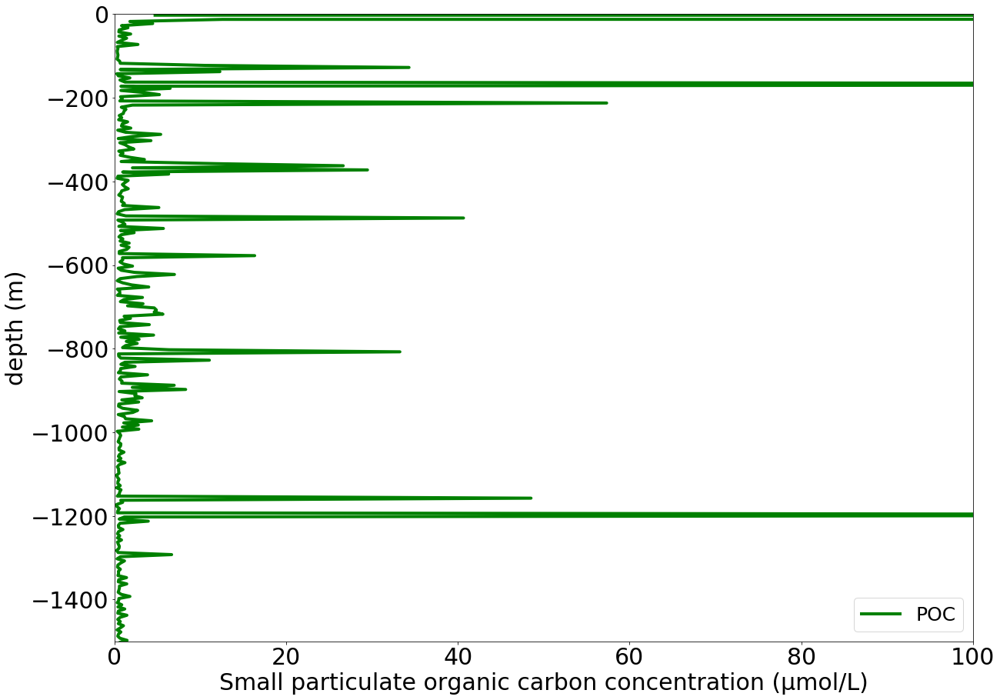

In [559]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Small_Merge_extr_group['POC_umol'].values,-Small_Merge_extr_group.depth.values,'g', linewidth = 4,label = 'POC')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Small particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,100.])
plt.ylim([-1500.,0.])
plt.savefig('/Figures_Article/POC_mean_20092013_UVP5Glob_new.png')



(-1500.0, 0.0)

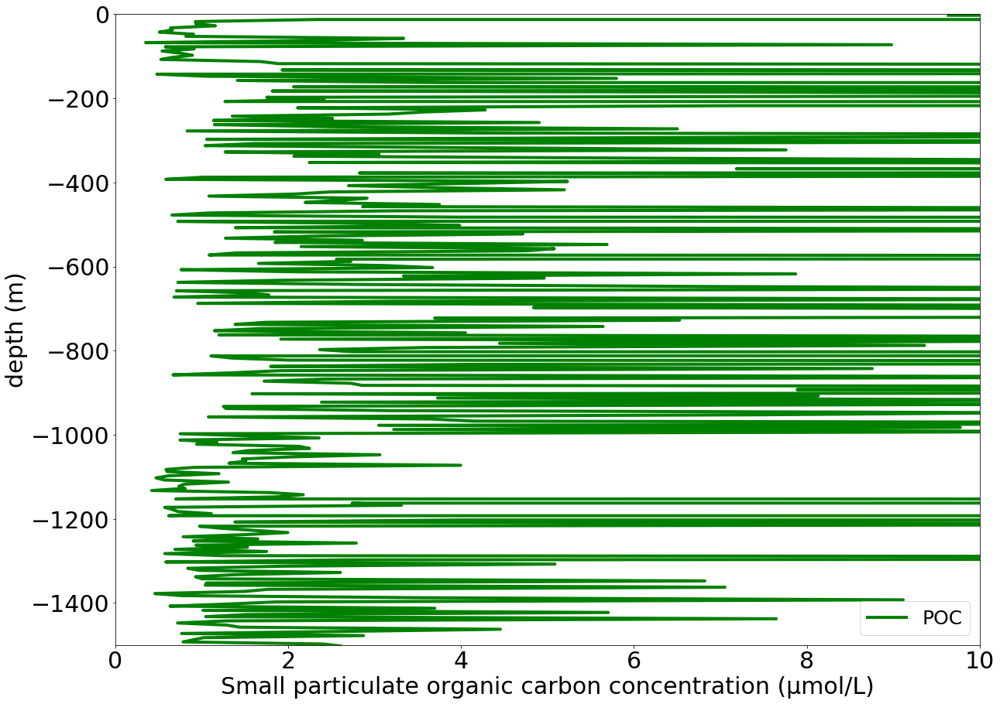

In [546]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Small_Merge_extr_20092013_group['POC_umol'].values,-Small_Merge_extr_20092013_group.depth.values,'g', linewidth = 4,label = 'POC')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Small particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,10.])
plt.ylim([-1500.,0.])

(-1500.0, 0.0)

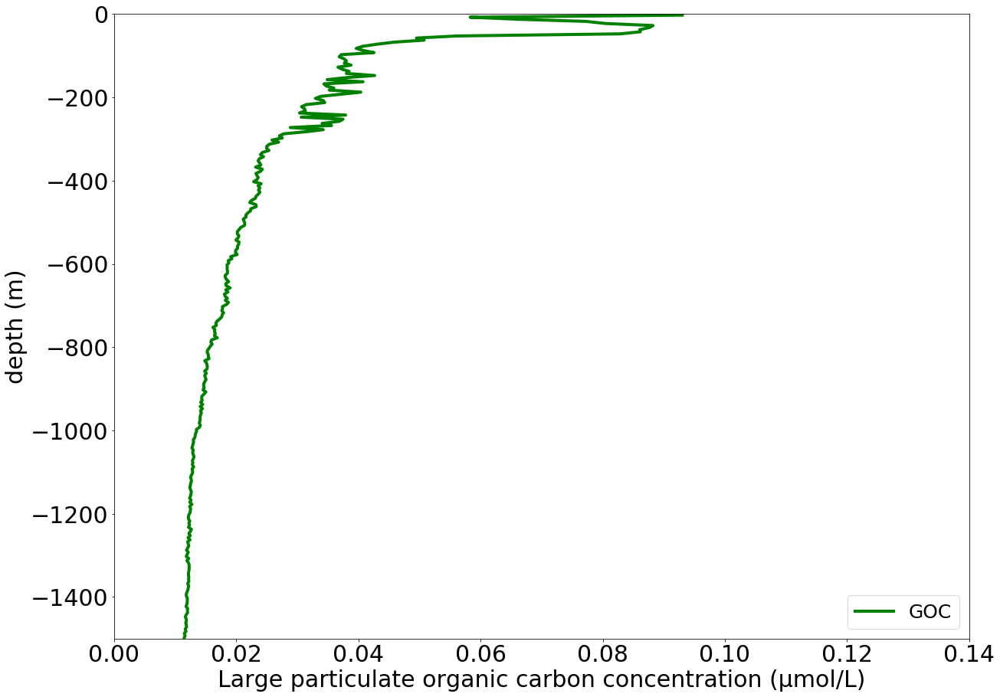

In [547]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Small_Merge_extr_group['GOC_umol'].values,-Small_Merge_extr_group.depth.values,'g', linewidth = 4,label = 'GOC')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Large particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,0.14])
plt.ylim([-1500.,0.])


(-1500.0, 0.0)

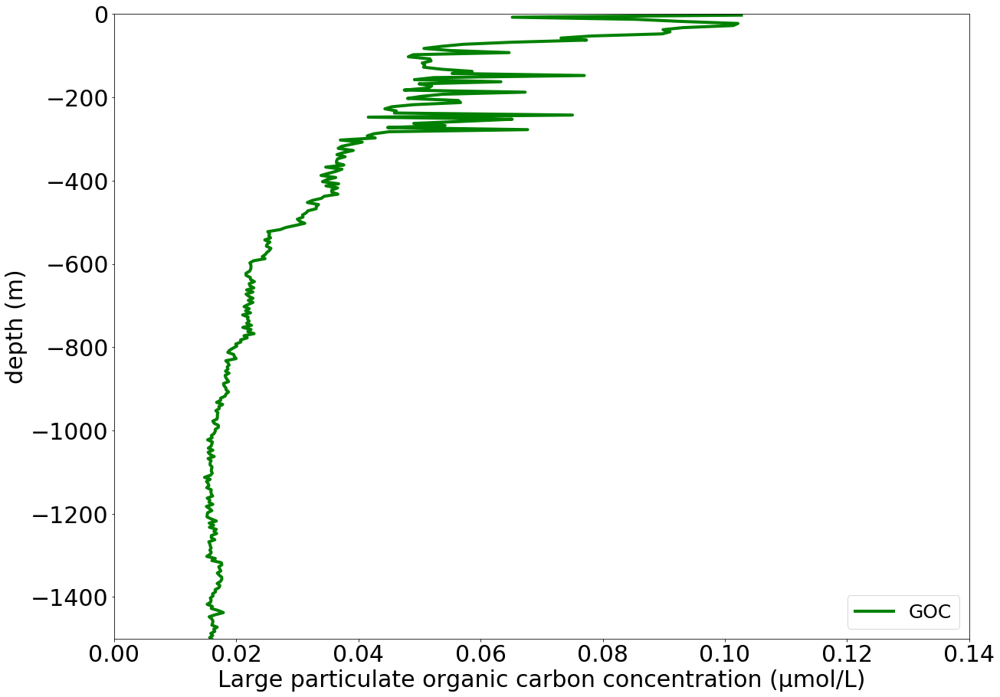

In [548]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Small_Merge_extr_20092013_group['GOC_umol'].values,-Small_Merge_extr_20092013_group.depth.values,'g', linewidth = 4,label = 'GOC')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Large particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,0.14])
plt.ylim([-1500.,0.])

In [319]:
#read data
r_filenameTSV0 = 'Target_Only_Biovol.csv'
All_Data_tot_OBS = pd.read_csv(r_filenameTSV0)

r_filenameTSV = 'Ecopart_data_2008_to_2010_subm_20201113.tsv'
data_20082010 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV = 'Ecopart_data_2011_to_2013 _subm_20210120.tsv'
data_20112013 = pd.read_csv(r_filenameTSV,sep='\t' )

r_filenameTSV3 = 'Data_RKiko_Back_PlankTOMDaily_bottom_21102021.csv'
Data_RKiko_Pl_All = pd.read_csv(r_filenameTSV3)

r_filenameTSV1 = 'Data_ML_PlankTOM_RKiko_PFT_CHLback_bottom_13122021.csv'
Data_RKiko_Pl_All_month = pd.read_csv(r_filenameTSV1)


In [320]:
All_Data_concat = pd.concat([data_20082010, data_20112013],ignore_index=True, sort=False).sort_values(['Date_Time', 'Latitude','Longitude','Pressure [dbar]']).reset_index()


In [321]:
All_Data_concat[['date','time']] = All_Data_concat.Date_Time.str.split("T",expand=True,)

All_Data_concat[['year','month','day']] = All_Data_concat.date.str.split("-",expand=True,)

All_Data_concat['year'] = All_Data_concat['year'].astype(int)
All_Data_concat['month'] = All_Data_concat['month'].astype(int)
All_Data_concat['day'] = All_Data_concat['day'].astype(int)

In [322]:
#rename columns
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.032-0.0403 mm)": "biovol16"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0403-0.0508 mm)": "biovol17"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0508-0.064 mm)": "biovol18"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.064-0.0806 mm)": "biovol19"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.0806-0.102 mm)": "biovol20"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.102-0.128 mm)": "biovol21"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.128-0.161 mm)": "biovol22"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.161-0.203 mm)": "biovol23"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.203-0.256 mm)": "biovol24"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.256-0.323 mm)": "biovol25"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.323-0.406 mm)": "biovol26"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.406-0.512 mm)": "biovol27"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.512-0.645 mm)": "biovol28"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.645-0.813 mm)": "biovol29"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 0.813-1.02 mm)": "biovol30"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.02-1.29 mm)": "biovol31"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.29-1.63 mm)": "biovol32"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 1.63-2.05 mm)": "biovol33"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 2.05-2.58 mm)": "biovol34"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 2.58-3.25 mm)": "biovol35"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 3.25-4.1 mm)": "biovol36"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 4.1-5.16 mm)": "biovol37"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 5.16-6.5 mm)": "biovol38"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 6.5-8.19 mm)": "biovol39"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 8.19-10.3 mm)": "biovol40"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 10.3-13 mm)": "biovol41"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 13-16.4 mm)": "biovol42"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 16.4-20.6 mm)": "biovol43"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: 20.6-26 mm)": "biovol44"}, inplace=True)
All_Data_concat.rename(columns={"Biovolume [mm3 l-1] (ESD: >26 mm)": "biovol45"}, inplace=True)
All_Data_concat.rename(columns={"Latitude": "lat"}, inplace=True)
All_Data_concat.rename(columns={"Longitude": "lon"}, inplace=True)
All_Data_concat.rename(columns={"Vol [L] (sampled for this depth bin)": "watervolume"}, inplace=True)
All_Data_concat.rename(columns={"Pressure [dbar]": "depth"}, inplace=True)


In [323]:
#remove values under 1600m of depth
All_Data_Obs_RK = All_Data_concat.loc[All_Data_concat['depth'] < 1600.]
All_Data_Pl_All_RK = Data_RKiko_Pl_All.loc[Data_RKiko_Pl_All['depth'] < 1600.]
All_Data_Pl_All_RK_month = Data_RKiko_Pl_All_month.loc[Data_RKiko_Pl_All_month['depth'] < 1600.]

In [324]:
names = ['POC','GOC','CHL','BAC','MES','PTE','DIA','COC','PIC','PHA','GEL','PRO','MAC','MIX','FIX']

In [326]:
#rescales varibales mentioned in array 'names'
convert(All_Data_Pl_All_RK,names)
convert(All_Data_Pl_All_RK_month,names)

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,Unnamed: 0,year,month,lat_Pl,lon_Pl,depth,Temp,Temp_back,MLD,POC,...,GEL_back,PRO,PRO_back,MAC,MAC_back,MIX,MIX_back,FIX,FIX_back,bottom
0,0,2009,1,-50.059177,-26.000006,4.999938,6.696263,5.270082,51.425594,0.013993,...,2.427618e-11,0.000112,1.151048e-10,5.188479,0.000004,0.000679,6.845104e-10,0.066851,6.440593e-08,3752.442139
1,1,2009,1,-50.059177,-26.000006,15.000288,6.695637,5.269668,51.425594,0.014078,...,2.427545e-11,0.000112,1.151064e-10,5.188198,0.000004,0.000677,6.835441e-10,0.066773,6.436614e-08,3752.442139
2,2,2009,1,-50.059177,-26.000006,25.001759,6.649694,5.243597,51.425594,0.013876,...,2.426249e-11,0.000112,1.151010e-10,5.183476,0.000004,0.000643,6.665815e-10,0.065207,6.364397e-08,3752.442139
3,3,2009,1,-50.059177,-26.000006,35.005413,6.602064,5.220045,51.425594,0.013219,...,2.424775e-11,0.000111,1.151632e-10,5.176399,0.000004,0.000597,6.418436e-10,0.063110,6.274703e-08,3752.442139
4,4,2009,1,-50.059177,-26.000006,45.013317,6.540305,5.197886,51.425594,0.012565,...,2.423053e-11,0.000111,1.154097e-10,5.163389,0.000004,0.000542,6.140276e-10,0.059850,6.168214e-08,3752.442139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72155,72155,2013,10,77.635132,-85.588829,364.303040,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251
72156,72156,2013,10,77.635132,-85.588829,511.534760,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251
72157,72157,2013,10,77.635132,-85.588829,732.200867,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251
72158,72158,2013,10,77.635132,-85.588829,1033.217285,0.000000,0.000000,22.497229,0.000000,...,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,142.195251


In [327]:
#remove large values of GOC
Large_Data_All_RK = All_Data_Pl_All_RK.loc[All_Data_Pl_All_RK['GOC'] > 2.]
All_Data_Pl_All_RK = All_Data_Pl_All_RK.drop(Large_Data_All_RK.index.to_numpy()).reset_index()

Large_Data_All_RK_month = All_Data_Pl_All_RK_month.loc[All_Data_Pl_All_RK_month['GOC'] > 2.]
All_Data_Pl_All_RK_month = All_Data_Pl_All_RK_month.drop(Large_Data_All_RK_month.index.to_numpy()).reset_index()

In [328]:
#remove the data under the PlankTOM12 bathymetry
All_Data_Pl_All_RK_new = All_Data_Pl_All_RK.loc[All_Data_Pl_All_RK['depth'] < All_Data_Pl_All_RK['bottom']]

All_Data_Pl_All_RK_new_month = All_Data_Pl_All_RK_month.loc[All_Data_Pl_All_RK_month['depth'] < All_Data_Pl_All_RK_month['bottom']]

In [329]:
#remove dublicates
All_Data_Pl_All_RK_new_month = All_Data_Pl_All_RK_new_month.drop(columns=['index','Unnamed: 0']).drop_duplicates()

In [330]:
#remove dublicates
All_Data_Pl_All_RK_new = All_Data_Pl_All_RK_new.drop(columns=['index','Unnamed: 0']).drop_duplicates()

In [331]:
All_Data_Obs_RK['lon'] = All_Data_Obs_RK['lon'].apply(lambda x: round(x, 3))
All_Data_Obs_RK['lat'] = All_Data_Obs_RK['lat'].apply(lambda x: round(x, 3))
All_Data_Obs_RK['depth'] = All_Data_Obs_RK['depth'].apply(lambda x: round(x, 1))
All_Data_Obs_RK['coordinates'] = list(zip(All_Data_Obs_RK.lat, All_Data_Obs_RK.lon))

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_inde

In [332]:
All_Data_Pl_All_RK_new['lon'] = All_Data_Pl_All_RK_new['lon'].apply(lambda x: round(x, 3))
All_Data_Pl_All_RK_new['lat'] = All_Data_Pl_All_RK_new['lat'].apply(lambda x: round(x, 3))
All_Data_Pl_All_RK_new['depth'] = All_Data_Pl_All_RK_new['depth'].apply(lambda x: round(x, 1))
All_Data_Pl_All_RK_new['coordinates'] = list(zip(All_Data_Pl_All_RK_new.lat, All_Data_Pl_All_RK_new.lon))

In [333]:
#concatenate observations with PlankTOM12 data colocated at the same positions as observations
All_Data_RK_concat = pd.concat([All_Data_Obs_RK,All_Data_Pl_All_RK_new], ignore_index=True, sort=False).sort_values(['coordinates', 'depth']).reset_index()

In [334]:
All_Data_RK_concat = All_Data_RK_concat.drop(columns=['level_0'])

In [335]:
#interpolate PlankTOM12 values grouped by coordinates to observation's depth
Interp_Pl_RK = All_Data_RK_concat.groupby(['coordinates']).apply(lambda x: x.interpolate(method='linear')).reset_index()


In [336]:
Interp_Pl_RK_new = Interp_Pl_RK.loc[Interp_Pl_RK['Cruise'].isnull() == False]
Interp_Pl_RK_final = Interp_Pl_RK_new.loc[Interp_Pl_RK['POC'].isnull() == False]

In [ ]:
#estimation of POC and GOC from observations

In [337]:
All_Data_tot_OBS_RK_extr = All_Data_Obs_RK[['depth','lat', 'lon','year', 'month', 'day','watervolume','biovol16', 'biovol17',\
                                          'biovol18', 'biovol19', 'biovol20', 'biovol21', 'biovol22', 'biovol23',\
                                          'biovol24', 'biovol25', 'biovol26', 'biovol27', 'biovol28', 'biovol29',\
                                          'biovol30', 'biovol31', 'biovol32', 'biovol33', 'biovol34', 'biovol35',\
                                          'biovol36', 'biovol37', 'biovol38', 'biovol39', 'biovol40', 'biovol41',\
                                          'biovol42', 'biovol43', 'biovol44', 'biovol45']]

In [338]:
biovol_to_biomass(All_Data_tot_OBS_RK_extr)
biovol_to_biomass(Interp_Pl_RK_final)


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,level_0,index,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,...,biovol36_wvL,biovol37_wvL,biovol38_wvL,biovol39_wvL,biovol40_wvL,biovol41_wvL,biovol42_wvL,biovol43_wvL,biovol44_wvL,biovol45_wvL
2,2,480928.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
3,3,480929.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,7.530552,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
5,5,480930.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
6,6,480931.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,8.089910,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
8,8,480932.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444633,444633,236292.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
444634,444634,236293.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
444635,444635,236294.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0
444636,444636,236295.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0


In [339]:
sum_columns(All_Data_tot_OBS_RK_extr)
sum_columns(Interp_Pl_RK_final)


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


,level_0,index,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,...,POC_wvL_all,GOC_wvL_all,POC_wvL_low2,GOC_wvL_low2,POC_wvL_high2,GOC_wvL_high2,POC_wvL_low2_all,GOC_wvL_low2_all,POC_wvL_high2_all,GOC_wvL_high2_all
2,2,480928.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.623009,4.156034,0.0,4.779043,1.509195,3.269848,0.0,4.779043,1.509195,3.269848
3,3,480929.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.562909,14.891277,0.0,15.454186,1.669289,13.784897,0.0,15.454186,1.669289,13.784897
5,5,480930.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.580673,11.167415,0.0,11.748088,1.604647,10.143441,0.0,11.748088,1.604647,10.143441
6,6,480931.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.544615,27.610675,0.0,28.155290,1.771312,26.383978,0.0,28.155290,1.771312,26.383978
8,8,480932.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.740023,11.450084,0.0,12.190107,2.259285,9.930822,0.0,12.190107,2.259285,9.930822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444633,444633,236292.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,12.182351,83.872431,0.0,96.054782,26.213798,69.840983,0.0,96.054782,26.213798,69.840983
444634,444634,236293.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,15.281706,105.256163,0.0,120.537868,31.664197,88.873671,0.0,120.537868,31.664197,88.873671
444635,444635,236294.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,13.868474,92.524742,0.0,106.393216,26.840489,79.552727,0.0,106.393216,26.840489,79.552727
444636,444636,236295.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,12.159705,71.855276,0.0,84.014980,22.300187,61.714793,0.0,84.014980,22.300187,61.714793


In [340]:
biomass_umolL(All_Data_tot_OBS_RK_extr)
biomass_umolL(Interp_Pl_RK_final)

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


,level_0,index,Cruise,Project_id,Profile,RAWfilename,CTD_filename,lat,lon,Date_Time,...,POC_Mmol_wvL_all,GOC_Mmol_wvL_all,POC_Mmol_wvL_low2,GOC_Mmol_wvL_low2,POC_Mmol_wvL_high2,GOC_Mmol_wvL_high2,POC_Mmol_wvL_low2_all,GOC_Mmol_wvL_low2_all,POC_Mmol_wvL_high2_all,GOC_Mmol_wvL_high2_all
2,2,480928.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001737,0.011584,0.0,0.013321,0.004207,0.009114,0.0,0.013321,0.004207,0.009114
3,3,480929.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001896,0.050155,0.0,0.052051,0.005622,0.046429,0.0,0.052051,0.005622,0.046429
5,5,480930.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001467,0.028210,0.0,0.029676,0.004053,0.025623,0.0,0.029676,0.004053,0.025623
6,6,480931.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001572,0.079710,0.0,0.081282,0.005114,0.076169,0.0,0.081282,0.005114,0.076169
8,8,480932.0,tara2011,99.0,tara_086_00_a,HDR20110109105610,tara_sbe_9c_110109_01,-64.359,-53.006,2011-01-09T10:56:10,...,0.001994,0.030852,0.0,0.032846,0.006088,0.026758,0.0,0.032846,0.006088,0.026758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444633,444633,236292.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.204907,1.410736,0.0,1.615643,0.440917,1.174727,0.0,1.615643,0.440917,1.174727
444634,444634,236293.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.183599,1.264579,0.0,1.448178,0.380423,1.067755,0.0,1.448178,0.380423,1.067755
444635,444635,236294.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.233268,1.556268,0.0,1.789536,0.451458,1.338078,0.0,1.789536,0.451458,1.338078
444636,444636,236295.0,an1304,56.0,an1304_l1_081,HDR20130822071406,1304081,81.284,-62.322,2013-08-22T07:14:06,...,0.255658,1.510759,0.0,1.766417,0.468862,1.297555,0.0,1.766417,0.468862,1.297555


In [561]:
Small_Merge_extr_20092013.columns

Index(['lat', 'lon', 'Date_Time', 'depth', 'watervolume', 'biovolume_0_wvL',
       'biovolume_1_wvL', 'biovolume_2_wvL', 'biovolume_3_wvL',
       'biovolume_4_wvL', 'biovolume_5_wvL', 'biovolume_6_wvL',
       'biovolume_7_wvL', 'biovolume_8_wvL', 'biovolume_9_wvL',
       'biovolume_10_wvL', 'biovolume_11_wvL', 'biovolume_12_wvL',
       'biovolume_13_wvL', 'biovolume_14_wvL', 'biovolume_15_wvL',
       'biovolume_16_wvL', 'biovolume_17_wvL', 'biovolume_18_wvL',
       'biovolume_19_wvL', 'biovolume_20_wvL', 'biovolume_21_wvL',
       'biovolume_22_wvL', 'biovolume_23_wvL', 'biovolume_24_wvL',
       'biovolume_25_wvL', 'biovolume_26_wvL', 'biovolume_27_wvL',
       'biovolume_28_wvL', 'biovolume_29_wvL', 'biovolume_30_wvL',
       'biovolume_31_wvL', 'biovolume_32_wvL', 'biovolume_33_wvL',
       'biovolume_34_wvL', 'biovolume_35_wvL', 'biovolume_36_wvL',
       'biovolume_37_wvL', 'biovolume_38_wvL', 'biovolume_39_wvL',
       'biovolume_40_wvL', 'biovolume_41_wvL', 'biovolume_42_

In [564]:
for numb in np.arange(0,45,1):
    Small_Merge_extr_20092013['biovolume_'+str(numb)+'_umol'] = (Small_Merge_extr_20092013['biovolume_'+str(numb)+'_wvL']/ Small_Merge_extr['watervolume']) / 12.0107

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [341]:
Interp_Pl_RK_final = Interp_Pl_RK_final.drop(columns=['level_0'])

In [342]:
Large_Data_Interp = Interp_Pl_RK_final.loc[Interp_Pl_RK_final['GOC_Mmol_wvL'] > 2.]
Interp_Pl_RK_final_NoLarge = Interp_Pl_RK_final.drop(Large_Data_Interp.index.to_numpy()).reset_index()

In [567]:
Small_Merge_extr_20092013.columns[50:]

Index(['POC', 'GOC', 'POC_umol', 'GOC_umol', 'date', 'time', 'year', 'month',
       'day', 'biovolume_0_umol', 'biovolume_1_umol', 'biovolume_2_umol',
       'biovolume_3_umol', 'biovolume_4_umol', 'biovolume_5_umol',
       'biovolume_6_umol', 'biovolume_7_umol', 'biovolume_8_umol',
       'biovolume_9_umol', 'biovolume_10_umol', 'biovolume_11_umol',
       'biovolume_12_umol', 'biovolume_13_umol', 'biovolume_14_umol',
       'biovolume_15_umol', 'biovolume_16_umol', 'biovolume_17_umol',
       'biovolume_18_umol', 'biovolume_19_umol', 'biovolume_20_umol',
       'biovolume_21_umol', 'biovolume_22_umol', 'biovolume_23_umol',
       'biovolume_24_umol', 'biovolume_25_umol', 'biovolume_26_umol',
       'biovolume_27_umol', 'biovolume_28_umol', 'biovolume_29_umol',
       'biovolume_30_umol', 'biovolume_31_umol', 'biovolume_32_umol',
       'biovolume_33_umol', 'biovolume_34_umol', 'biovolume_35_umol',
       'biovolume_36_umol', 'biovolume_37_umol', 'biovolume_38_umol',
       'biovolu

In [343]:
#estimation of percentiles of POC and GOC from UVP5 and PlankTOM12

In [344]:
Percantiles_Interp = Interp_Pl_RK_final.groupby(['depth'])['POC', 'GOC', 'POC_Mmol_wvL', 'GOC_Mmol_wvL','POC_Mmol_wvL_all', 'GOC_Mmol_wvL_all'].quantile([0.25, 0.50, 0.75, 0.95]).unstack().reset_index()

In [552]:
Percantiles_Small_20092013 = Small_Merge_extr_20092013.groupby(['depth'])['POC_umol','GOC_umol'].quantile([0.25, 0.50, 0.75, 0.95]).unstack().reset_index()

In [572]:
Percantiles_All_20092013 = Small_Merge_extr_20092013.groupby(['depth'])['biovolume_0_umol', 'biovolume_1_umol', 'biovolume_2_umol', 'biovolume_3_umol',\
                                                                        'biovolume_4_umol', 'biovolume_5_umol',\
                                                                        'biovolume_6_umol', 'biovolume_7_umol',\
                                                                        'biovolume_8_umol', 'biovolume_9_umol',\
                                                                        'biovolume_10_umol', 'biovolume_11_umol',\
                                                                        'biovolume_12_umol', 'biovolume_13_umol',\
                                                                        'biovolume_14_umol', 'biovolume_15_umol',\
                                                                        'biovolume_16_umol', 'biovolume_17_umol',\
                                                                        'biovolume_18_umol', 'biovolume_19_umol',\
                                                                        'biovolume_20_umol', 'biovolume_21_umol',\
                                                                        'biovolume_22_umol', 'biovolume_23_umol',\
                                                                        'biovolume_24_umol', 'biovolume_25_umol',\
                                                                        'biovolume_26_umol', 'biovolume_27_umol',\
                                                                        'biovolume_28_umol', 'biovolume_29_umol',\
                                                                        'biovolume_30_umol', 'biovolume_31_umol',\
                                                                        'biovolume_32_umol', 'biovolume_33_umol',\
                                                                        'biovolume_34_umol', 'biovolume_35_umol',\
                                                                        'biovolume_36_umol', 'biovolume_37_umol',\
                                                                        'biovolume_38_umol', 'biovolume_39_umol',\
                                                                        'biovolume_40_umol', 'biovolume_41_umol',\
                                                                        'biovolume_42_umol', 'biovolume_43_umol',\
                                                                        'biovolume_44_umol'].quantile([0.25, 0.50, 0.75, 0.95]).unstack().reset_index()

In [587]:
Percantiles_All_20092013['biovolume_20_umol']

,0.25,0.50,0.75,0.95
0,0.0,0.0,0.0,0.000575
1,0.0,0.0,0.0,0.001018
2,0.0,0.0,0.0,0.002833
3,0.0,0.0,0.0,0.003509
4,0.0,0.0,0.0,0.004091
...,...,...,...,...
1198,0.0,0.0,0.0,0.000000
1199,0.0,0.0,0.0,0.000000
1200,0.0,0.0,0.0,0.000000
1201,0.0,0.0,0.0,0.000000


In [562]:
Percantiles_Small_20092013

depth  POC_umol                                 GOC_umol            \
                  0.25       0.5      0.75       0.95      0.25       0.5   
0        2.5  0.019210  0.081669  0.364431  10.444855  0.017484  0.036226   
1        7.5  0.013852  0.049102  0.214109   3.475041  0.013674  0.026140   
2       12.5  0.014925  0.051919  0.191828   1.922645  0.015314  0.029704   
3       17.5  0.016481  0.051495  0.184436   1.688639  0.016663  0.031459   
4       22.5  0.017374  0.050646  0.184332   1.760187  0.018023  0.033921   
...      ...       ...       ...       ...        ...       ...       ...   
1198  5997.5  0.045214  0.045214  0.045214   0.045214  0.008744  0.008744   
1199  6002.5  0.109644  0.109644  0.109644   0.109644  0.007978  0.007978   
1200  6007.5  0.332492  0.332492  0.332492   0.332492  0.006906  0.006906   
1201  6012.5  0.012596  0.012596  0.012596   0.012596  0.008668  0.008668   
1202  6017.5  0.526543  0.526543  0.526543   0.526543  0.005942  0.005942   

                          
          0.75      0.95  
0     0.066869  0.226916  
1     0.051868  0.190068  
2     0.061173  0.230467  
3     0.067364  0.254707  
4     0.071322  0.270472  
...        ...       ...  
1198  0.008744  0.008744  
1199  0.007978  0.007978  
1200  0.006906  0.006906  
1201  0.008668  0.008668  
1202  0.005942  0.005942  

[1203 rows x 9 columns]

In [345]:
Percantiles_Interp

depth       POC                                     GOC            \
                 0.25       0.5      0.75      0.95      0.25       0.5   
0       7.5  0.348842  0.698201  1.259171  3.000571  0.013768  0.026567   
1      12.5  0.301463  0.666987  1.239896  2.992073  0.014366  0.027678   
2      17.5  0.303387  0.652115  1.192316  2.815768  0.016474  0.029927   
3      22.5  0.289114  0.651118  1.206910  2.658418  0.018167  0.031751   
4      27.5  0.253662  0.632038  1.148276  2.533828  0.021561  0.036341   
..      ...       ...       ...       ...       ...       ...       ...   
314  1577.5  0.003388  0.004066  0.007741  0.027889  0.019212  0.024143   
315  1582.5  0.003387  0.004066  0.007732  0.027889  0.019357  0.024173   
316  1587.5  0.003387  0.004066  0.007732  0.027889  0.019357  0.024173   
317  1592.5  0.003387  0.004066  0.007732  0.027889  0.019357  0.024173   
318  1597.5  0.003387  0.004055  0.007718  0.027889  0.019357  0.024174   

                        POC_Mmol_wvL  ... GOC_Mmol_wvL            \
         0.75      0.95         0.25  ...         0.75      0.95   
0    0.048618  0.126830     0.002736  ...     0.050465  0.182071   
1    0.049795  0.125541     0.002849  ...     0.059101  0.219639   
2    0.053800  0.148803     0.002953  ...     0.065322  0.245854   
3    0.059138  0.145346     0.003004  ...     0.068531  0.265058   
4    0.065797  0.167737     0.003054  ...     0.071706  0.251566   
..        ...       ...          ...  ...          ...       ...   
314  0.026854  0.031349     0.002548  ...     0.016147  0.041035   
315  0.026870  0.031349     0.002550  ...     0.016461  0.037862   
316  0.026870  0.031349     0.002559  ...     0.015484  0.042885   
317  0.026870  0.031349     0.002506  ...     0.016254  0.041947   
318  0.026870  0.031349     0.002444  ...     0.016629  0.047100   

    POC_Mmol_wvL_all                               GOC_Mmol_wvL_all            \
                0.25       0.5      0.75      0.95             0.25       0.5   
0           0.002736  0.004602  0.009813  0.031842         0.012905  0.026005   
1           0.002849  0.004960  0.011174  0.039430         0.014434  0.028899   
2           0.002953  0.005047  0.011307  0.039234         0.015645  0.031389   
3           0.003004  0.005203  0.011608  0.040241         0.017151  0.033854   
4           0.003054  0.005155  0.011919  0.041917         0.017570  0.035938   
..               ...       ...       ...       ...              ...       ...   
314         0.002548  0.003520  0.005287  0.010530         0.004849  0.008394   
315         0.002550  0.003511  0.005281  0.010541         0.004617  0.009005   
316         0.002559  0.003488  0.005187  0.010308         0.005037  0.008681   
317         0.002506  0.003618  0.005294  0.010306         0.004867  0.008725   
318         0.002444  0.003532  0.005221  0.010904         0.004796  0.009086   

                         
         0.75      0.95  
0    0.056876  0.231507  
1    0.065042  0.278523  
2    0.071391  0.308068  
3    0.074867  0.319166  
4    0.078787  0.374110  
..        ...       ...  
314  0.016198  0.043323  
315  0.016461  0.040511  
316  0.015681  0.046313  
317  0.016254  0.044250  
318  0.016794  0.050556  

[319 rows x 25 columns]

In [577]:
Percantiles_All_20092013_extr = Percantiles_All_20092013.loc[Percantiles_All_20092013['depth'] < 1600.]

In [579]:
colour = ['b','r','k','g','c']

In [581]:
numb_f = [0,5,10,15,20,25,30,35,40]
numb_e = [5,10,15,20,25,30,35,40,45]

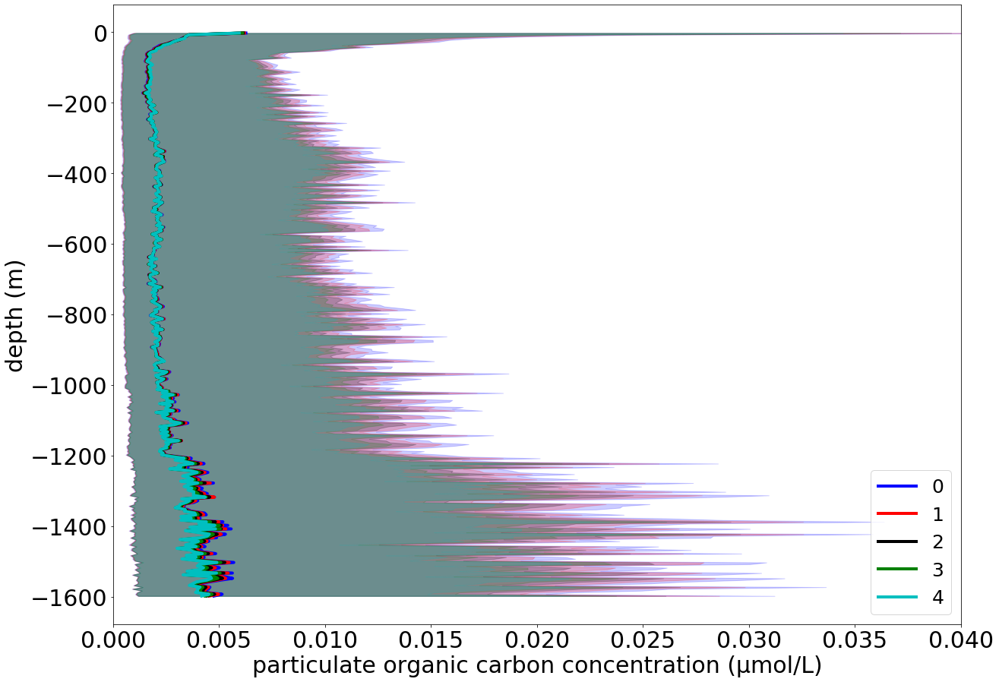

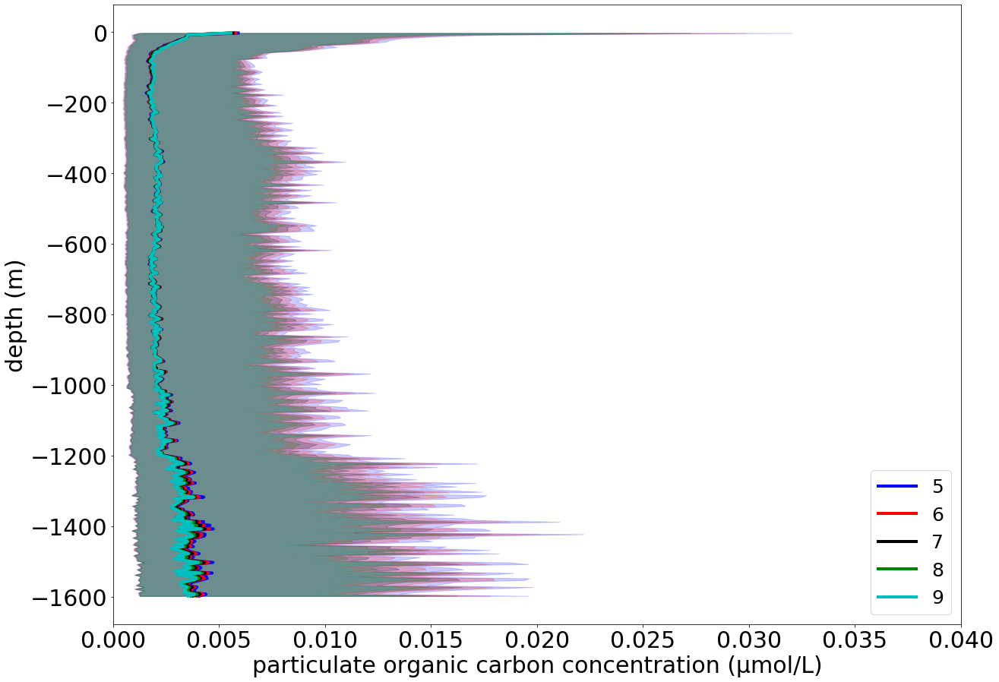

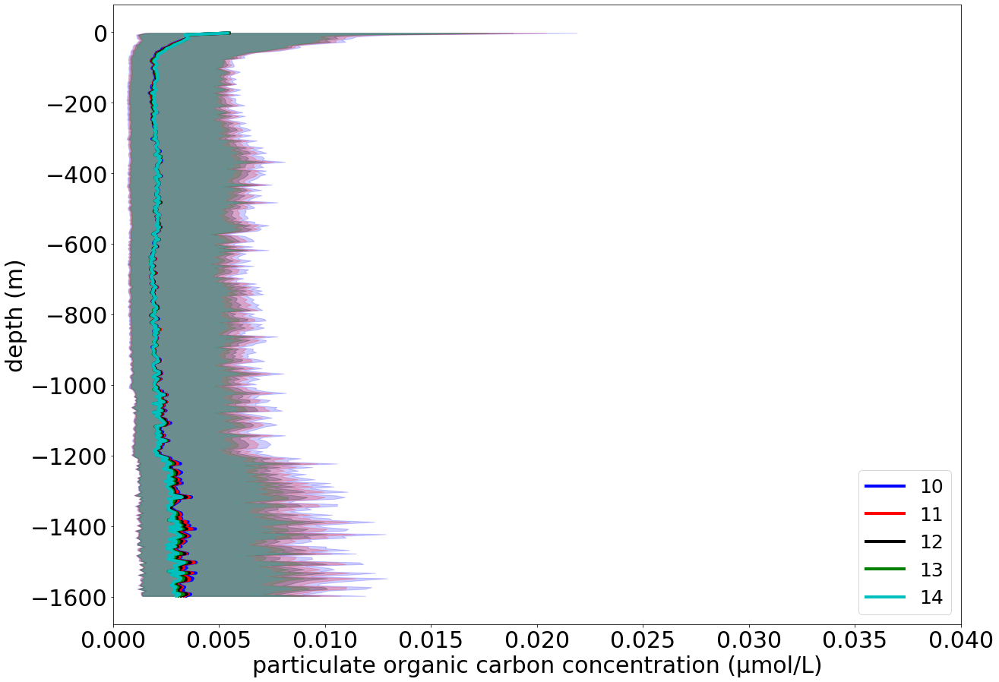

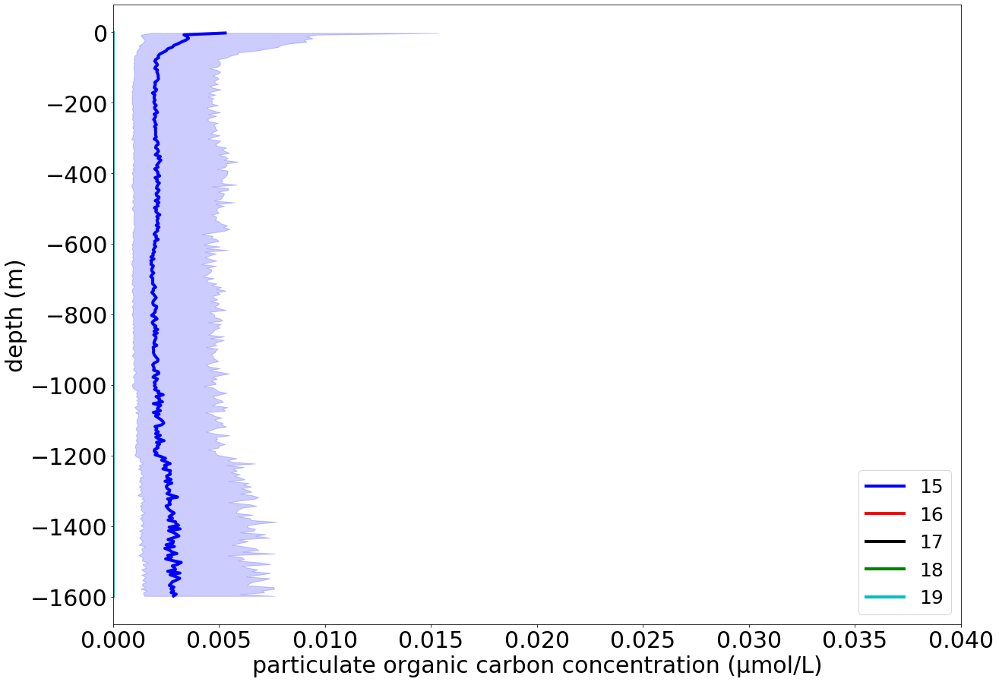

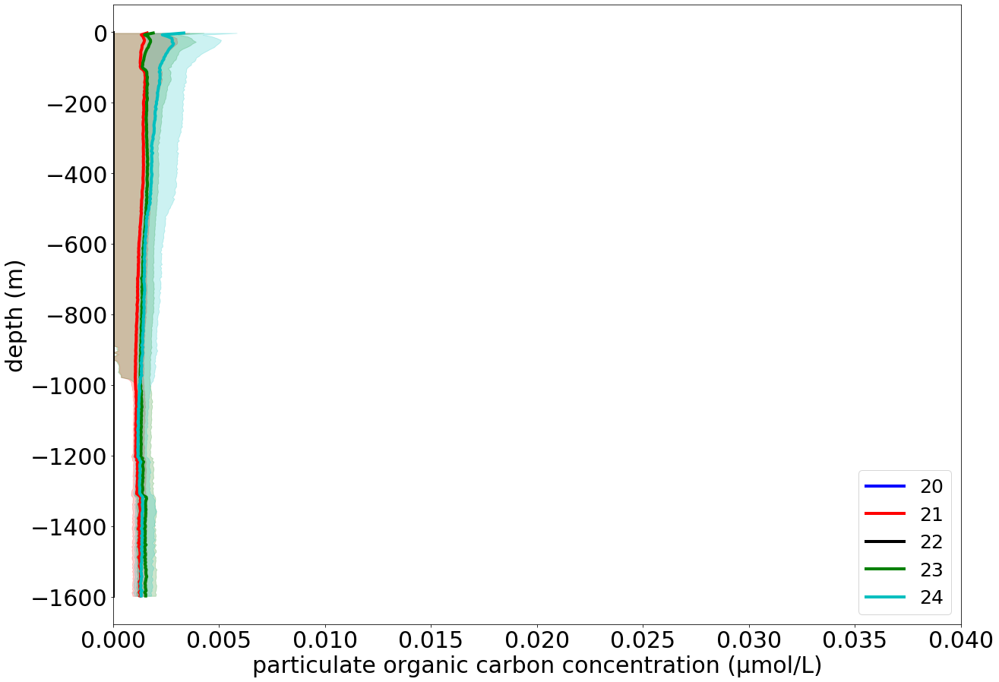

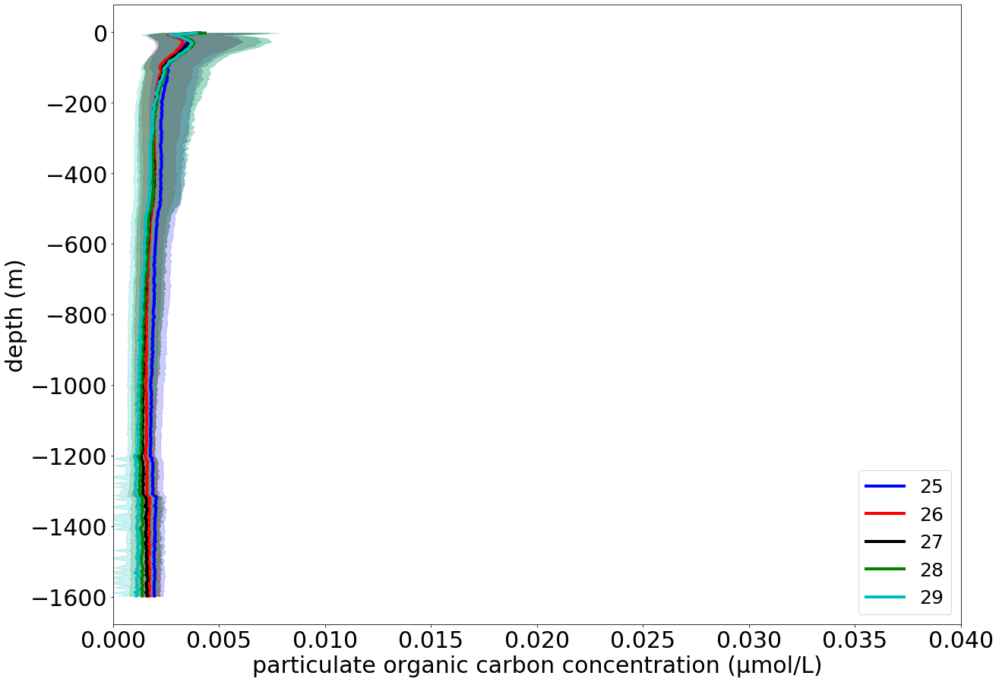

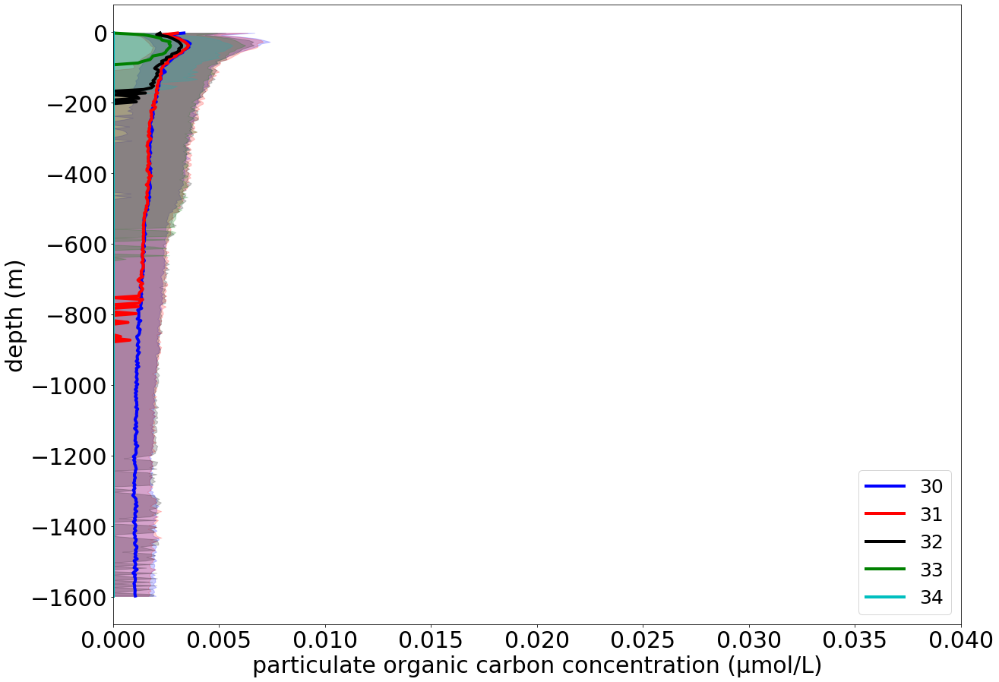

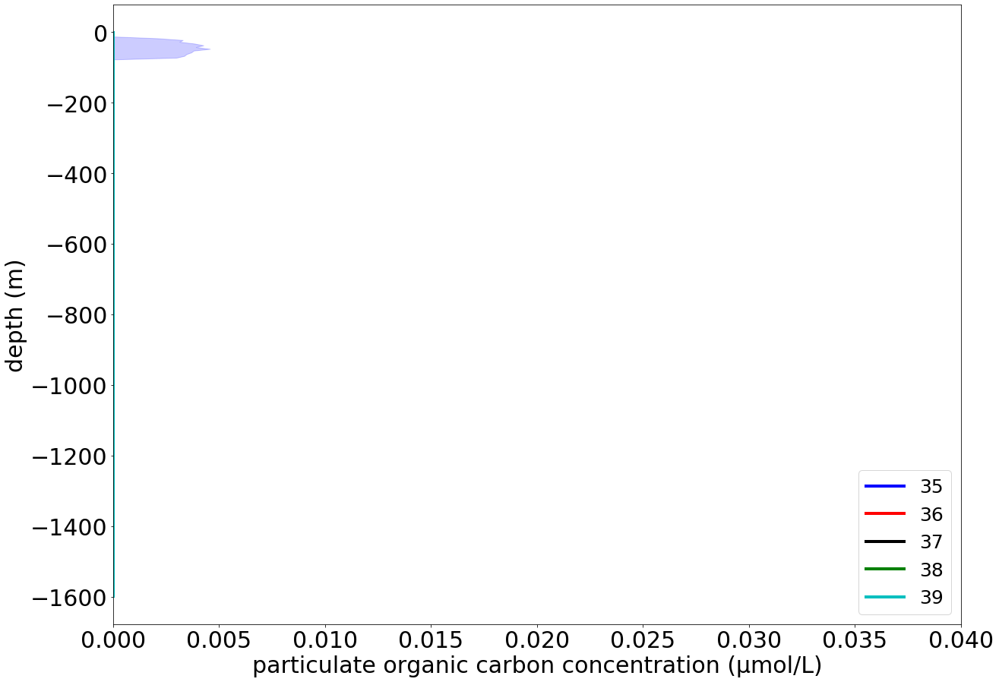

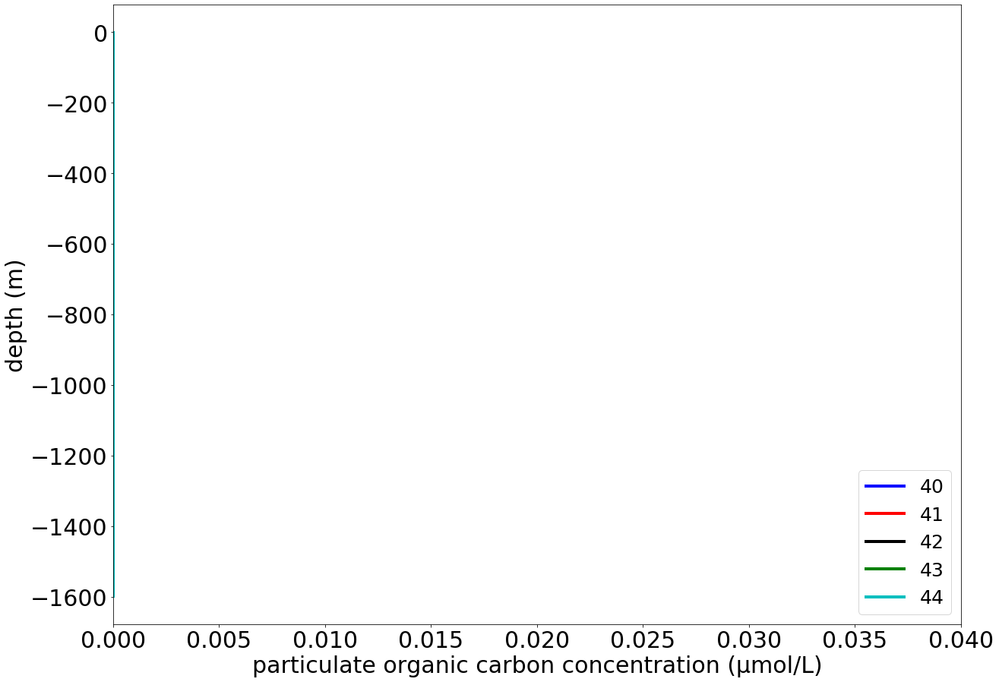

In [586]:
for i in np.arange(0,len(numb_f),1):
    plt.figure(figsize=[20. , 15.],facecolor='w')
    k = 0
    for numb in np.arange(numb_f[i],numb_e[i],1):
        plt.plot(Percantiles_All_20092013_extr['biovolume_'+str(numb)+'_umol', 0.5].values,-Percantiles_All_20092013_extr.depth.values,colour[k], linewidth = 4,label = str(numb))
        plt.fill_betweenx(-Percantiles_All_20092013_extr.depth.values, Percantiles_All_20092013_extr['biovolume_'+str(numb)+'_umol', 0.25].values, Percantiles_All_20092013_extr['biovolume_'+str(numb)+'_umol', 0.75].values, alpha=0.2,color=colour[k])
        k= k + 1


    locsX,labelsx = plt.xticks(size=30)
    plt.xlabel('particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
    plt.ylabel('depth (m)',fontsize=30)
    locsY,labelsy = plt.yticks(size=30)   
    plt.legend(fontsize = 25,loc = 'lower right')
    plt.xlim([0,0.04])
    #plt.savefig('/Figures_Article/POC_percetiles_interpolated_UVP5Glob_new.png')


In [553]:
Percantiles_Small_20092013_extr = Percantiles_Small_20092013.loc[Percantiles_Small_20092013['depth'] < 1600.]

In [357]:
#plot Figure 4 from article

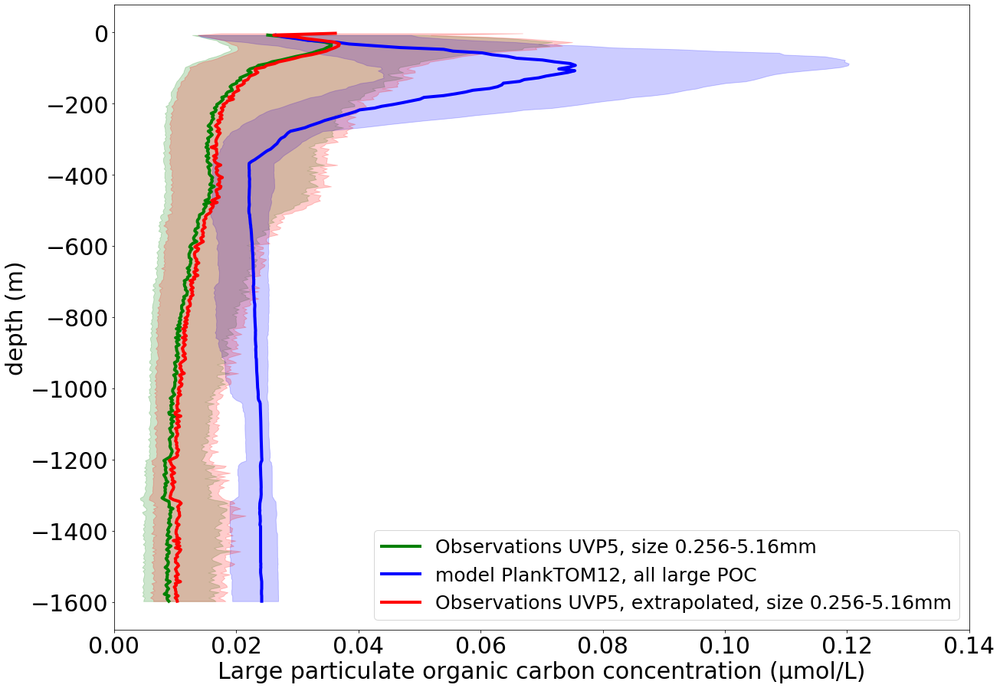

In [589]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Percantiles_Interp['GOC_Mmol_wvL', 0.5].values,-Percantiles_Interp.depth.values,'g', linewidth = 4,label = 'Observations UVP5, size 0.256-5.16mm')
# plt.plot(Percantiles_Interp['GOC_Mmol_wvL_all', 0.5].values,-Percantiles_Interp.depth.values,'g', ls ='-.', linewidth = 4,label = 'Obs 0.5 all, UVP5G')
plt.plot(Percantiles_Interp['GOC', 0.5].values,-Percantiles_Interp.depth.values,'b', linewidth = 4,label = 'model PlankTOM12, all large POC')
plt.plot(Percantiles_Small_20092013_extr['GOC_umol', 0.5].values,-Percantiles_Small_20092013_extr.depth.values,'r', linewidth = 4,label = 'Observations UVP5, extrapolated, size 0.256-5.16mm')

plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['GOC_Mmol_wvL', 0.25].values, Percantiles_Interp['GOC_Mmol_wvL', 0.75].values, alpha=0.2,color='g')
plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['GOC', 0.25].values, Percantiles_Interp['GOC', 0.75].values, alpha=0.2,color='b')
plt.fill_betweenx(-Percantiles_Small_20092013_extr.depth.values, Percantiles_Small_20092013_extr['GOC_umol', 0.25].values, Percantiles_Small_20092013_extr['GOC_umol', 0.75].values, alpha=0.2,color='r')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Large particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,0.14])
plt.savefig('/Figures_Article/GOC_percetiles_interpolated_UVP5Glob_new.png')


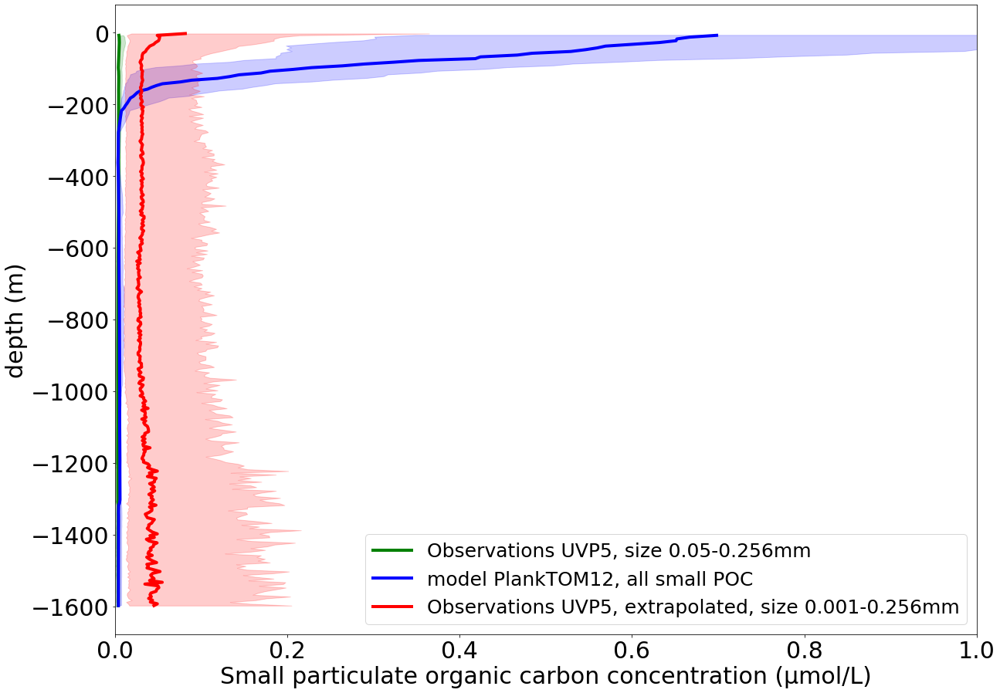

In [590]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(Percantiles_Interp['POC_Mmol_wvL', 0.5].values,-Percantiles_Interp.depth.values,'g', linewidth = 4,label = 'Observations UVP5, size 0.05-0.256mm')
# plt.plot(Percantiles_Interp['GOC_Mmol_wvL_all', 0.5].values,-Percantiles_Interp.depth.values,'g', ls ='-.', linewidth = 4,label = 'Obs 0.5 all, UVP5G')
plt.plot(Percantiles_Interp['POC', 0.5].values,-Percantiles_Interp.depth.values,'b', linewidth = 4,label = 'model PlankTOM12, all small POC')
plt.plot(Percantiles_Small_20092013_extr['POC_umol', 0.5].values,-Percantiles_Small_20092013_extr.depth.values,'r', linewidth = 4,label = 'Observations UVP5, extrapolated, size 0.001-0.256mm')

plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['POC_Mmol_wvL', 0.25].values, Percantiles_Interp['POC_Mmol_wvL', 0.75].values, alpha=0.2,color='g')
plt.fill_betweenx(-Percantiles_Interp.depth.values, Percantiles_Interp['POC', 0.25].values, Percantiles_Interp['POC', 0.75].values, alpha=0.2,color='b')
plt.fill_betweenx(-Percantiles_Small_20092013_extr.depth.values, Percantiles_Small_20092013_extr['POC_umol', 0.25].values, Percantiles_Small_20092013_extr['POC_umol', 0.75].values, alpha=0.2,color='r')

locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Small particulate organic carbon concentration (\u03BCmol/L)',fontsize=30)
plt.ylabel('depth (m)',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 25,loc = 'lower right')
plt.xlim([0,1.])
plt.savefig('/Figures_Article/POC_percetiles_interpolated_UVP5Glob_new.png')


/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


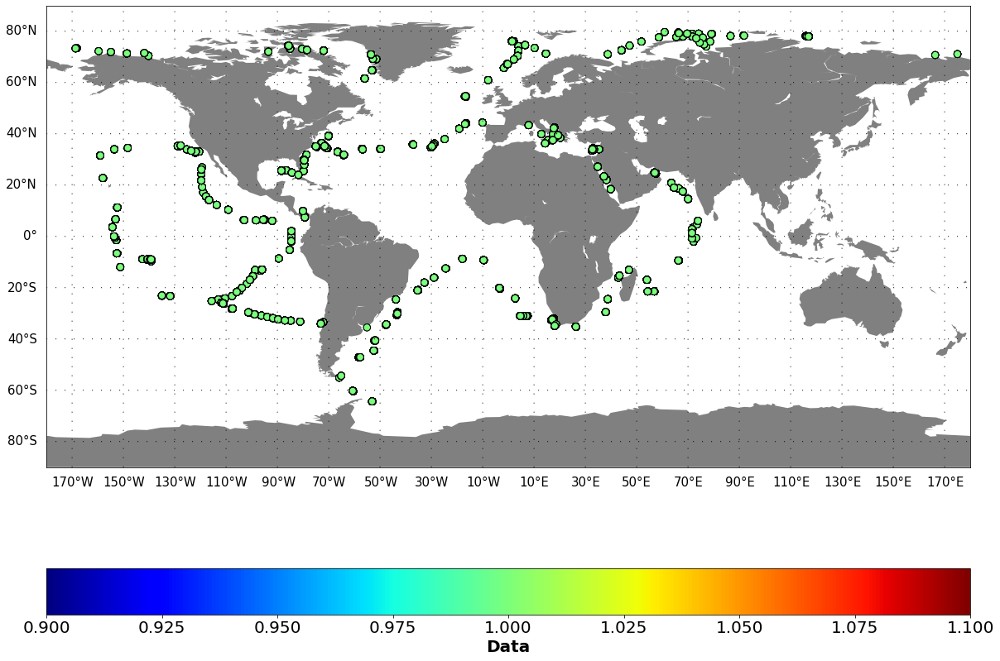

In [344]:
plot_glob_distr(All_Data_tot_OBS_extr,'lat','lon','Obs_Tara_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


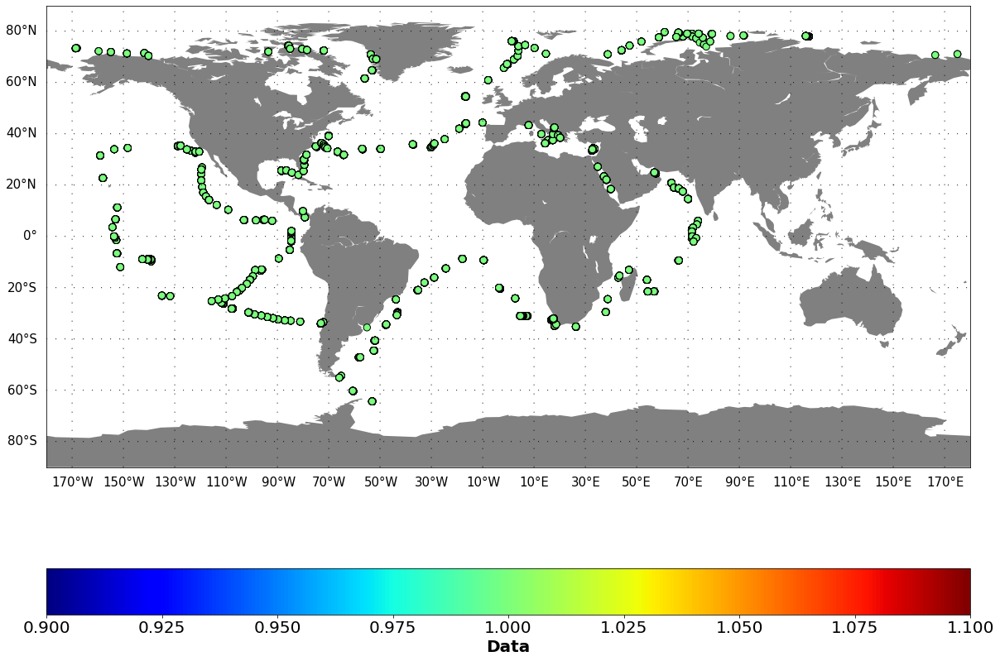

In [345]:
plot_glob_distr(All_Data_Pl_All_new,'lat','lon','PlankTOMDaily_Tara_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


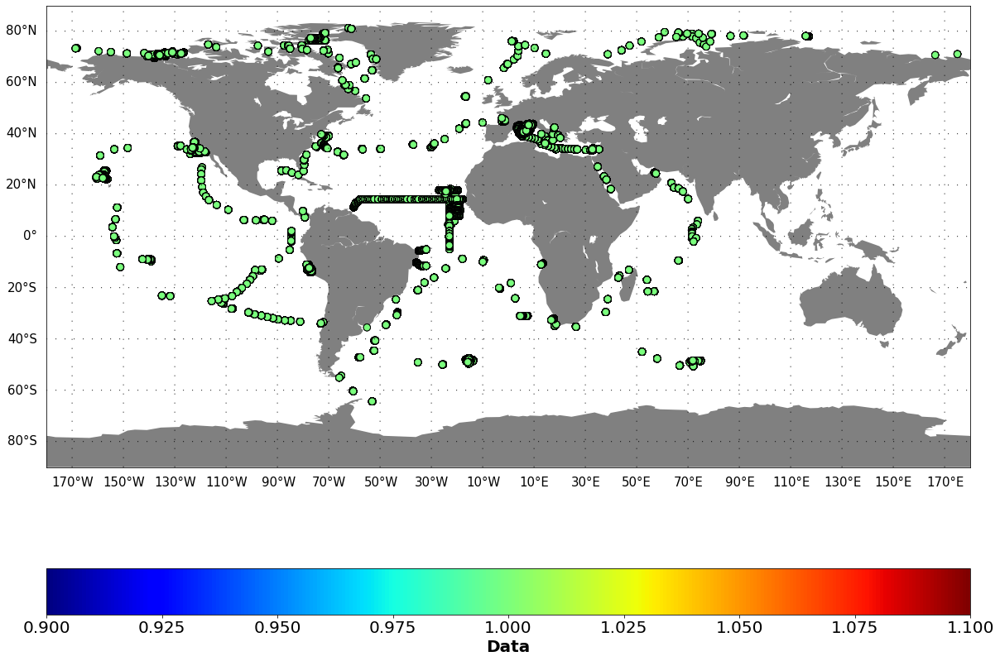

In [346]:
plot_glob_distr(All_Data_tot_OBS_RK_extr,'lat','lon','Obs_RK_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


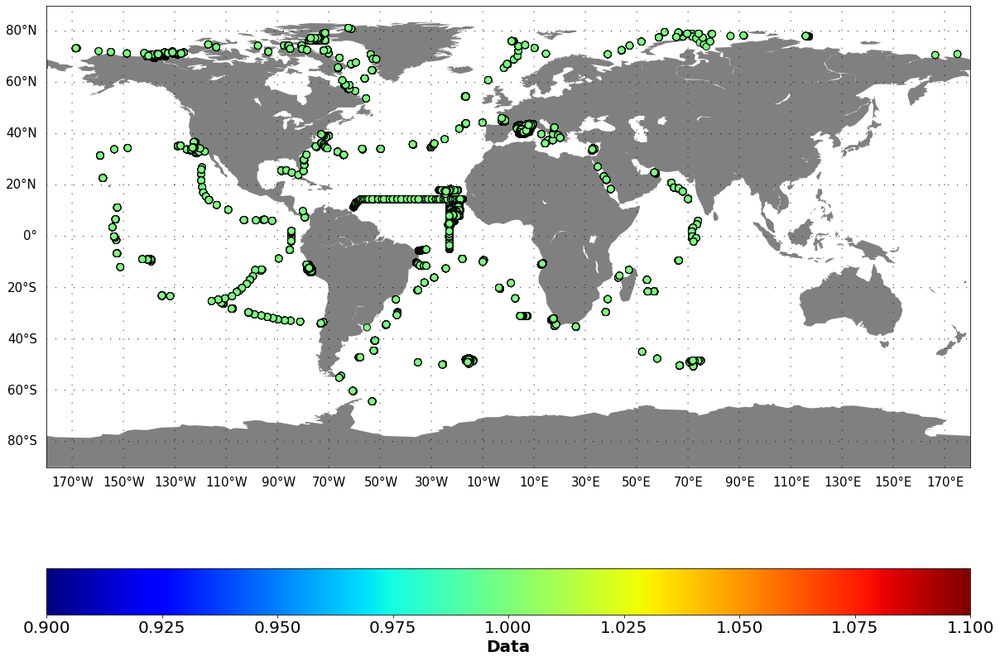

In [347]:
plot_glob_distr(All_Data_Pl_All_RK_new,'lat','lon','PlankTOMDaily_RK_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


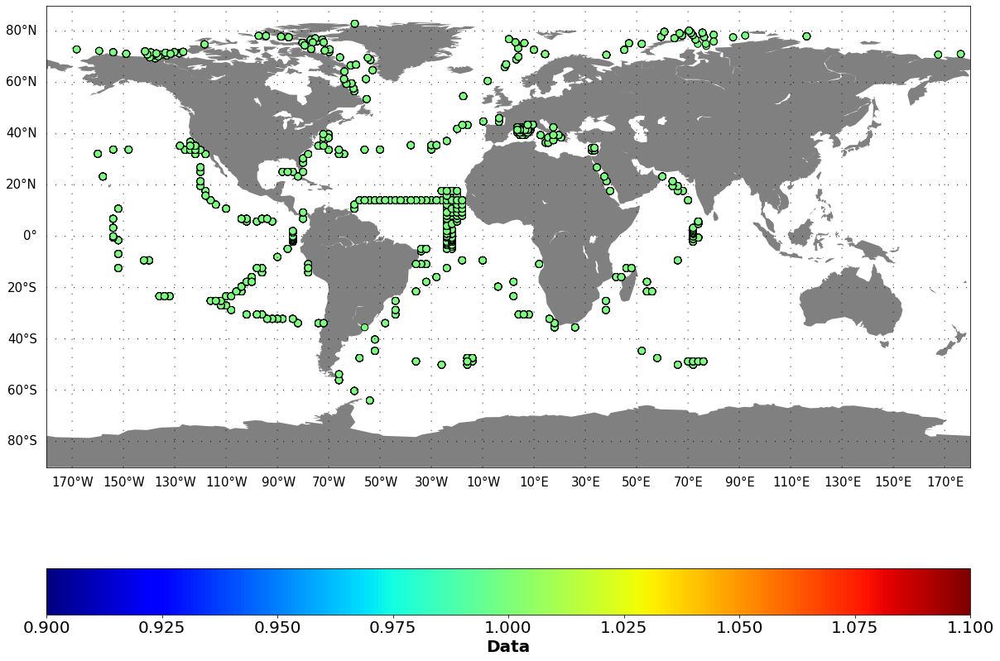

In [350]:
plot_glob_distr(All_Data_Pl_All_RK_new_month,'lat_Pl','lon_Pl','PlankTOMMonthly_RK_positions.png')

In [57]:
All_Data_tot_OBS_RK_extr['coordinates'] = list(zip(All_Data_tot_OBS_RK_extr.lat, All_Data_tot_OBS_RK_extr.lon))
All_Data_tot_OBS_extr['coordinates'] = list(zip(All_Data_tot_OBS_extr.lat, All_Data_tot_OBS_extr.lon))

In [ ]:
#plot Figure 1 from article

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


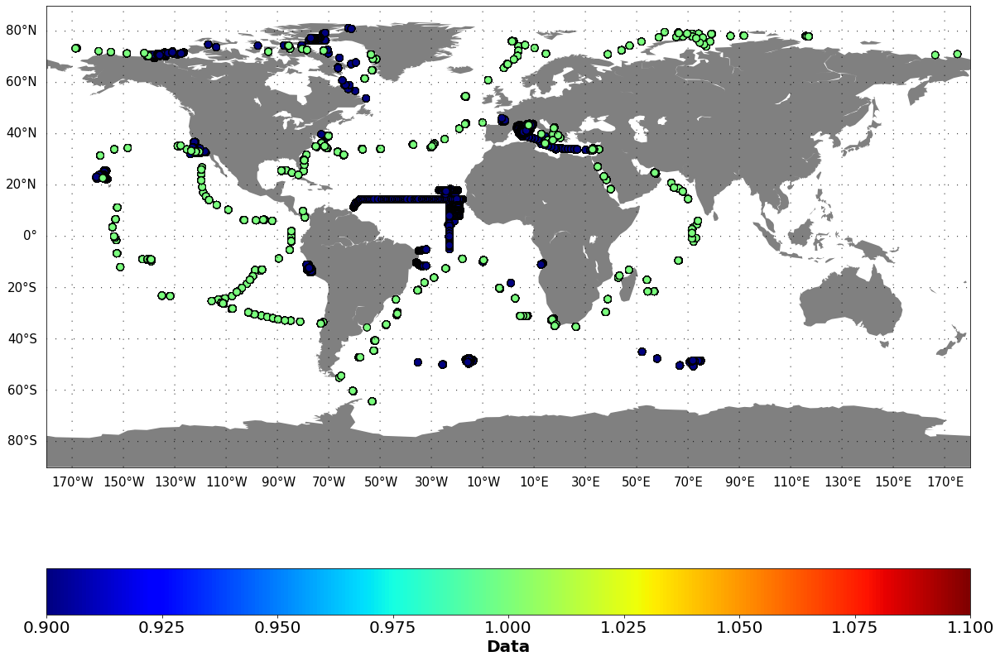

In [351]:
plt.figure(figsize=[20. , 15.],facecolor='w')
#limits=[1.,18.]
m = Basemap(projection='cyl',llcrnrlat=-90,urcrnrlat=90,\
            llcrnrlon=-180,urcrnrlon=180)
m.fillcontinents(color='grey',lake_color='white',zorder = 0)
parallels = np.arange(-80.,81,20.)
m.drawparallels(parallels,dashes=[1,10],labels=[1,0,0,0],fontsize=15) #[False,True,True,False])
meridians = np.arange(10.,351.,20.)
m.drawmeridians(meridians,dashes=[1,10],labels=[True,False,False,True],fontsize=15)
m.scatter(All_Data_tot_OBS_RK_extr.lon.values,All_Data_tot_OBS_RK_extr.lat.values, latlon = True, \
          c=10*np.ones(len(All_Data_tot_OBS_RK_extr.lon.values)),s=70,\
          cmap='jet',alpha = None, edgecolors = 'k')
m.scatter(All_Data_tot_OBS_extr.lon.values,All_Data_tot_OBS_extr.lat.values, latlon = True, \
          c=np.ones(len(All_Data_tot_OBS_extr.lon.values)),s=70,\
          cmap='jet',alpha = None, edgecolors = 'k')
#create colorbar 
cbar = plt.colorbar(orientation='horizontal')
cbar.set_label(label=r'Data',size=20, weight='bold')
cbar.ax.tick_params(labelsize=20)
plt.savefig('/Figures_Article/Obs_TaraRK_positions.png')

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


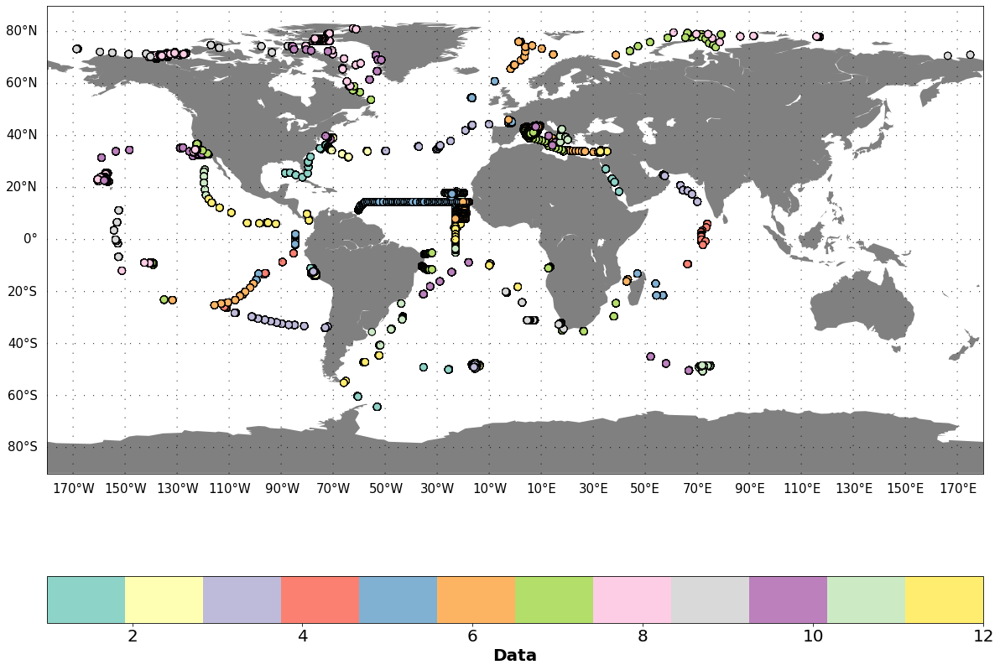

In [35]:
plt.figure(figsize=[20. , 15.],facecolor='w')
#limits=[1.,18.]
m = Basemap(projection='cyl',llcrnrlat=-90,urcrnrlat=90,\
            llcrnrlon=-180,urcrnrlon=180)
m.fillcontinents(color='grey',lake_color='white',zorder = 0)
parallels = np.arange(-80.,81,20.)
m.drawparallels(parallels,dashes=[1,10],labels=[1,0,0,0],fontsize=15) #[False,True,True,False])
meridians = np.arange(10.,351.,20.)
m.drawmeridians(meridians,dashes=[1,10],labels=[True,False,False,True],fontsize=15)
m.scatter(All_Data_tot_OBS_RK_extr.lon.values,All_Data_tot_OBS_RK_extr.lat.values, latlon = True, \
          c=All_Data_tot_OBS_RK_extr.month.values,s=70,\
          cmap='Set3',alpha = None, edgecolors = 'k')
#create colorbar 
cbar = plt.colorbar(orientation='horizontal')
cbar.set_label(label=r'Data',size=20, weight='bold')
cbar.ax.tick_params(labelsize=20)
plt.savefig('/Figures_Article/Obs_RK_months.png')

In [352]:
All_Data_tot_OBS_RK_extr.groupby(['lat','lon','year','month','day']).mean().reset_index()

,lat,lon,year,month,day,depth,watervolume,biovol16,biovol17,biovol18,...,POC_Mmol_wvL_all,GOC_Mmol_wvL_all,POC_Mmol_wvL_low2,GOC_Mmol_wvL_low2,POC_Mmol_wvL_high2,GOC_Mmol_wvL_high2,POC_Mmol_wvL_low2_all,GOC_Mmol_wvL_low2_all,POC_Mmol_wvL_high2_all,GOC_Mmol_wvL_high2_all
0,-64.359,-53.006,2011,1,9,250.000000,27.058100,0.0,0.0,0.0,...,0.002487,0.129237,0.0,0.117571,0.008883,0.108689,0.0,0.131724,0.008883,0.122842
1,-64.349,-53.102,2011,1,9,232.500000,38.098925,0.0,0.0,0.0,...,0.002221,0.091795,0.0,0.084231,0.007776,0.076454,0.0,0.094016,0.007776,0.086239
2,-60.410,-60.449,2011,1,3,242.500000,33.607732,0.0,0.0,0.0,...,0.001967,0.060909,0.0,0.062725,0.007444,0.055281,0.0,0.062875,0.007444,0.055432
3,-60.232,-60.645,2011,1,3,442.500000,40.123446,0.0,0.0,0.0,...,0.001161,0.034654,0.0,0.035012,0.004229,0.030783,0.0,0.035816,0.004229,0.031586
4,-55.103,-65.905,2010,12,17,37.500000,56.375333,0.0,0.0,0.0,...,0.006142,0.040341,0.0,0.046483,0.018088,0.028394,0.0,0.046483,0.018088,0.028394
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,79.673,60.880,2013,8,11,55.000000,47.683636,0.0,0.0,0.0,...,0.009587,0.102865,0.0,0.091602,0.018932,0.072671,0.0,0.112452,0.018932,0.093520
2600,80.908,-61.196,2013,8,22,384.565217,21.145109,0.0,0.0,0.0,...,0.079638,0.337107,0.0,0.391786,0.156683,0.235103,0.0,0.416746,0.156683,0.260063
2601,81.244,-62.355,2013,8,22,234.777778,9.603000,0.0,0.0,0.0,...,0.367575,2.255576,0.0,2.591521,0.750416,1.841105,0.0,2.623152,0.750416,1.872736
2602,81.249,-62.368,2013,8,21,228.088235,10.831765,0.0,0.0,0.0,...,0.331128,2.049468,0.0,2.314752,0.673565,1.641187,0.0,2.380596,0.673565,1.707032


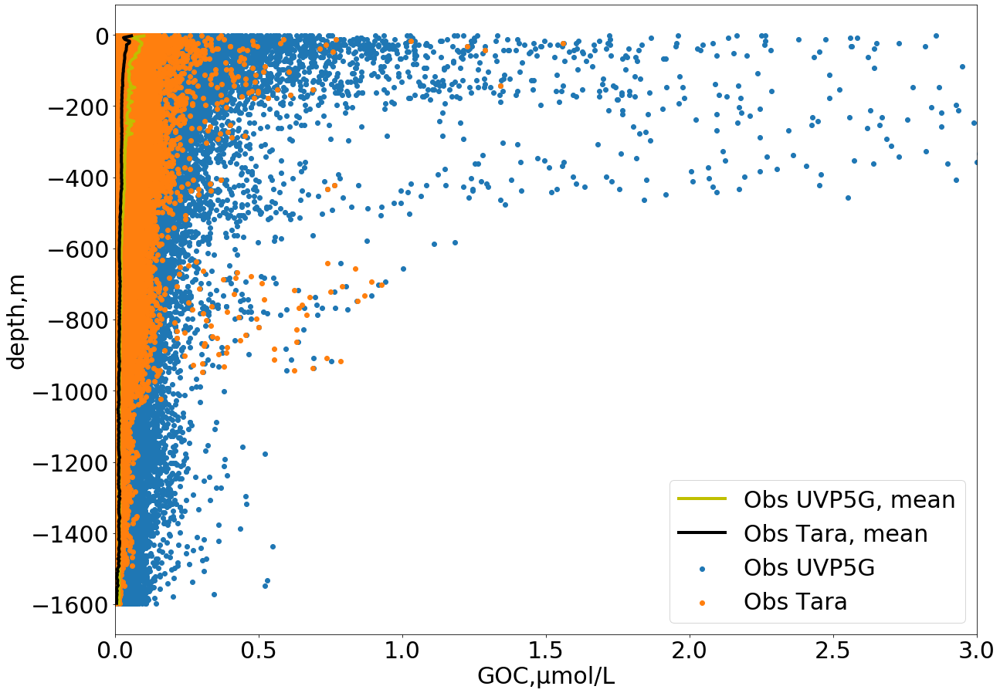

In [363]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_tot_OBS_extr,'GOC','GOC_Mmol_wvL','GOC_Mmol_wvL',\
                    'Obs UVP5G','Obs Tara',0,3,'Scatter_All_RKvsTara_GOC.png')

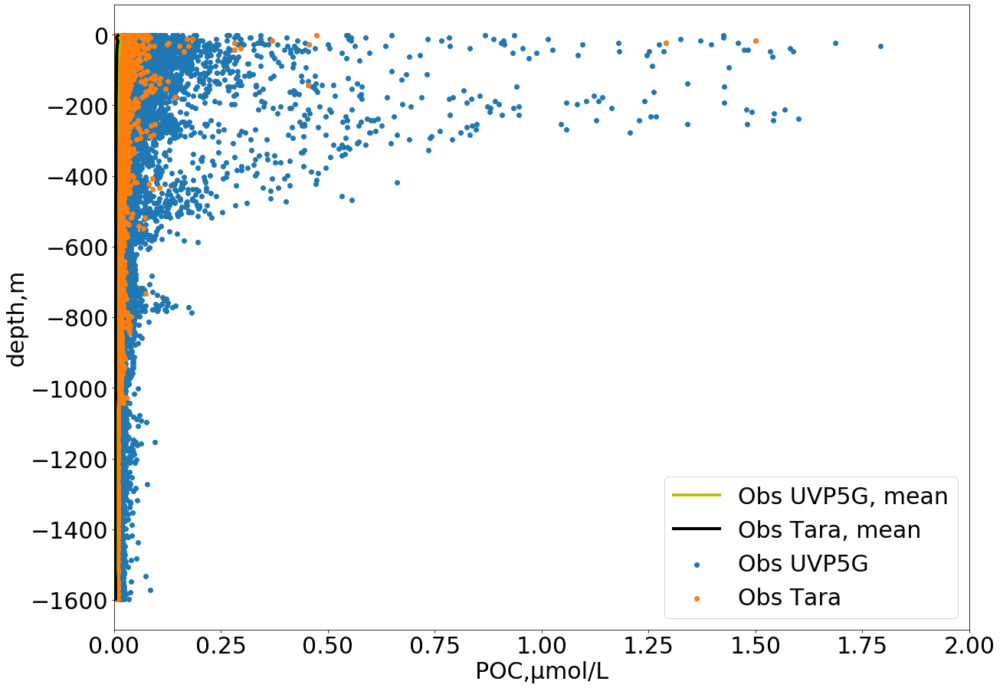

In [364]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_tot_OBS_extr,'POC','POC_Mmol_wvL','POC_Mmol_wvL',\
                    'Obs UVP5G','Obs Tara',0,2,'Scatter_All_RKvsTara_POC.png')

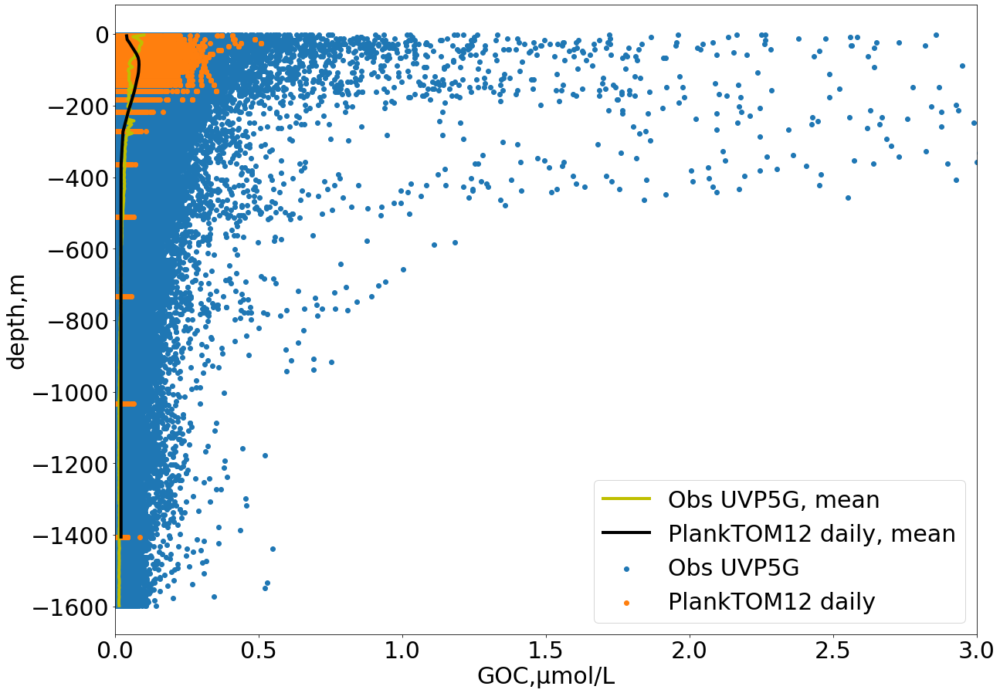

In [365]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs UVP5G','PlankTOM12 daily',0,3,'Scatter_PlankTOMDaily_All_RK_GOC.png')

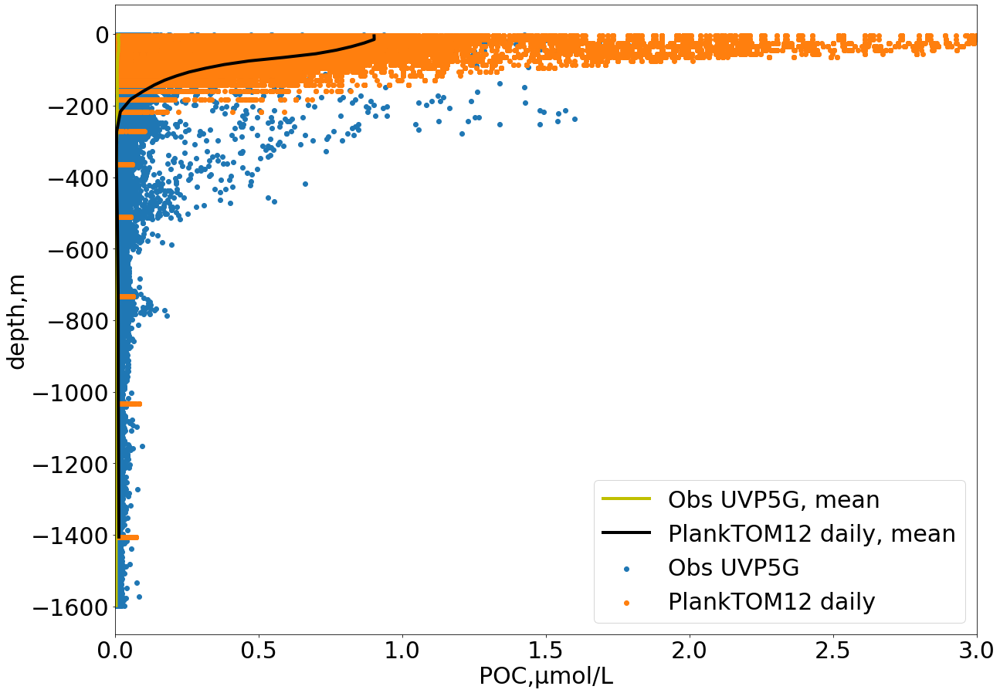

In [366]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new,'POC','POC_Mmol_wvL','POC',\
                    'Obs UVP5G','PlankTOM12 daily',0,3,'Scatter_PlankTOMDaily_All_RK_POC.png')

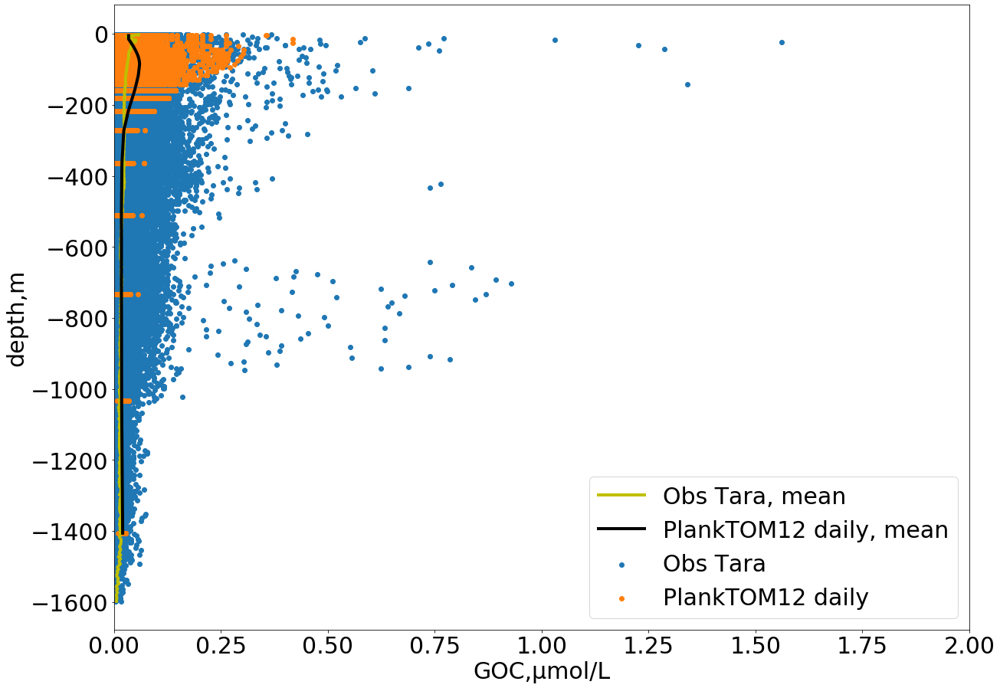

In [368]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs Tara','PlankTOM12 daily',0,2,'Scatter_PlankTOMDaily_All_Tara_GOC.png')

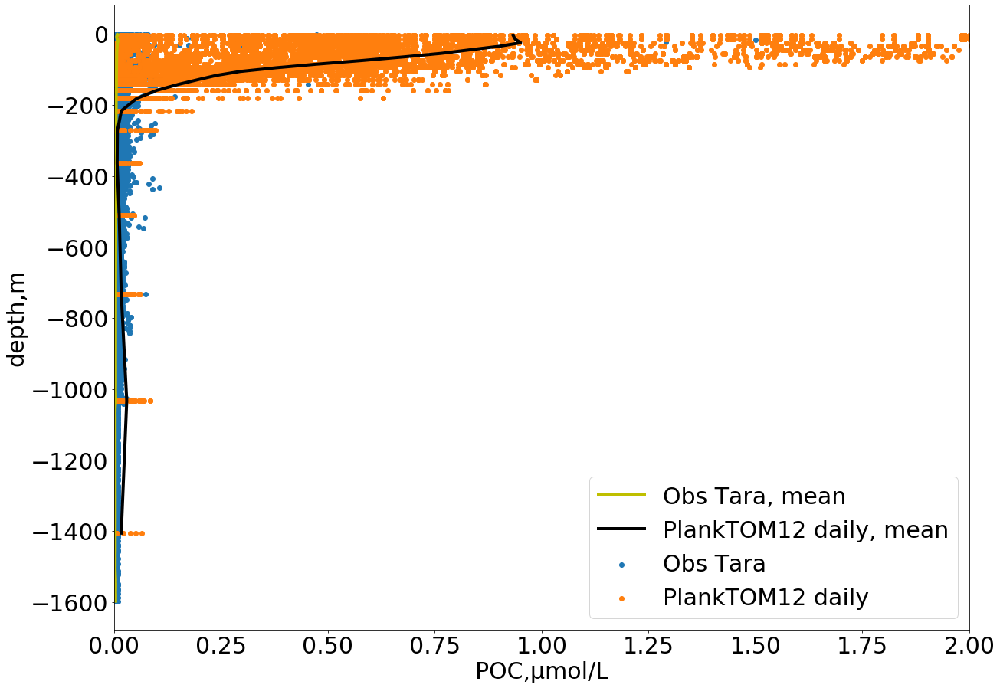

In [369]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new,'POC','POC_Mmol_wvL','POC',\
                    'Obs Tara','PlankTOM12 daily',0,2,'Scatter_PlankTOMDaily_All_Tara_POC.png')

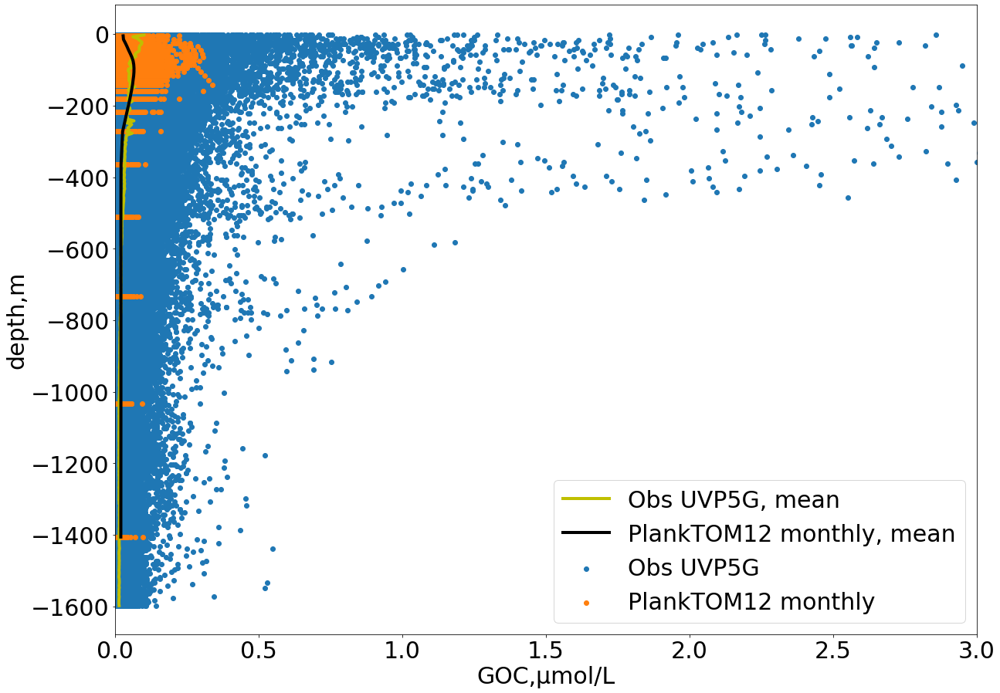

In [372]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new_month,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs UVP5G','PlankTOM12 monthly',0,3,'Scatter_PlankTOMMonthly_All_RK_GOC.png')

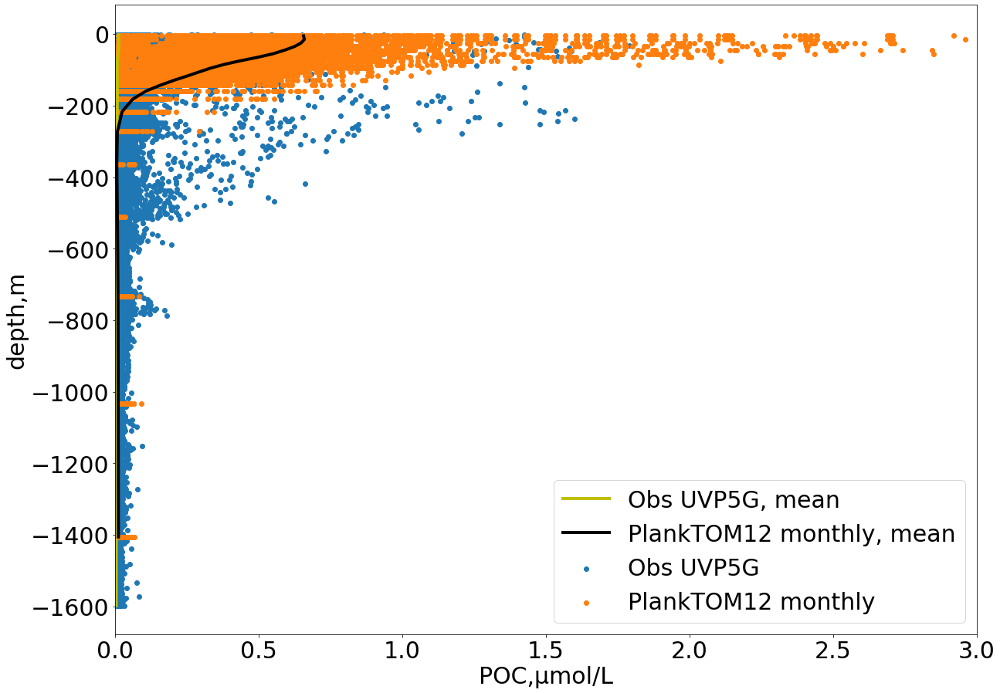

In [373]:
plot_scatter_two_df(All_Data_tot_OBS_RK_extr,All_Data_Pl_All_RK_new_month,'POC','POC_Mmol_wvL','POC',\
                    'Obs UVP5G','PlankTOM12 monthly',0,3,'Scatter_PlankTOMMonthly_All_RK_POC.png')

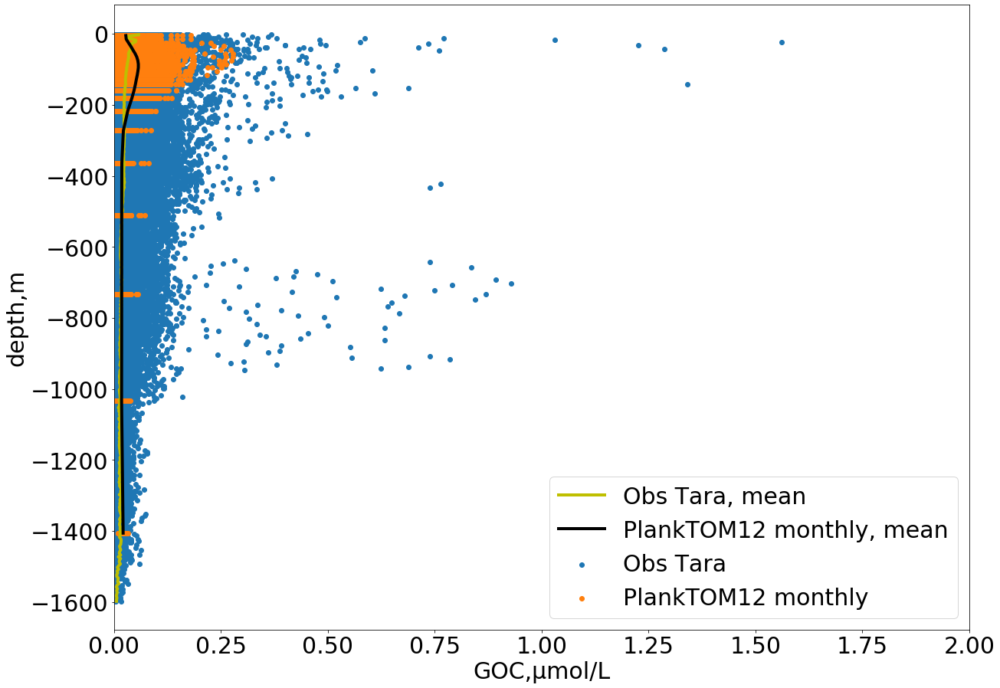

In [374]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new_month,'GOC','GOC_Mmol_wvL','GOC',\
                    'Obs Tara','PlankTOM12 monthly',0,2,'Scatter_PlankTOMMonthly_All_Tara_GOC.png')

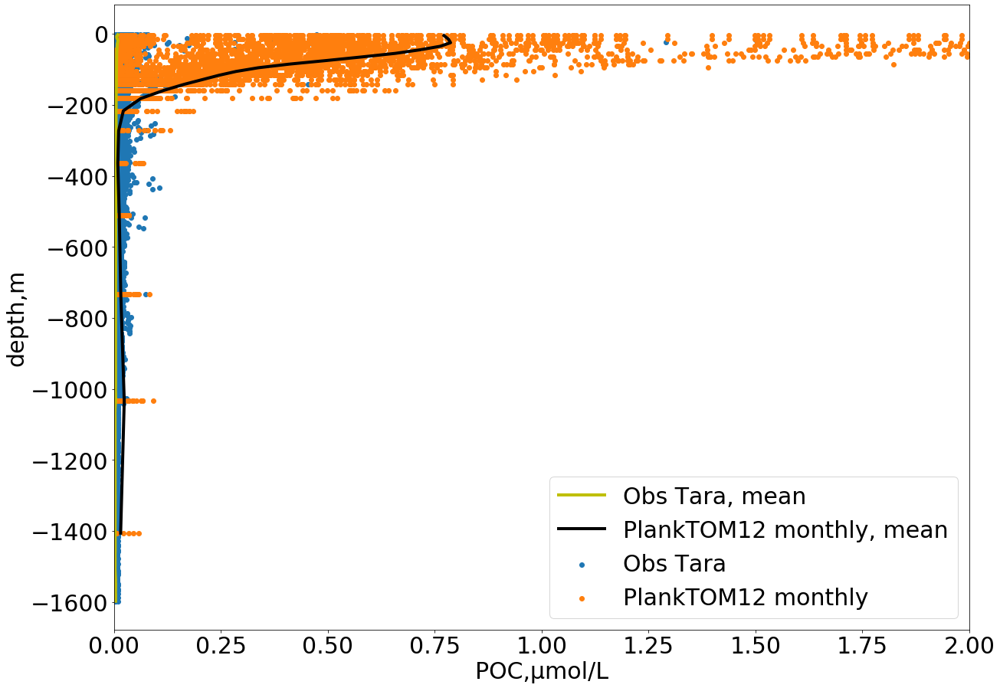

In [375]:
plot_scatter_two_df(All_Data_tot_OBS_extr,All_Data_Pl_All_new_month,'POC','POC_Mmol_wvL','POC',\
                    'Obs Tara','PlankTOM12 monthly',0,2,'Scatter_PlankTOMMonthly_All_Tara_POC.png')

In [376]:
All_Data_tot_OBS_extr_mean = All_Data_tot_OBS_extr.groupby('depth').sum().reset_index()
All_Data_tot_OBS_RK_extr_mean = All_Data_tot_OBS_RK_extr.groupby('depth').sum().reset_index()
All_Data_Pl_new_mean = All_Data_Pl_All_new.groupby('depth').sum().reset_index()
All_Data_Pl_RK_new_mean = All_Data_Pl_All_RK_new.groupby('depth').sum().reset_index()

In [377]:
All_Data_tot_OBS_RK_extr['lon'] = All_Data_tot_OBS_RK_extr['lon'].apply(lambda x: round(x, 2))
All_Data_tot_OBS_RK_extr['lat'] = All_Data_tot_OBS_RK_extr['lat'].apply(lambda x: round(x, 2))
All_Data_tot_OBS_extr['lon'] = All_Data_tot_OBS_extr['lon'].apply(lambda x: round(x, 2))
All_Data_tot_OBS_extr['lat'] = All_Data_tot_OBS_extr['lat'].apply(lambda x: round(x, 2))

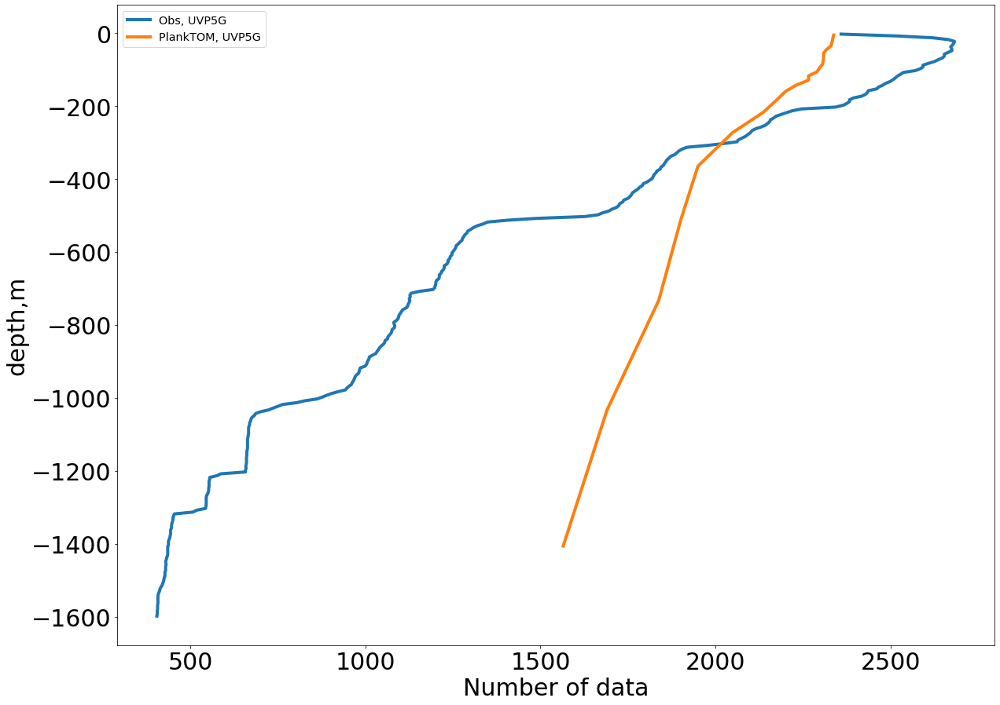

In [378]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(All_Data_tot_OBS_RK_extr.groupby(['depth']).size().values,-All_Data_tot_OBS_RK_extr.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'Obs, UVP5G')
plt.plot(All_Data_Pl_All_RK_new.groupby(['depth']).size().values,-All_Data_Pl_All_RK_new.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'PlankTOM, UVP5G')
locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Number of data',fontsize=30)
plt.ylabel('depth,m',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 'x-large')
#plt.xlim([0,3])
plt.savefig('/Figures_Article/NumberData_PlankTOMDaily_RK_GOC.png')

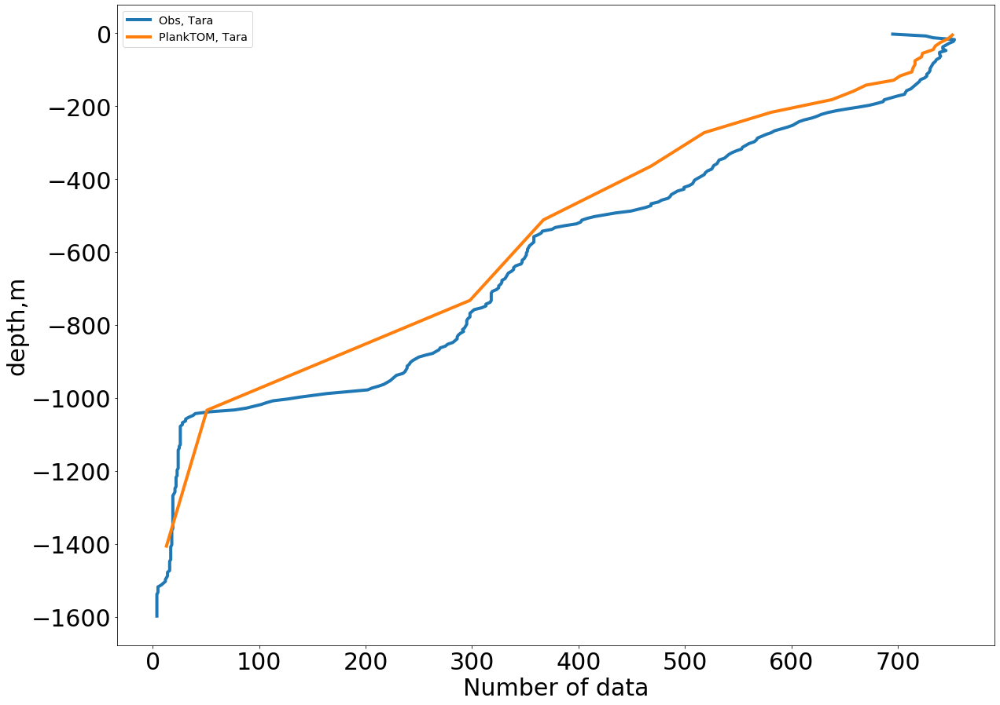

In [379]:
plt.figure(figsize=[20. , 15.],facecolor='w')
plt.plot(All_Data_tot_OBS_extr.groupby(['depth']).size().values,-All_Data_tot_OBS_extr.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'Obs, Tara')
plt.plot(All_Data_Pl_All_new.groupby(['depth']).size().values,-All_Data_Pl_All_new.groupby('depth').mean().reset_index()['depth'].values, linewidth = 4, label = 'PlankTOM, Tara')
locsX,labelsx = plt.xticks(size=30)
plt.xlabel('Number of data',fontsize=30)
plt.ylabel('depth,m',fontsize=30)
locsY,labelsy = plt.yticks(size=30)   
plt.legend(fontsize = 'x-large')
#plt.xlim([0,3])
plt.savefig('/Figures_Article/NumberData_PlankTOMDaily_Tara_GOC.png')


In [381]:
test = ['','_all','_low2','_high2','_low2_all','_high2_all']

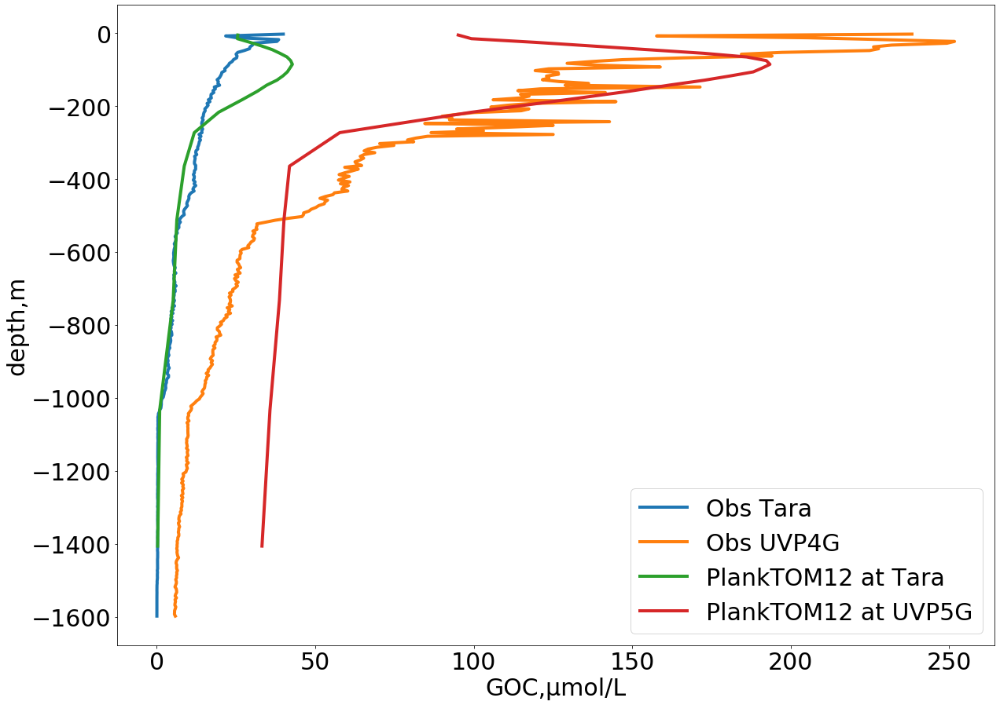

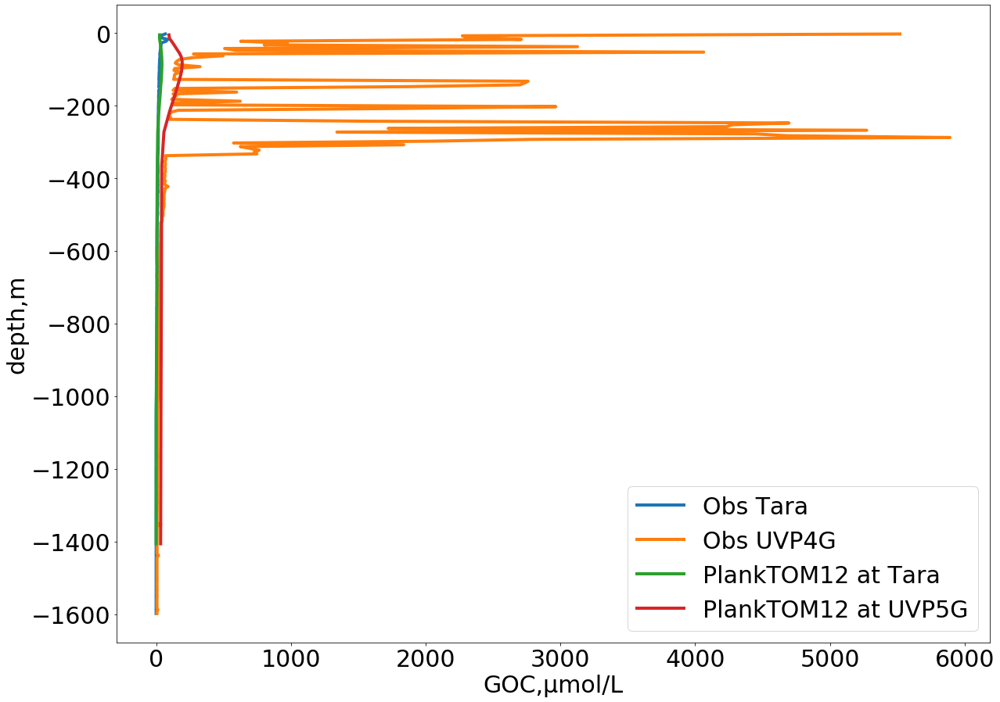

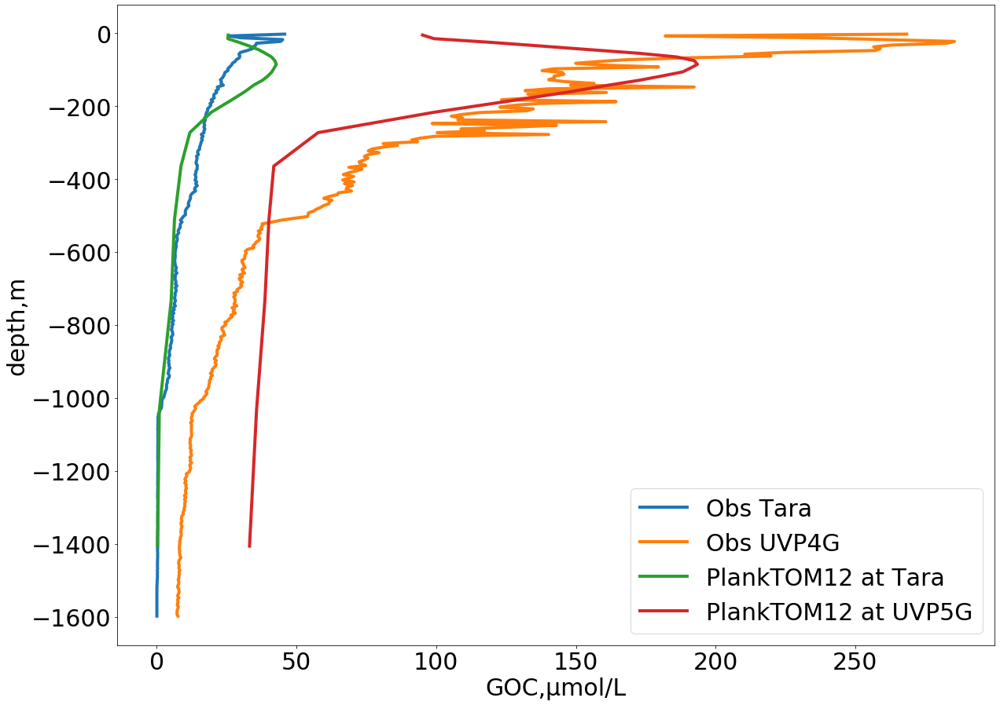

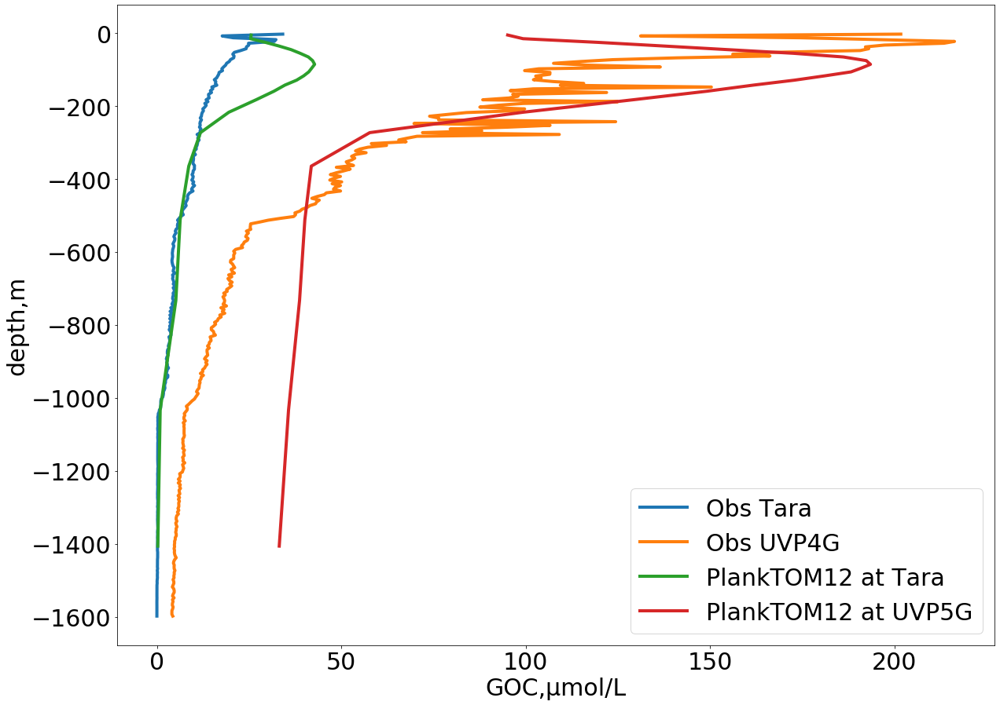

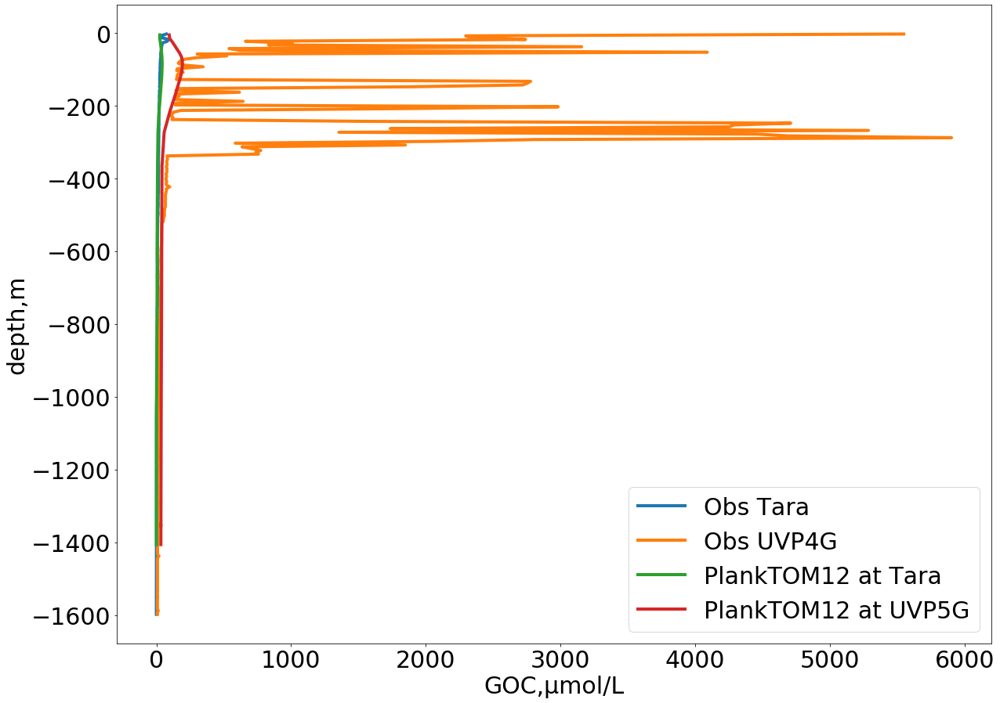

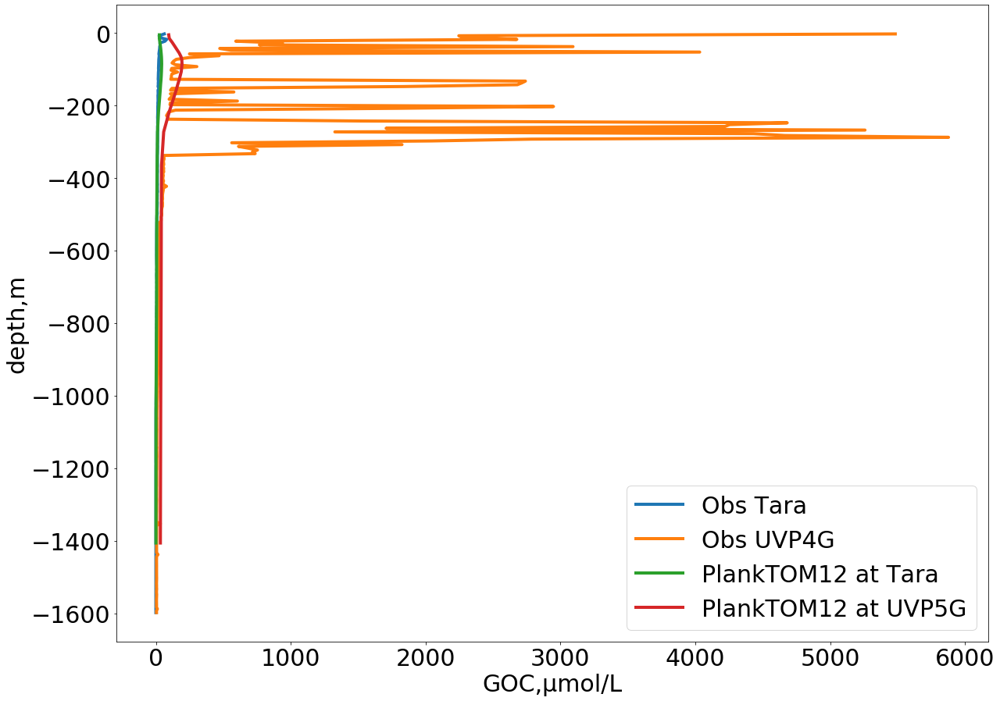

In [383]:
for r in test:
    plot_mean_profiles(All_Data_tot_OBS_extr_mean,All_Data_tot_OBS_RK_extr_mean,All_Data_Pl_new_mean,\
                       All_Data_Pl_RK_new_mean,\
                       'GOC','GOC_Mmol_wvL'+r,'GOC_Mmol_wvL'+r,'GOC','GOC',\
                       'Obs Tara','Obs UVP4G','PlankTOM12 at Tara','PlankTOM12 at UVP5G',\
                       'GOC'+r+'_vertical_pr_comp_Daily_PlvsObs.png')

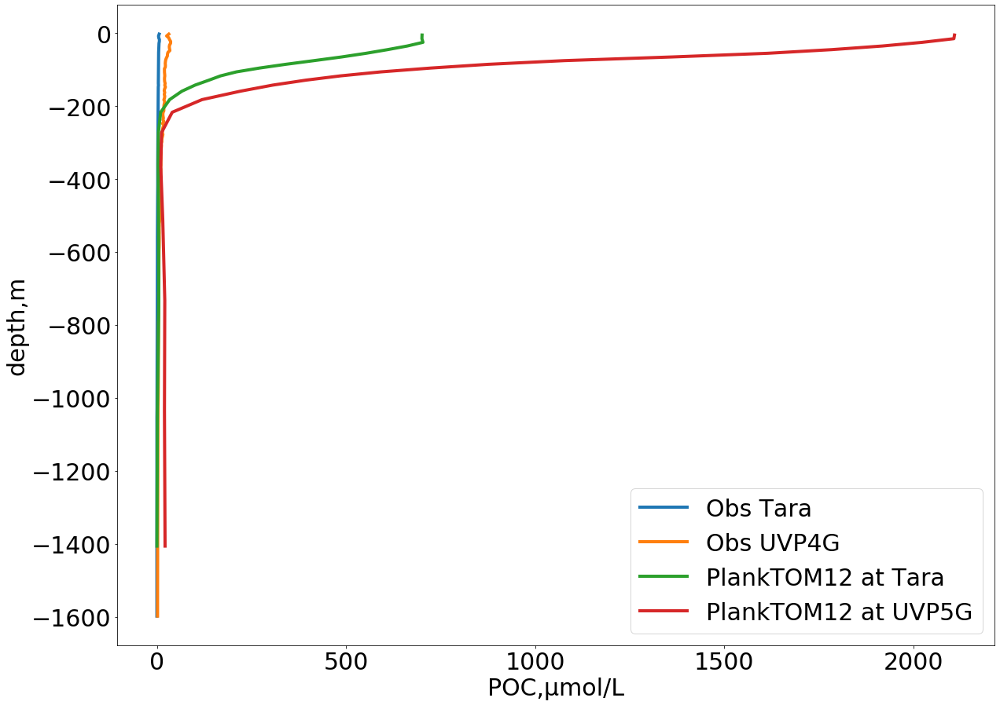

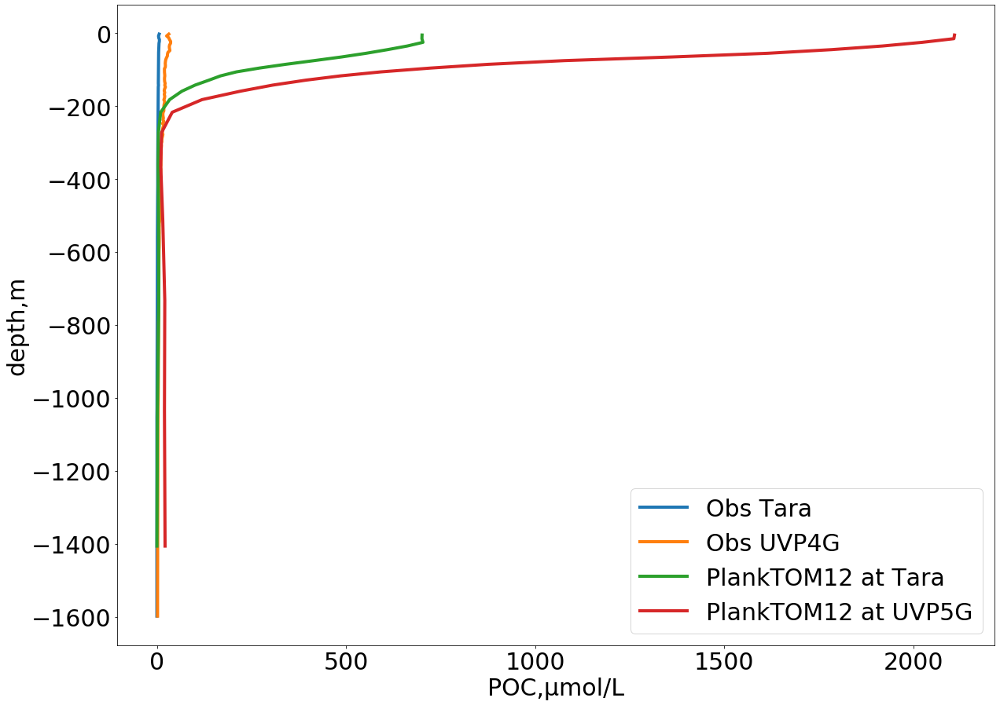

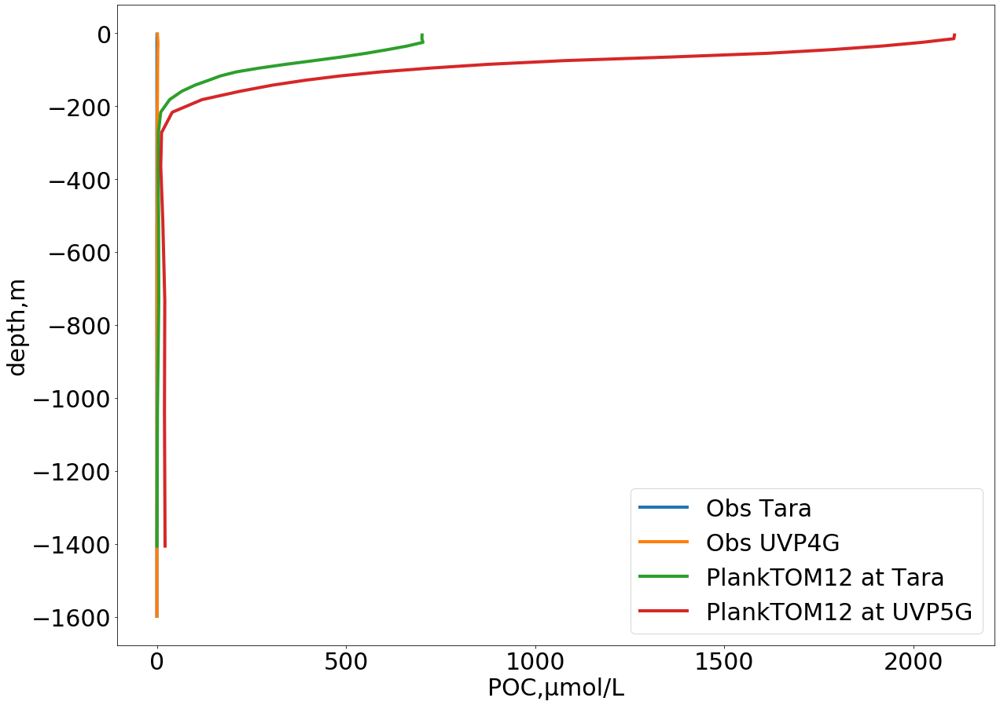

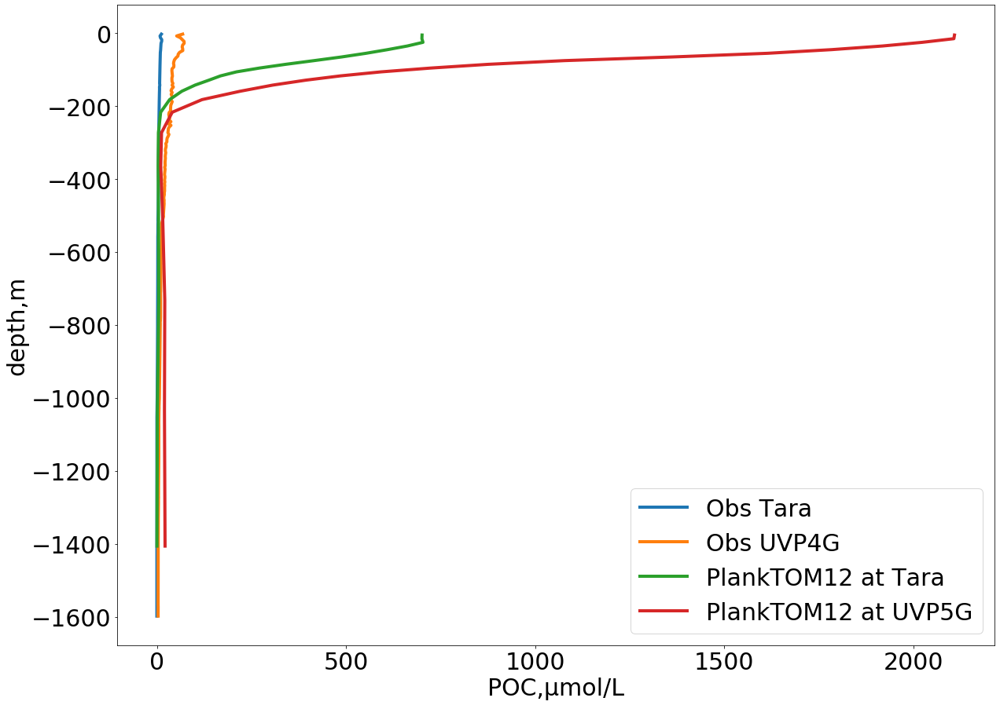

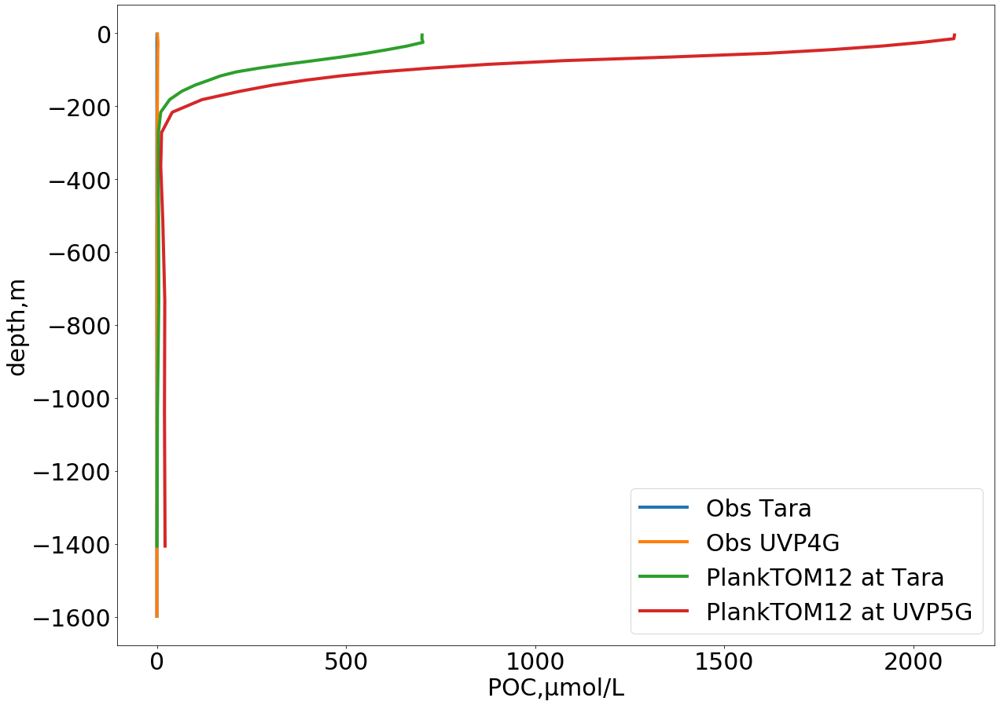

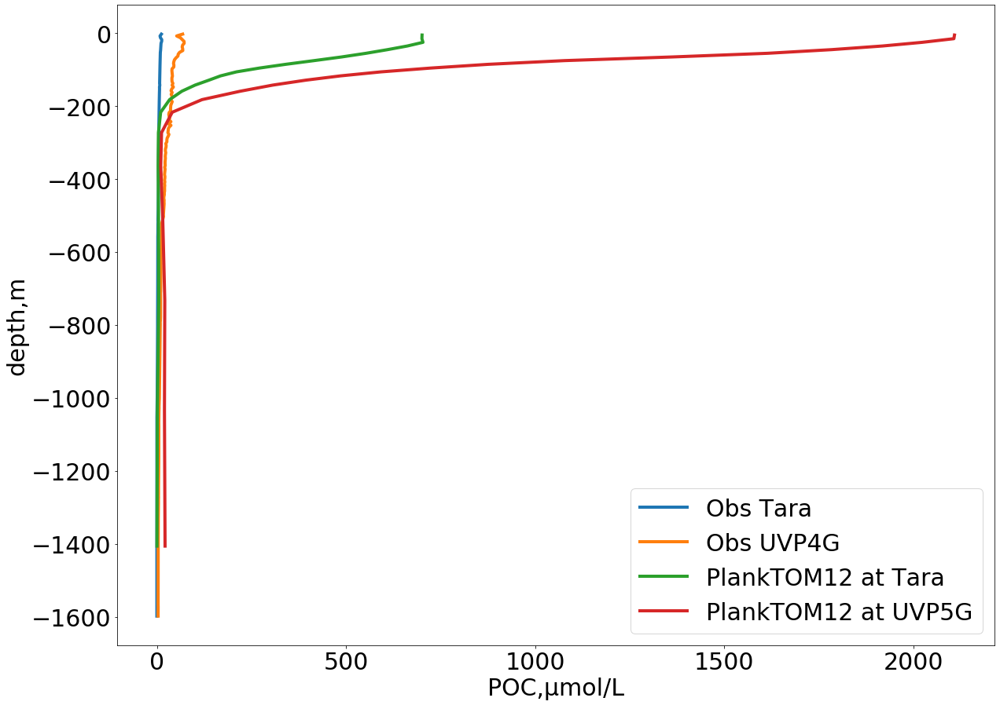

In [385]:
for r in test:
    plot_mean_profiles(All_Data_tot_OBS_extr_mean,All_Data_tot_OBS_RK_extr_mean,All_Data_Pl_new_mean,\
                       All_Data_Pl_RK_new_mean,\
                       'POC','POC_Mmol_wvL'+r,'POC_Mmol_wvL'+r,'POC','POC',\
                       'Obs Tara','Obs UVP4G','PlankTOM12 at Tara','PlankTOM12 at UVP5G',\
                       'POC'+r+'_vertical_pr_comp_Daily_PlvsObs.png')

In [ ]:
#separation of zone on Figure S1

In [154]:
All_Data_tot_OBS_extr_zone1 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -180.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < -50.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 40.)]

All_Data_tot_OBS_RK_extr_zone1 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -180.) &\
                                                       (All_Data_tot_OBS_RK_extr['lon'] < -50.) &\
                                                       (All_Data_tot_OBS_RK_extr['lat'] > 40.)]

All_Data_Pl_All_new_zone1 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -180.) &\
                                            (All_Data_Pl_All_new['lon'] < -50.) &\
                                            (All_Data_Pl_All_new['lat'] > 40.)]

All_Data_Pl_All_RK_new_zone1 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -180.) &\
                                            (All_Data_Pl_All_RK_new['lon'] < -50.) &\
                                            (All_Data_Pl_All_RK_new['lat'] > 40.)]

All_Data_Pl_All_RK_new_month_zone1 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -180.) &\
                                            (All_Data_Pl_All_RK_new_month['lon_Pl'] < -50.) &\
                                            (All_Data_Pl_All_RK_new_month['lat_Pl'] > 40.)]

In [158]:
All_Data_tot_OBS_extr_zone2 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -30.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 180.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 50.)]

All_Data_tot_OBS_RK_extr_zone2 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -30.) &\
                                                       (All_Data_tot_OBS_RK_extr['lon'] < 180.) &\
                                                       (All_Data_tot_OBS_RK_extr['lat'] > 50.)]

All_Data_Pl_All_new_zone2 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -30.) &\
                                            (All_Data_Pl_All_new['lon'] < 180.) &\
                                            (All_Data_Pl_All_new['lat'] > 50.)]

All_Data_Pl_All_RK_new_zone2 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -30.) &\
                                            (All_Data_Pl_All_RK_new['lon'] < 180.) &\
                                            (All_Data_Pl_All_RK_new['lat'] > 50.)]

All_Data_Pl_All_RK_new_month_zone2 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -30.) &\
                                            (All_Data_Pl_All_RK_new_month['lon_Pl'] < 180.) &\
                                            (All_Data_Pl_All_RK_new_month['lat_Pl'] > 50.)]

In [165]:
All_Data_tot_OBS_extr_zone3 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -90.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 0.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 20.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 50.)]

All_Data_tot_OBS_RK_extr_zone3 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -90.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 0.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > 20.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 50.)]

All_Data_Pl_All_new_zone3 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -90.) &\
                                                    (All_Data_Pl_All_new['lon'] < 0.) &\
                                                    (All_Data_Pl_All_new['lat'] > 20.) &\
                                                    (All_Data_Pl_All_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_zone3 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -90.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 0.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > 20.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_month_zone3 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -90.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 0.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > 20.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 50.)]

In [169]:
All_Data_tot_OBS_extr_zone4 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -70.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < -10.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -8.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 20.)]

All_Data_tot_OBS_RK_extr_zone4 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < -10.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -8.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 20.)]

All_Data_Pl_All_new_zone4 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -70.) &\
                                                    (All_Data_Pl_All_new['lon'] < -10.) &\
                                                    (All_Data_Pl_All_new['lat'] > -8.) &\
                                                    (All_Data_Pl_All_new['lat'] < 20.)]

All_Data_Pl_All_RK_new_zone4 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -70.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < -10.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -8.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 20.)]

All_Data_Pl_All_RK_new_month_zone4 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < -10.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -8.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 20.)]

In [173]:
All_Data_tot_OBS_extr_zone5 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -70.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -8.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -40.)]

All_Data_tot_OBS_RK_extr_zone5 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -8.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -40.)]

All_Data_Pl_All_new_zone5 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -70.) &\
                                                    (All_Data_Pl_All_new['lon'] < 30.) &\
                                                    (All_Data_Pl_All_new['lat'] < -8.) &\
                                                    (All_Data_Pl_All_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_zone5 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -70.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -8.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_month_zone5 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -8.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -40.)]

In [177]:
All_Data_tot_OBS_extr_zone6 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > -70.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -40.)]

All_Data_tot_OBS_RK_extr_zone6 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -40.)]

All_Data_Pl_All_new_zone6 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > -70.) &\
                                                    (All_Data_Pl_All_new['lon'] < 30.) &\
                                                    (All_Data_Pl_All_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_zone6 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > -70.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_month_zone6 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -40.)]

In [185]:
All_Data_tot_OBS_extr_zone7 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > 0.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 40.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 50.)]

All_Data_tot_OBS_RK_extr_zone7 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > 0.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 40.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 50.)]

All_Data_Pl_All_new_zone7 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > 0.) &\
                                                    (All_Data_Pl_All_new['lon'] < 40.) &\
                                                    (All_Data_Pl_All_new['lat'] > 30.) &\
                                                    (All_Data_Pl_All_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_zone7 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > 0.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 40.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 50.)]

All_Data_Pl_All_RK_new_month_zone7 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > 0.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 40.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 50.)]

In [189]:
All_Data_tot_OBS_extr_zone8 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > 30.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 90.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 30.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -40.)]

All_Data_tot_OBS_RK_extr_zone8 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 90.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -40.)]

All_Data_Pl_All_new_zone8 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > 30.) &\
                                                    (All_Data_Pl_All_new['lon'] < 90.) &\
                                                    (All_Data_Pl_All_new['lat'] < 30.) &\
                                                    (All_Data_Pl_All_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_zone8 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > 30.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 90.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 30.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -40.)]

All_Data_Pl_All_RK_new_month_zone8 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 90.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -40.)]

In [193]:
All_Data_tot_OBS_extr_zone9 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] > 30.) &\
                                                       (All_Data_tot_OBS_extr['lon'] < 90.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -40.)]

All_Data_tot_OBS_RK_extr_zone9 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] > 30.) &\
                                                              (All_Data_tot_OBS_RK_extr['lon'] < 90.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -40.)]

All_Data_Pl_All_new_zone9 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] > 30.) &\
                                                    (All_Data_Pl_All_new['lon'] < 90.) &\
                                                    (All_Data_Pl_All_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_zone9 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] > 30.) &\
                                                          (All_Data_Pl_All_RK_new['lon'] < 90.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -40.)]

All_Data_Pl_All_RK_new_month_zone9 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] > 30.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lon_Pl'] < 90.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -40.)]

In [197]:
All_Data_tot_OBS_extr_zone10 = All_Data_tot_OBS_extr.loc[((All_Data_tot_OBS_extr['lon'] < -110.) &\
                                                         (All_Data_tot_OBS_extr['lat'] > 20.) &\
                                                         (All_Data_tot_OBS_extr['lat'] < 40.))]

All_Data_tot_OBS_RK_extr_zone10 = All_Data_tot_OBS_RK_extr.loc[((All_Data_tot_OBS_RK_extr['lon'] < -110.) &\
                                                               (All_Data_tot_OBS_RK_extr['lat'] > 20.) &\
                                                               (All_Data_tot_OBS_RK_extr['lat'] < 40.))]

All_Data_Pl_All_new_zone10 = All_Data_Pl_All_new.loc[((All_Data_Pl_All_new['lon'] < -110.) &\
                                                     (All_Data_Pl_All_new['lat'] > 20.) &\
                                                     (All_Data_Pl_All_new['lat'] < 40.))]

All_Data_Pl_All_RK_new_zone10 = All_Data_Pl_All_RK_new.loc[((All_Data_Pl_All_RK_new['lon'] < -110.) &\
                                                           (All_Data_Pl_All_RK_new['lat'] > 20.) &\
                                                           (All_Data_Pl_All_RK_new['lat'] < 40.))]

All_Data_Pl_All_RK_new_month_zone10 = All_Data_Pl_All_RK_new_month.loc[((All_Data_Pl_All_RK_new_month['lon_Pl'] < -110.) &\
                                                                       (All_Data_Pl_All_RK_new_month['lat_Pl'] > 20.) &\
                                                                       (All_Data_Pl_All_RK_new_month['lat_Pl'] < 40.))]

In [201]:
All_Data_tot_OBS_extr_zone11 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] < -70.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < 20.) &\
                                                       (All_Data_tot_OBS_extr['lat'] > -20.)]

All_Data_tot_OBS_RK_extr_zone11 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] < -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < 20.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] > -20.)]

All_Data_Pl_All_new_zone11 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] < -70.) &\
                                                    (All_Data_Pl_All_new['lat'] < 20.) &\
                                                    (All_Data_Pl_All_new['lat'] > -20.)]

All_Data_Pl_All_RK_new_zone11 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] < -70.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < 20.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] > -20.)]

All_Data_Pl_All_RK_new_month_zone11 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] < -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < 20.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] > -20.)]

In [205]:
All_Data_tot_OBS_extr_zone12 = All_Data_tot_OBS_extr.loc[(All_Data_tot_OBS_extr['lon'] < -70.) &\
                                                       (All_Data_tot_OBS_extr['lat'] < -20.)]

All_Data_tot_OBS_RK_extr_zone12 = All_Data_tot_OBS_RK_extr.loc[(All_Data_tot_OBS_RK_extr['lon'] < -70.) &\
                                                              (All_Data_tot_OBS_RK_extr['lat'] < -20.)]

All_Data_Pl_All_new_zone12 = All_Data_Pl_All_new.loc[(All_Data_Pl_All_new['lon'] < -70.) &\
                                                    (All_Data_Pl_All_new['lat'] < -20.)]

All_Data_Pl_All_RK_new_zone12 = All_Data_Pl_All_RK_new.loc[(All_Data_Pl_All_RK_new['lon'] < -70.) &\
                                                          (All_Data_Pl_All_RK_new['lat'] < -20.)]

All_Data_Pl_All_RK_new_month_zone12 = All_Data_Pl_All_RK_new_month.loc[(All_Data_Pl_All_RK_new_month['lon_Pl'] < -70.) &\
                                                                      (All_Data_Pl_All_RK_new_month['lat_Pl'] < -20.)]

In [389]:
zone_names = ['zone1','zone2','zone3','zone4','zone5','zone6','zone7','zone8','zone9','zone10','zone11','zone12']

/Users/annasommer/opt/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  after removing the cwd from sys.path.


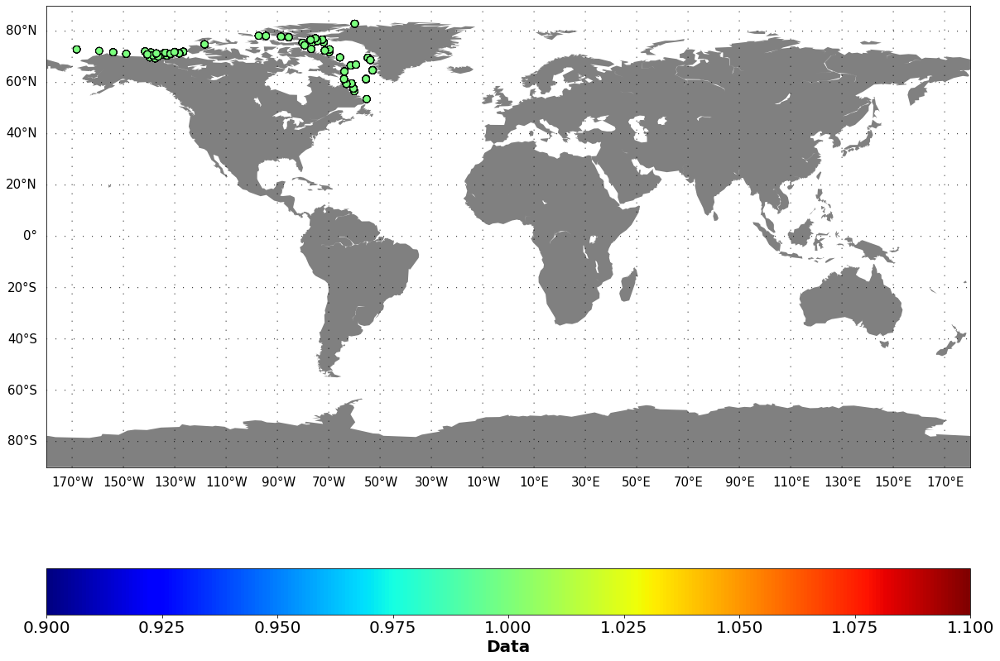

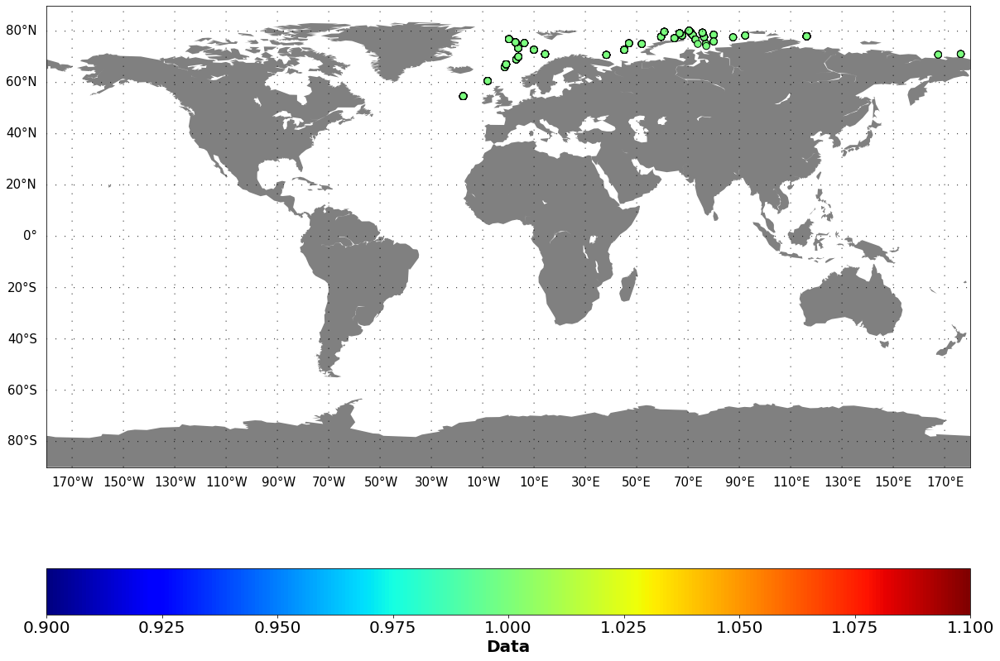

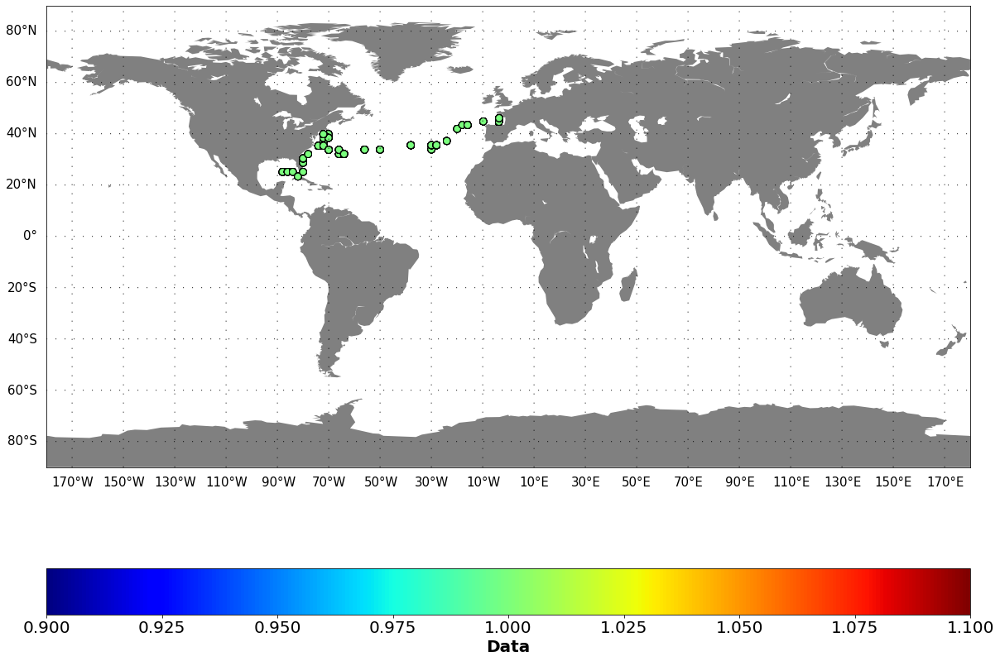

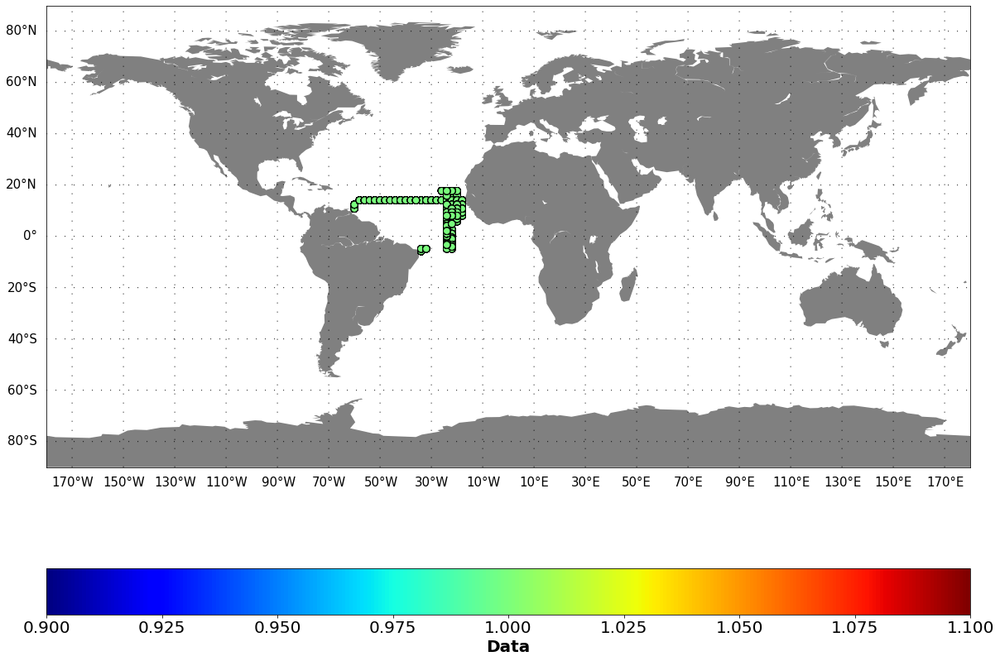

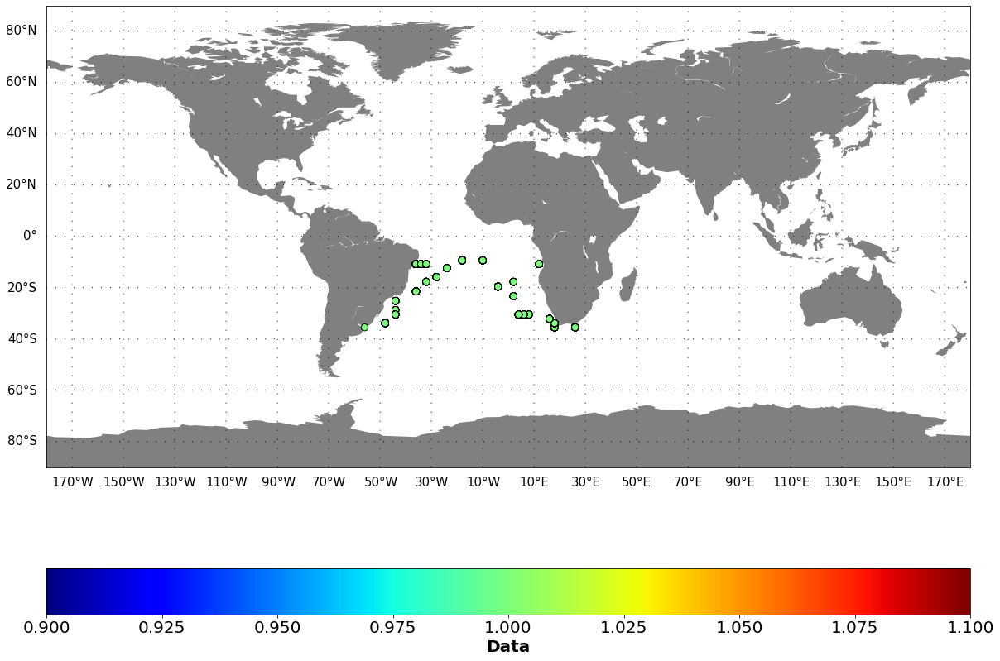

...

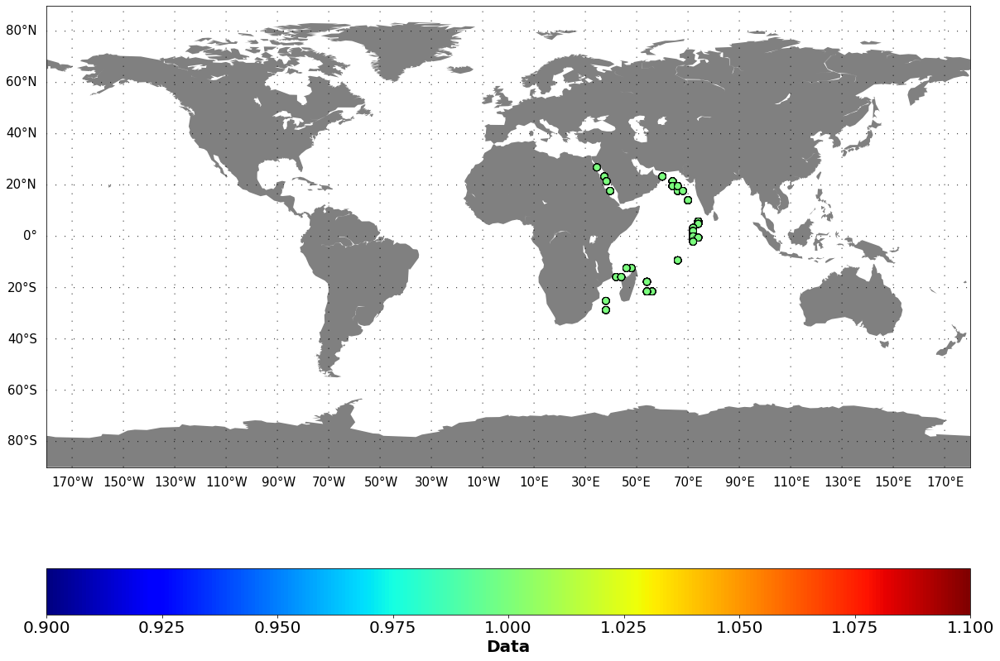

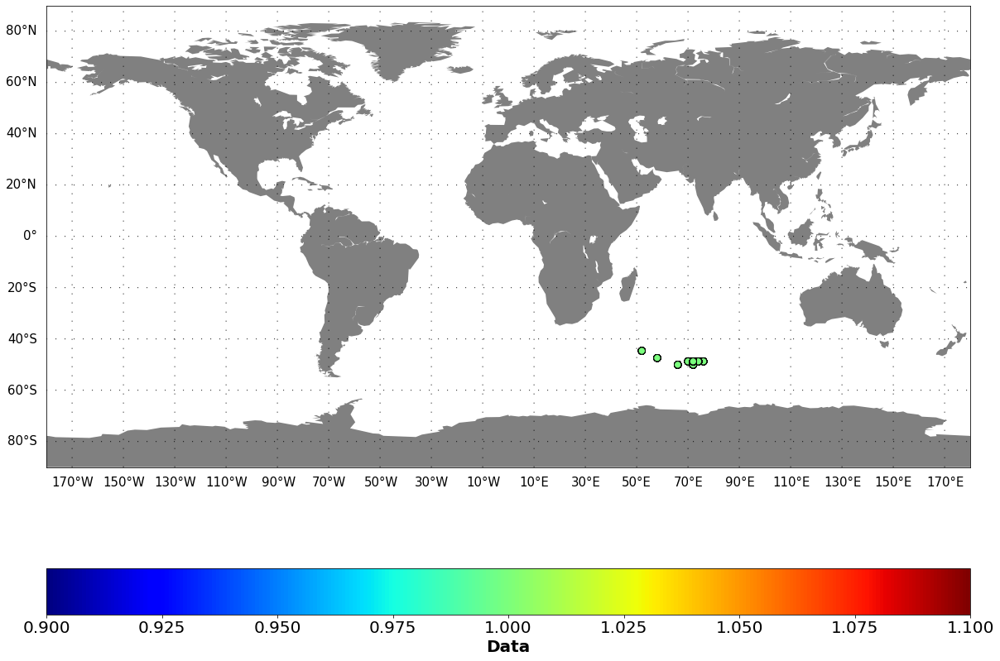

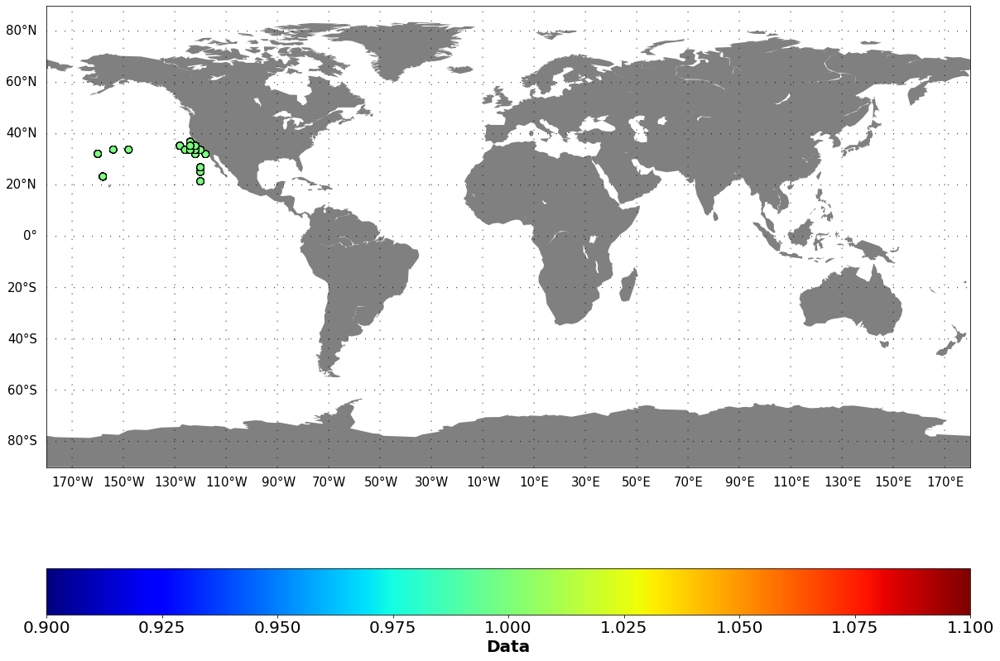

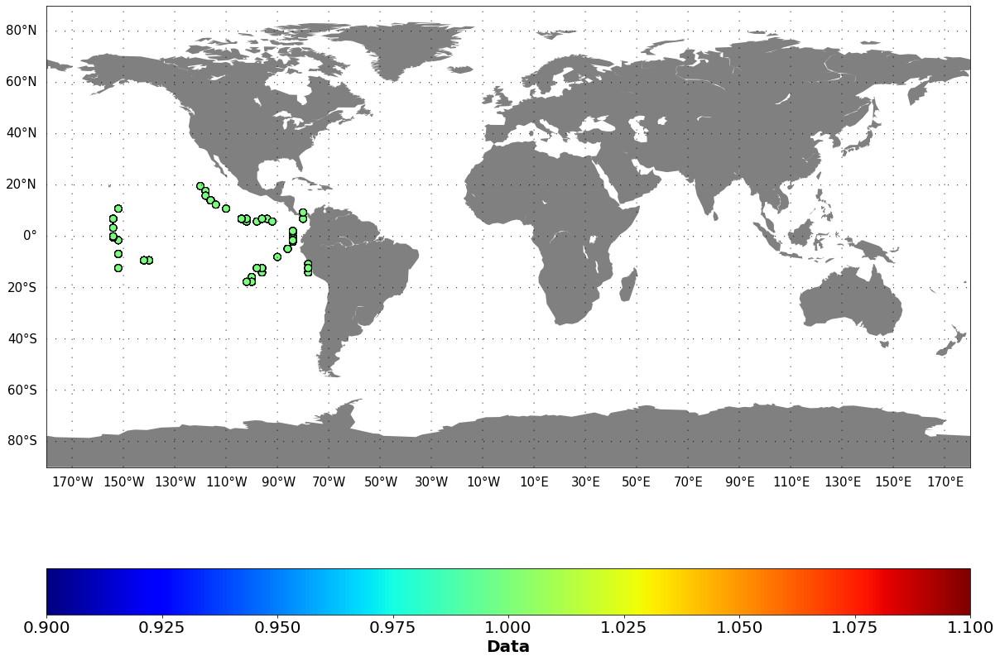

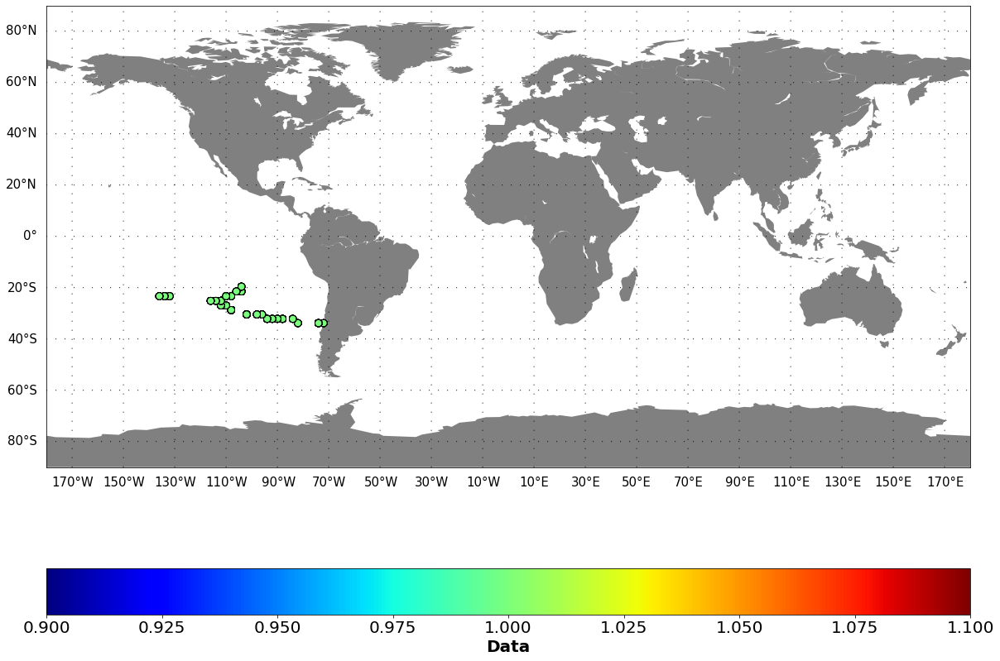

In [390]:
for zone in zone_names:
    plot_glob_distr(globals()["All_Data_Pl_All_RK_new_"+zone],'lat_Pl','lon_Pl',zone+'.png')

In [ ]:
#plot Figure S3

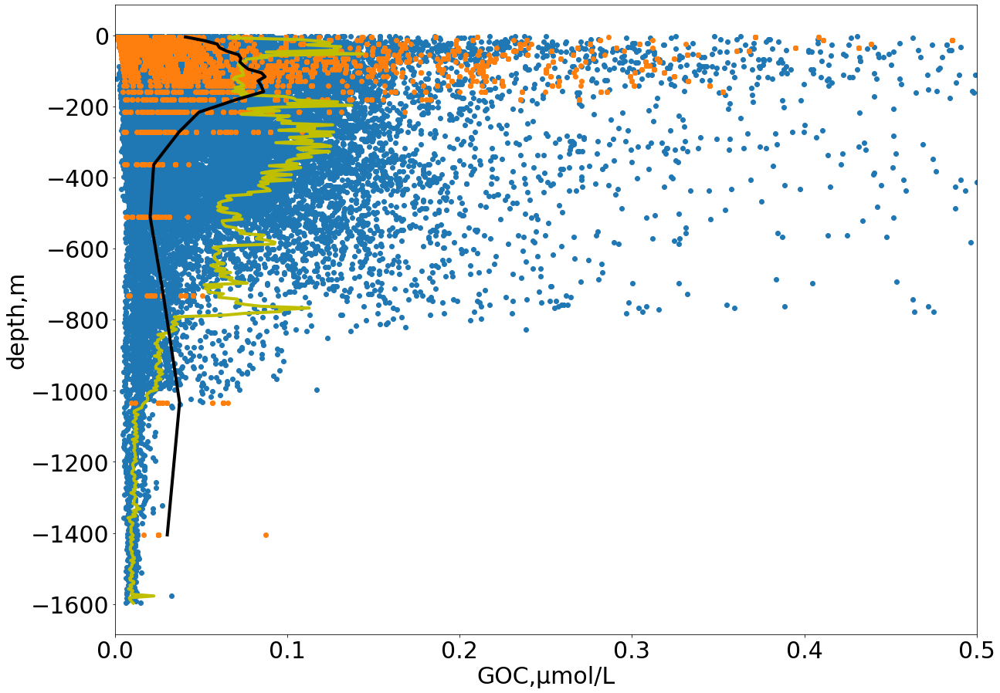

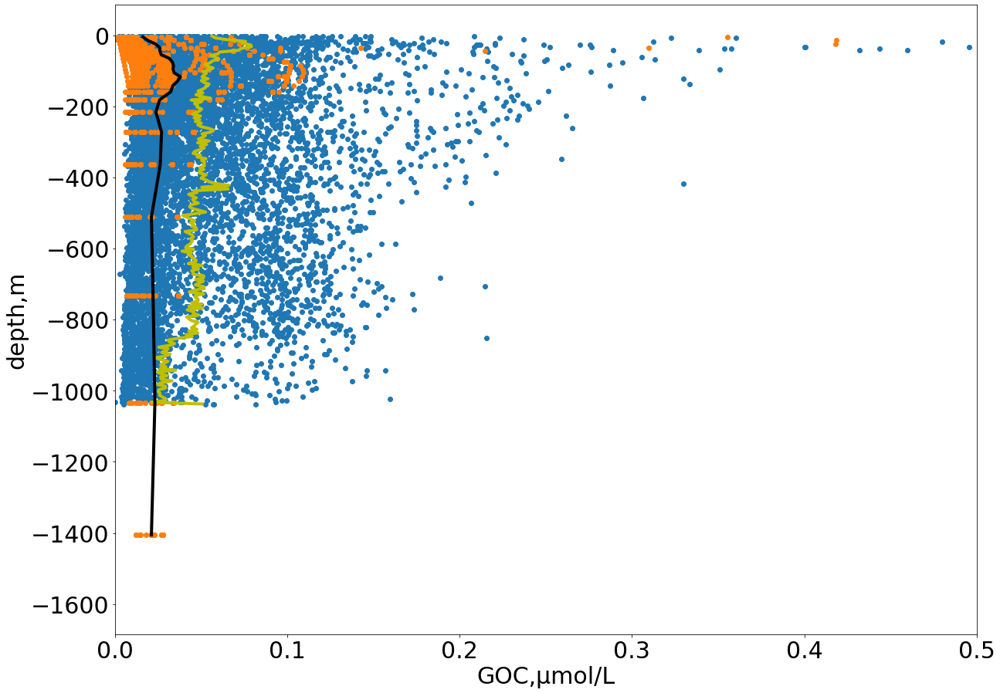

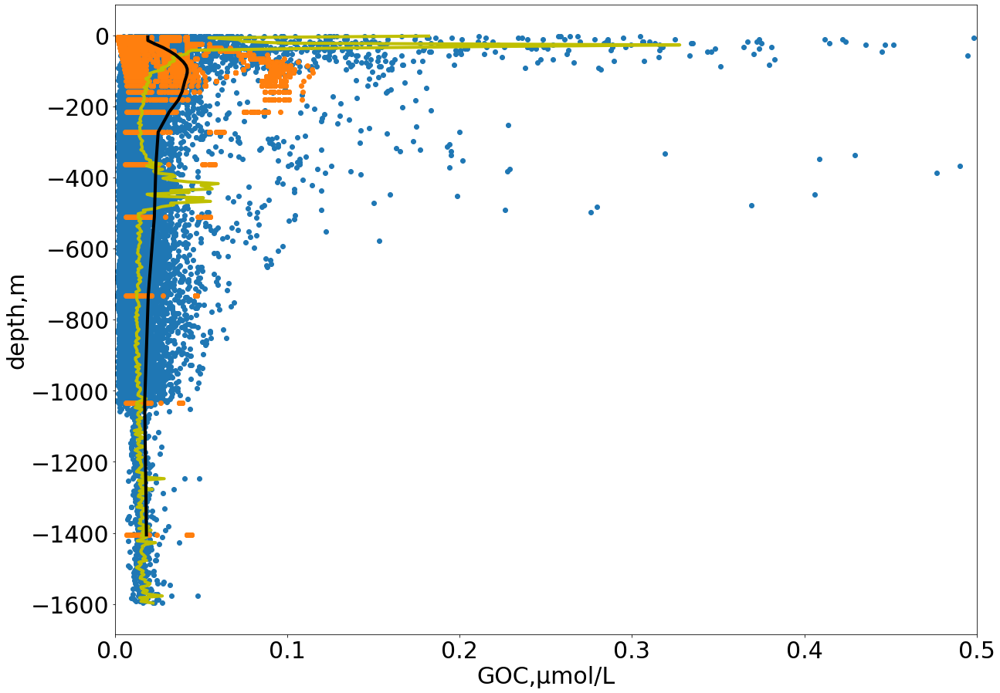

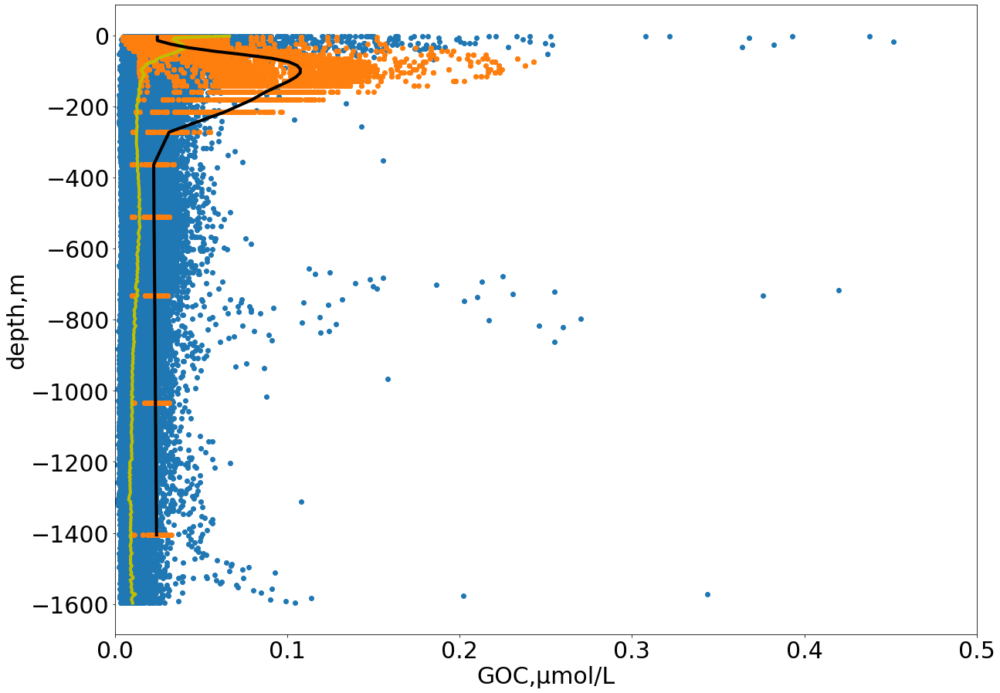

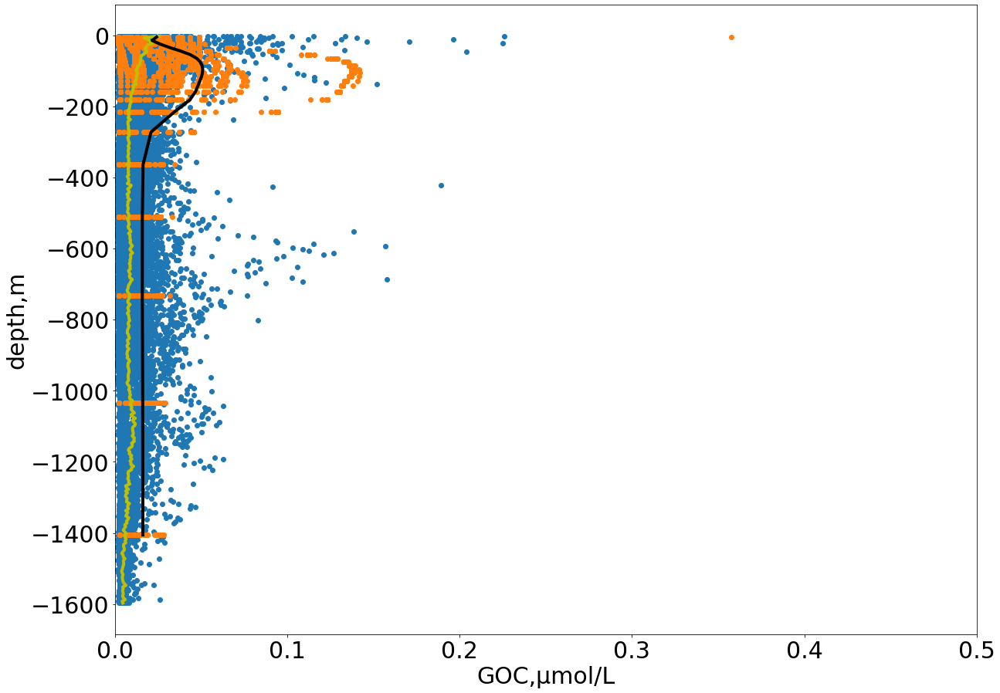

...

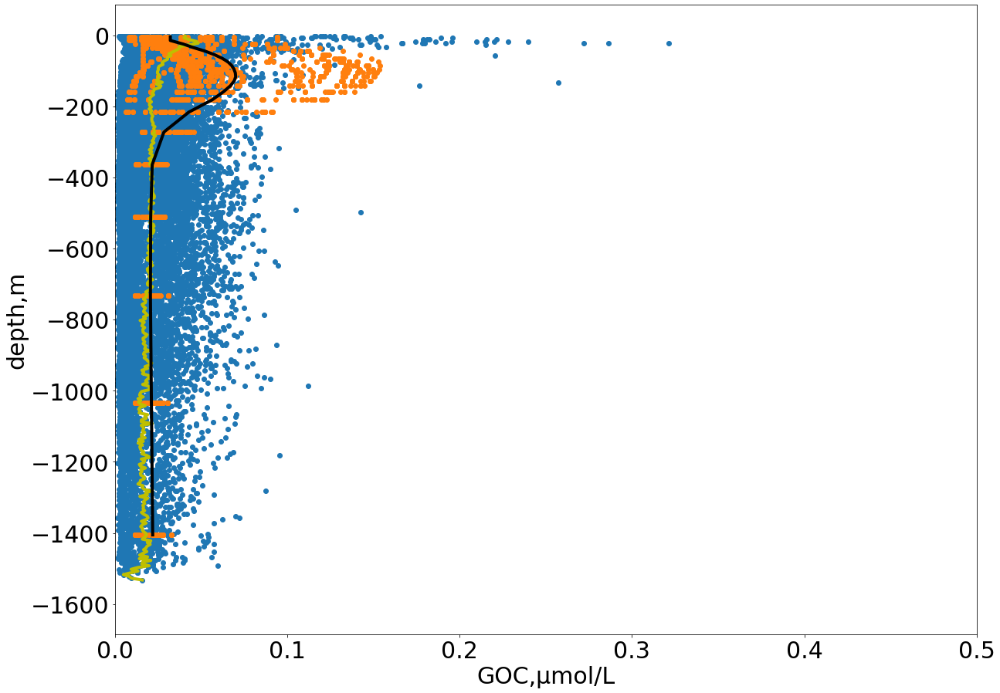

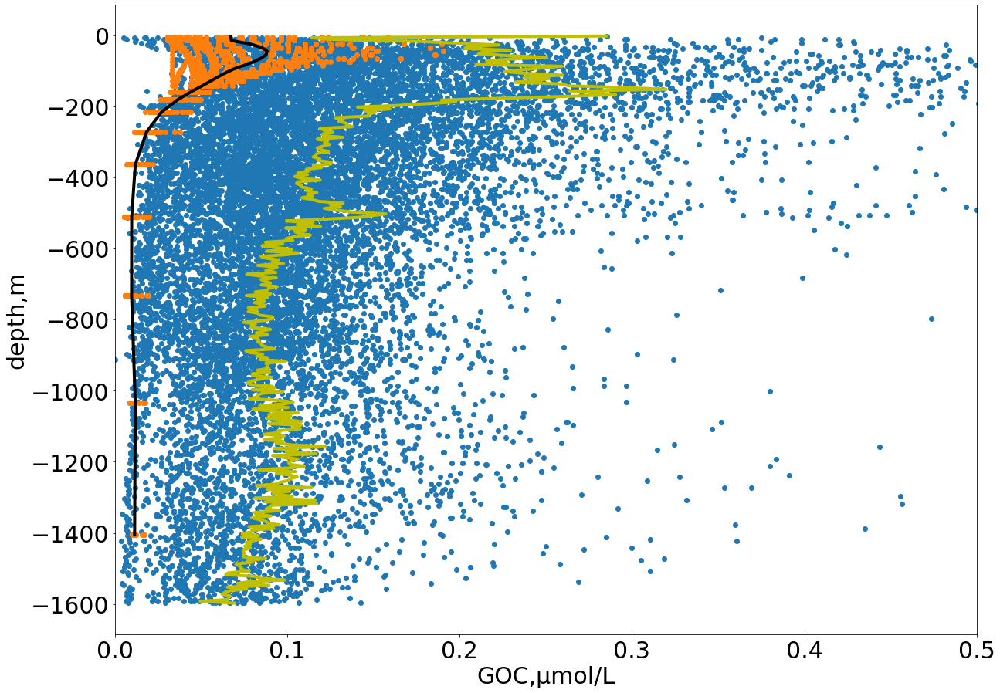

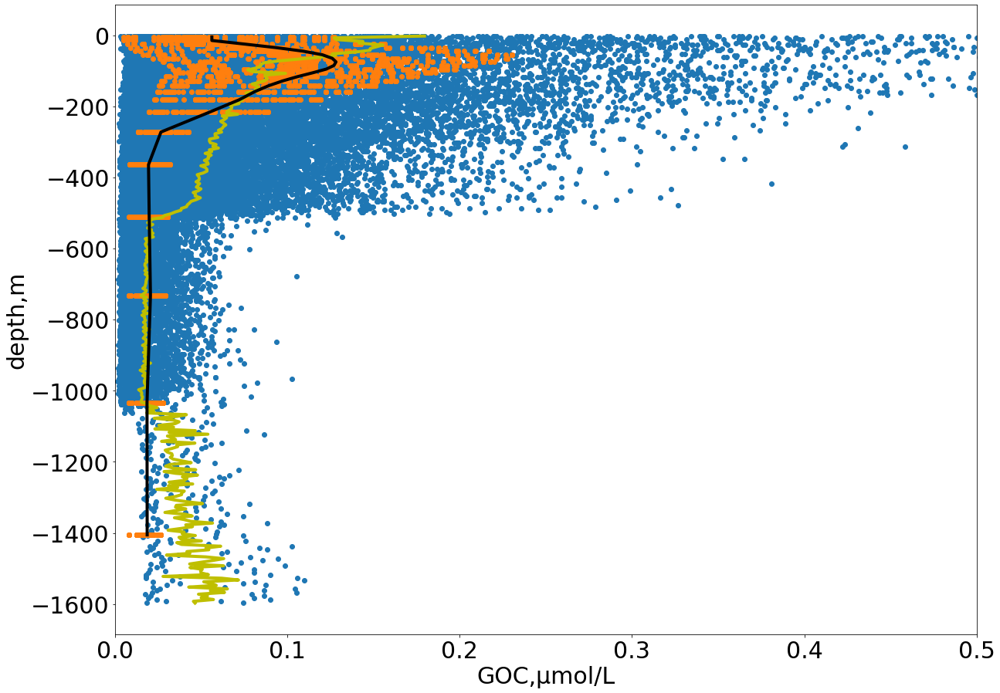

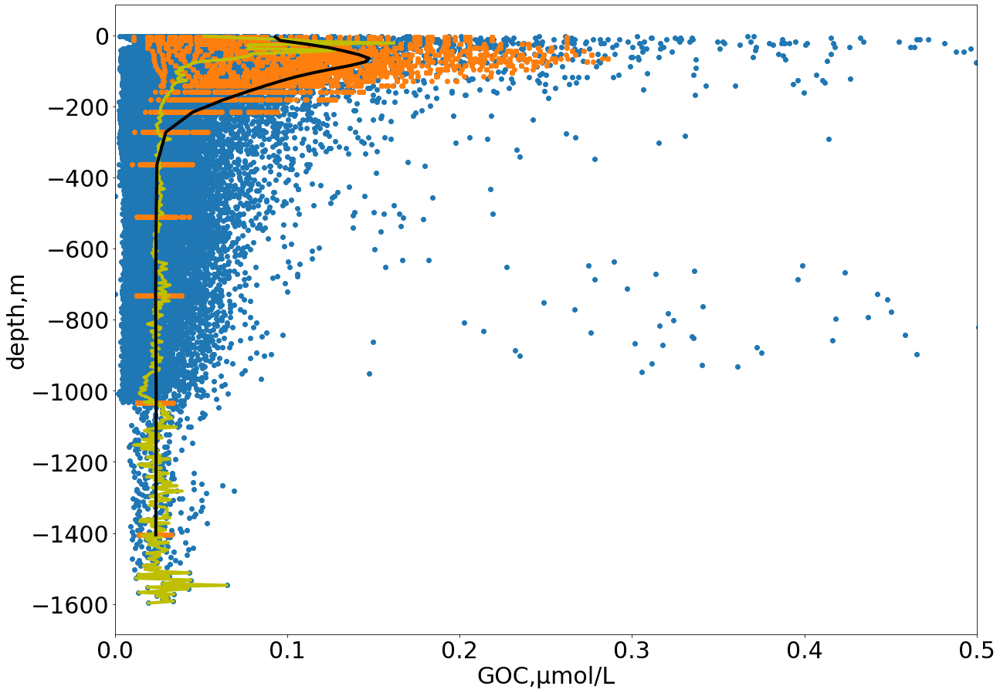

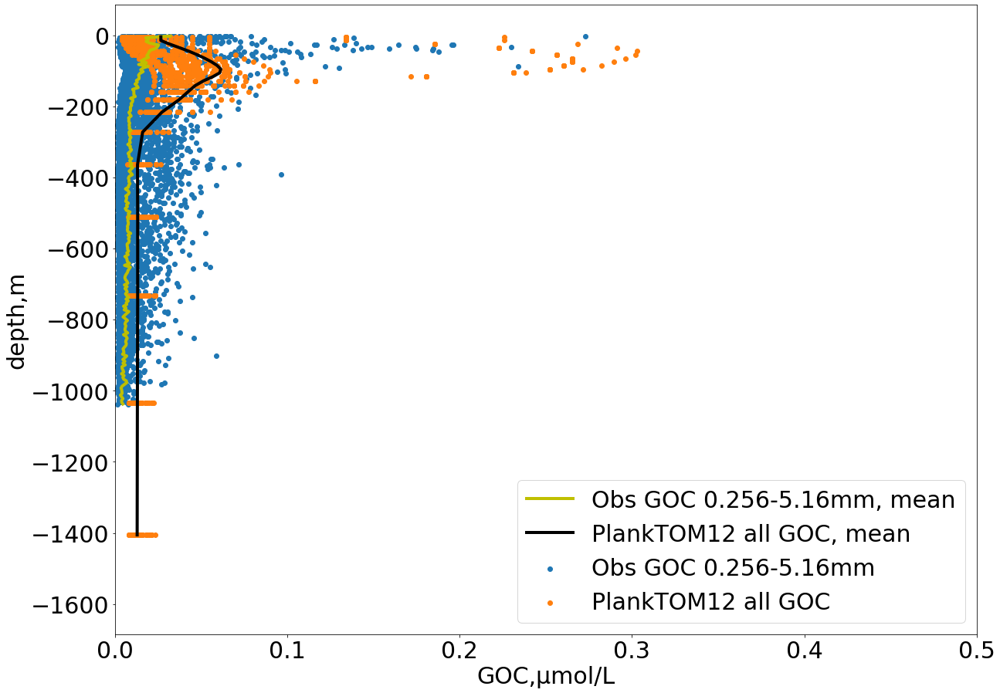

In [413]:
for zone in zone_names:
    if zone != 'zone12':
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'GOC','GOC_Mmol_wvL','GOC','Obs GOC 0.256-5.16mm','PlankTOM12 all GOC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_GOC_'+zone+'.png',legend_sw='off',ylim_sw='on')
    else:
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'GOC','GOC_Mmol_wvL','GOC','Obs GOC 0.256-5.16mm','PlankTOM12 all GOC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_GOC_'+zone+'.png',legend_sw='on',ylim_sw='on')

In [ ]:
#plot Figire S2

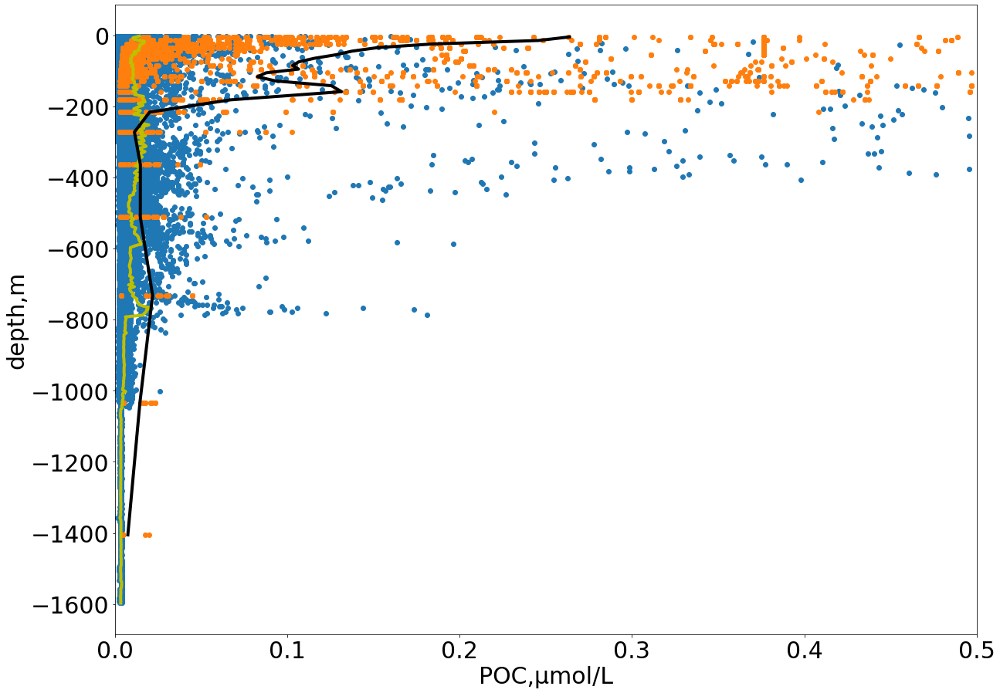

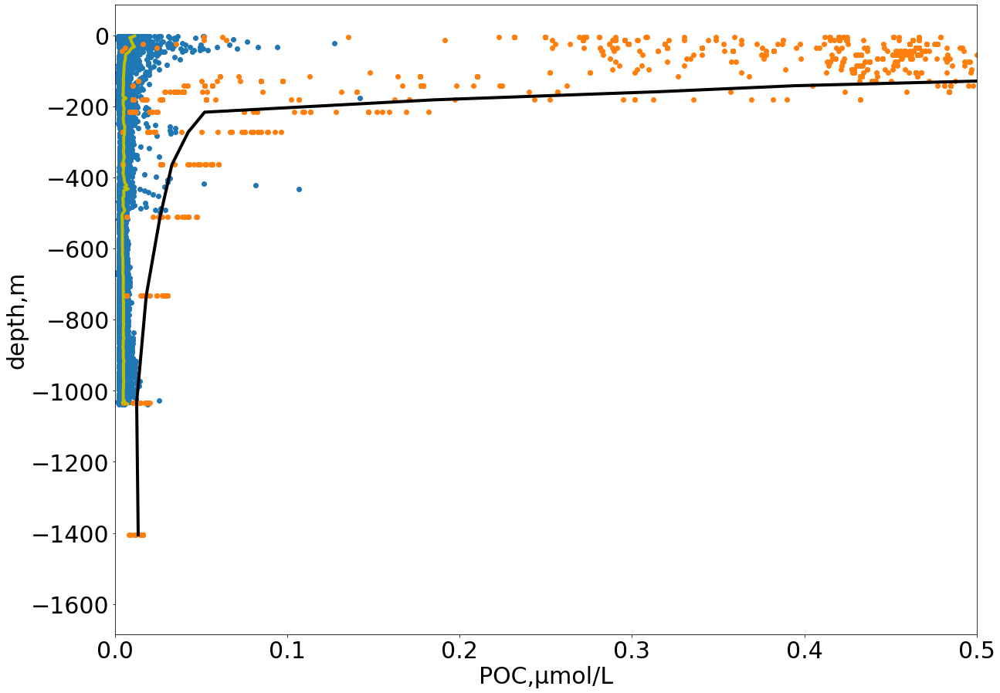

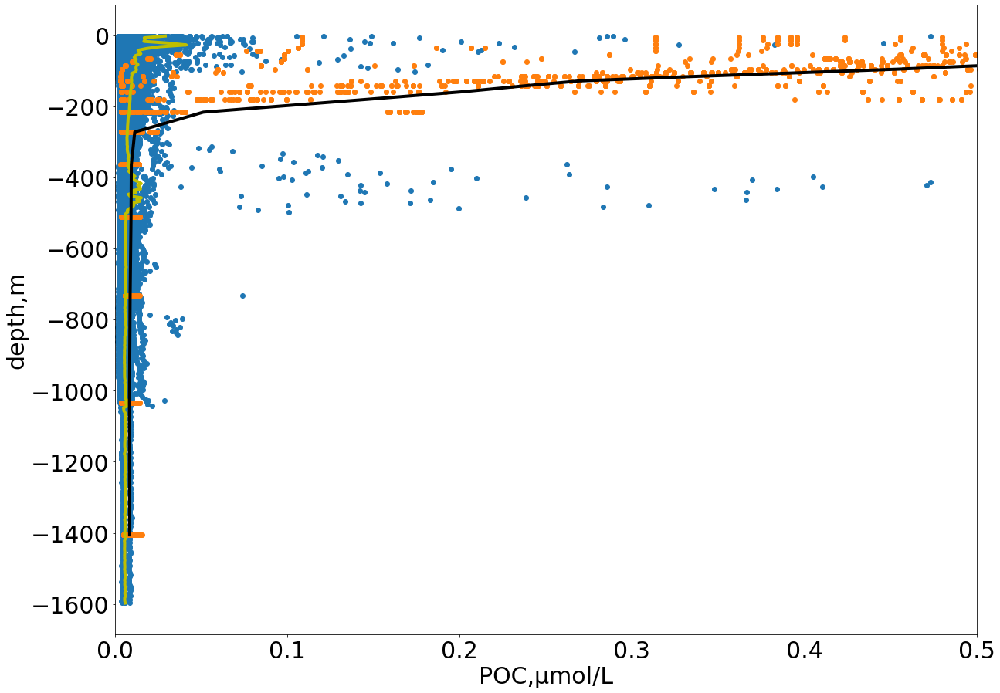

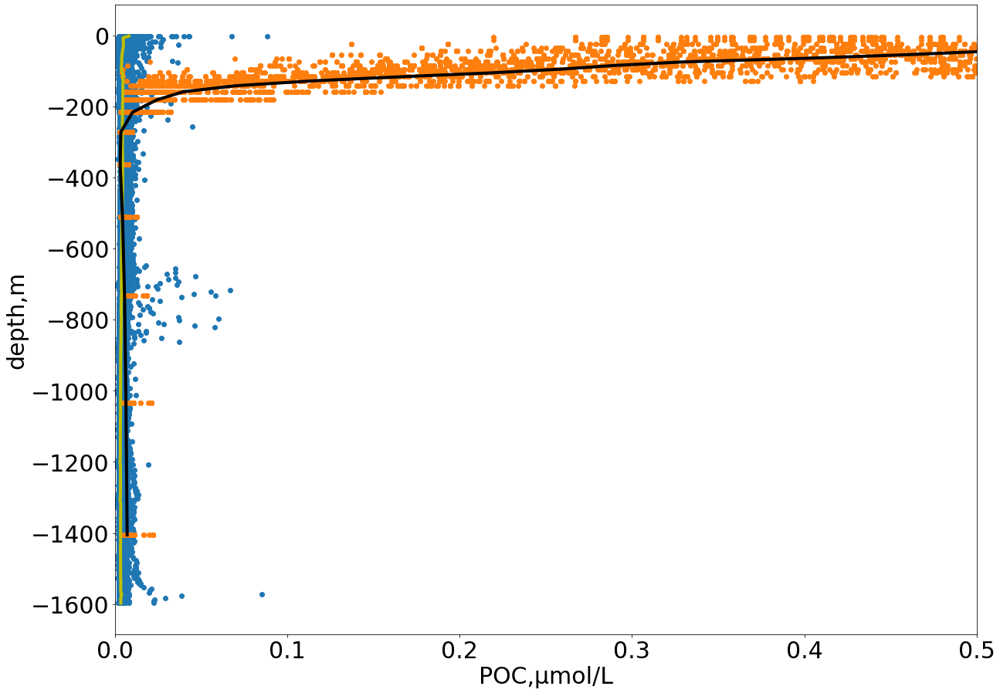

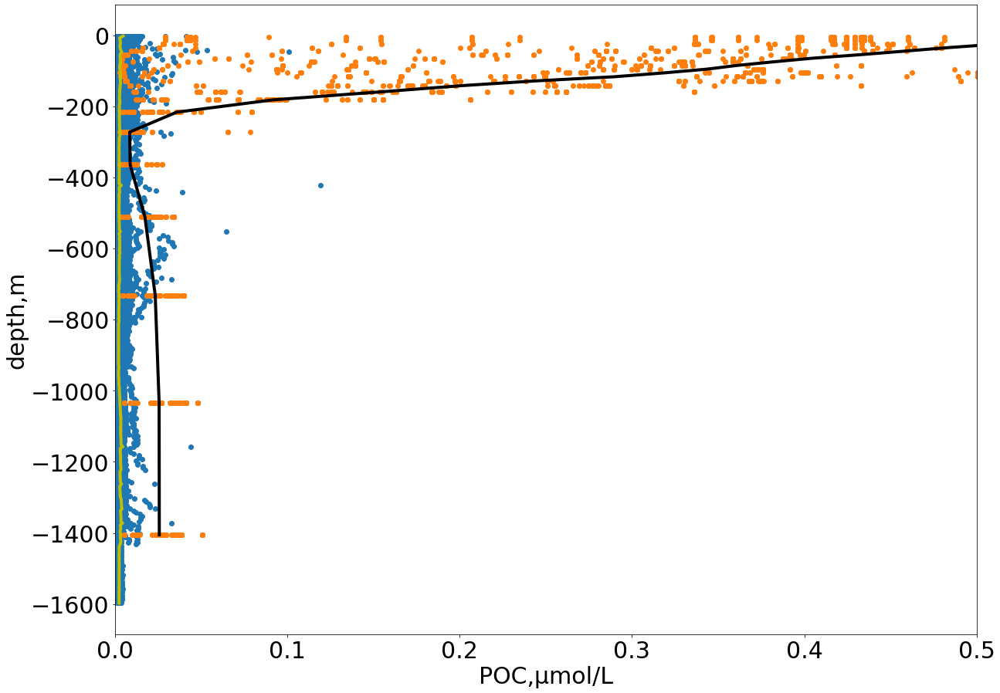

...

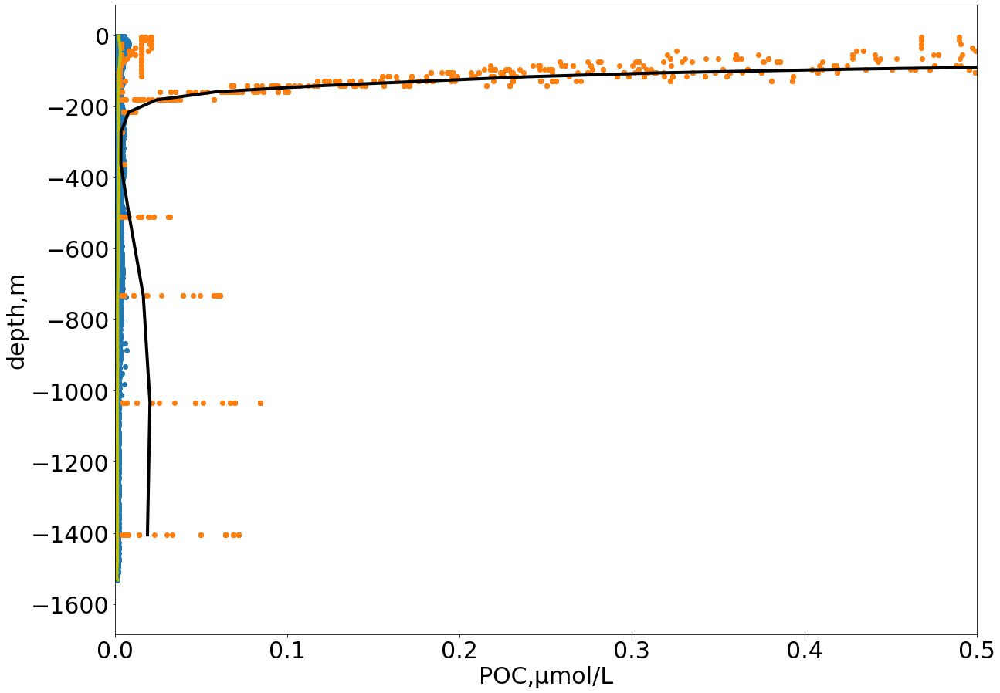

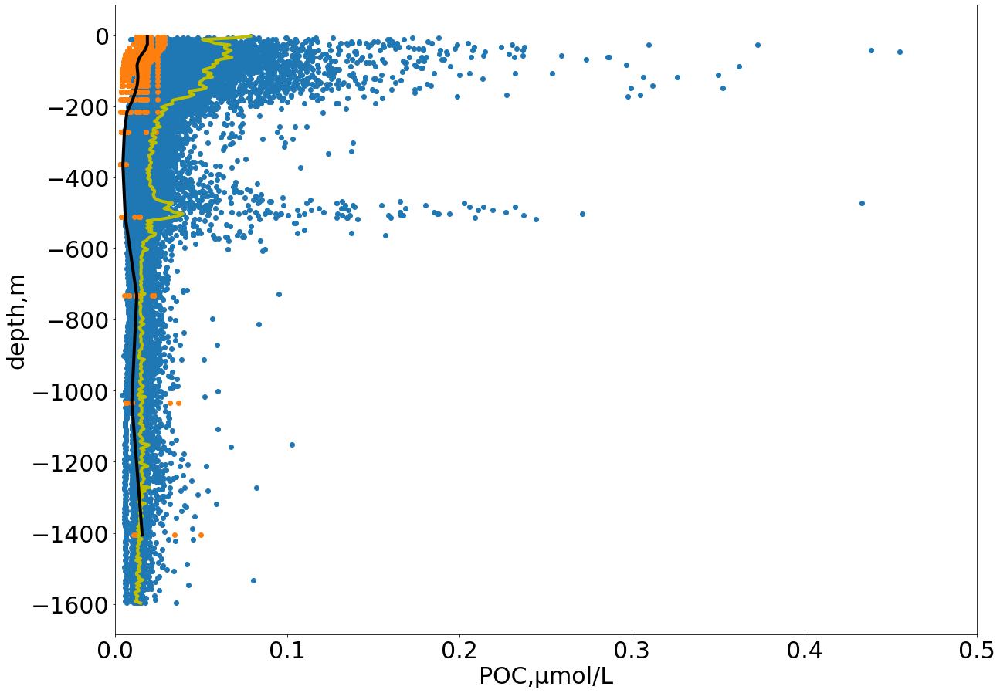

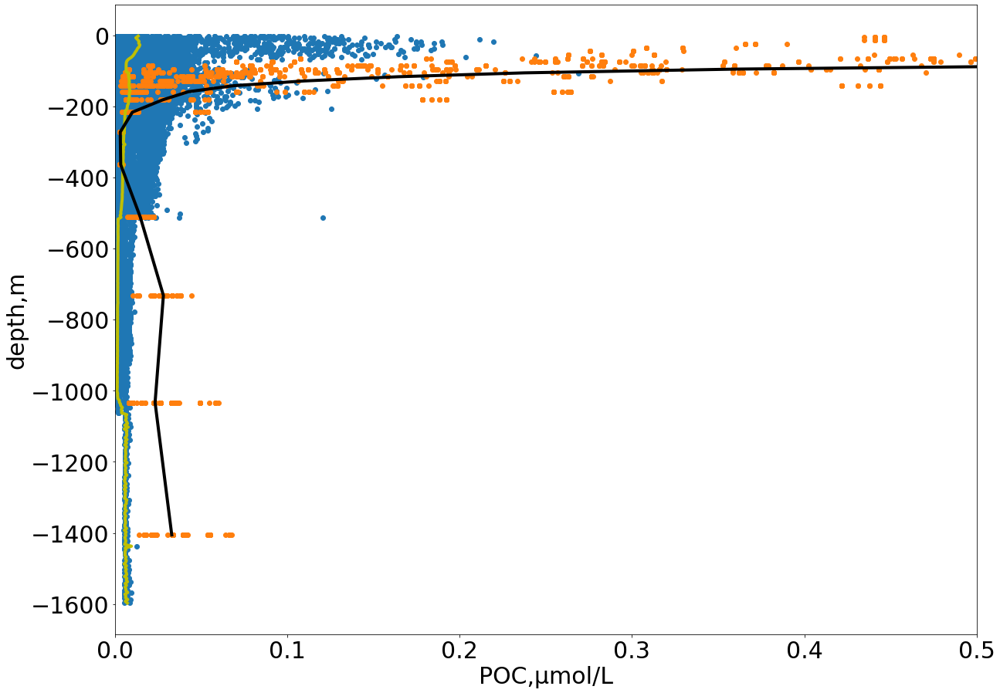

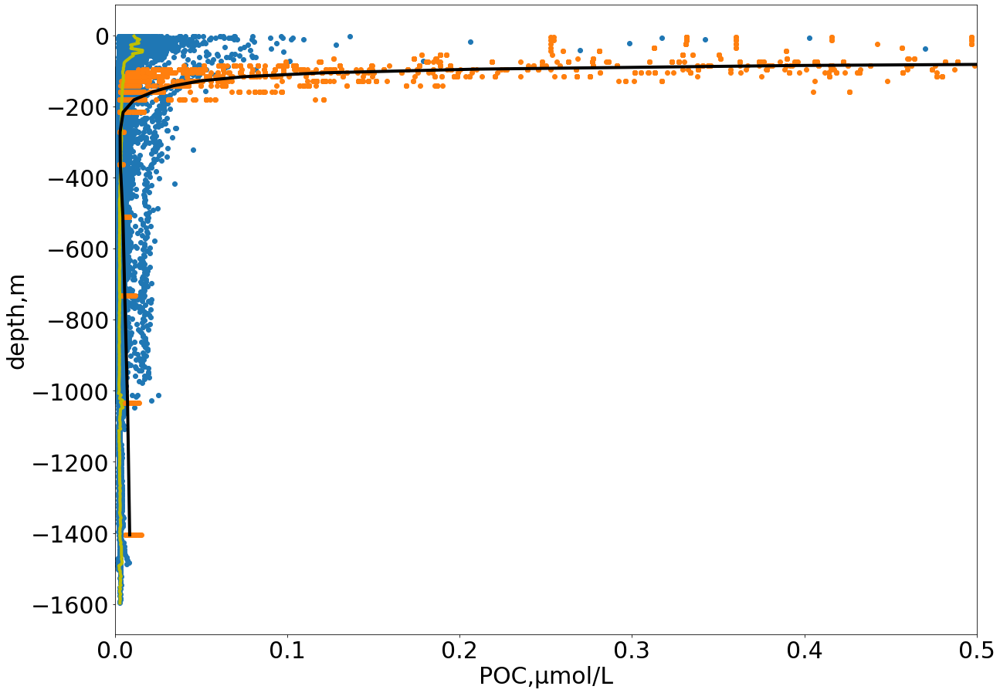

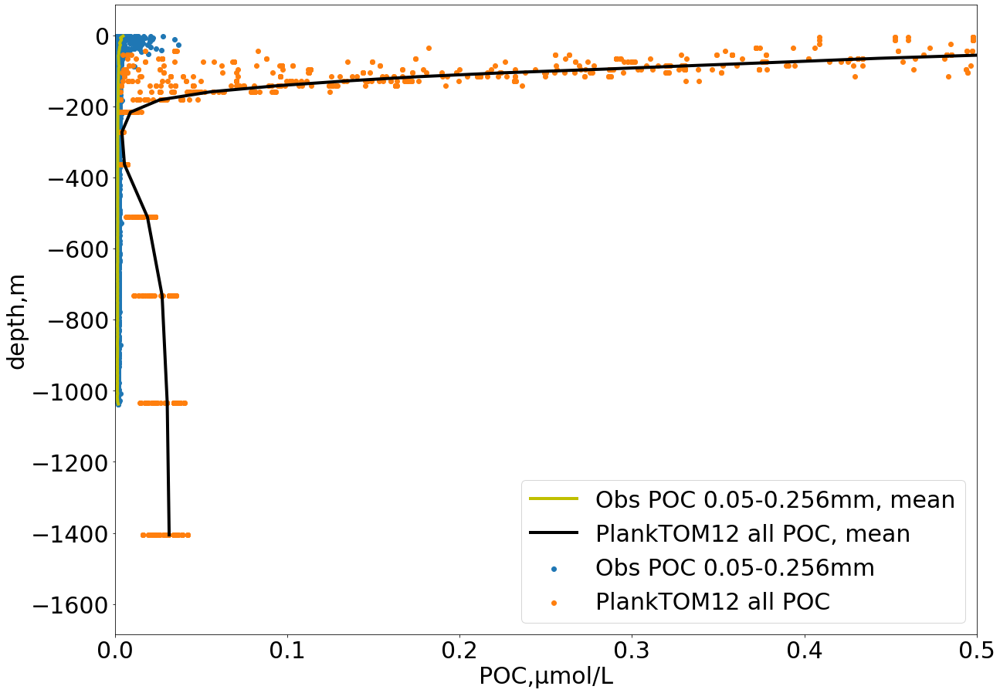

In [415]:
for zone in zone_names:
    if zone != 'zone12':
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'POC','POC_Mmol_wvL','POC','Obs POC 0.05-0.256mm','PlankTOM12 all POC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_POC_'+zone+'.png',legend_sw='off',ylim_sw='on')
    else:
        plot_scatter_two_df(globals()["All_Data_tot_OBS_RK_extr_"+zone],globals()["All_Data_Pl_All_RK_new_"+zone],\
                            'POC','POC_Mmol_wvL','POC','Obs POC 0.05-0.256mm','PlankTOM12 all POC',0,0.5,\
                            'Scatter_PlankTOMDaily_All_RK_POC_'+zone+'.png',legend_sw='on',ylim_sw='on')